In [1]:
import os
import pickle
from itertools import combinations
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams, cycler
from matplotlib.cm import ScalarMappable
import seaborn as sns
import tensorflow as tf
from scipy.stats import pearsonr, gaussian_kde, ecdf
from sklearn.decomposition import PCA
import sys
sys.path.append(os.path.join('c:\\', *os.getcwd().split('\\')[1:-1]))
from sgcc import *

In [2]:
plt.rcParams['figure.dpi'] = 300
fontsize = 8
linewidth = 0.5

In [3]:
plot_bounds = {
    "fts": [0, 175],
    "t": [40, 125],
    "ampc": [0.01, 0.1],
    'ampm': [0,3],
    "ampg": [0.1, 4],
    "ampw": [0.01,0.08],
    "d": [10, 40],
    "inh_d": [0, 40],
    "inh_w": [0, 3],
}

## Conditional optimization: Clipping temporal parameters

The purpose of this conditional optimization is to see what solutions the optimizer can come up with when certain temporal parameters are clipped:

1) Clip the frequency-time slopes in dLGN to 0. See if the model can still make coarse-to-fine responses in V1.

    a. Expectation: Coarse-to-fine V1 responses can still be achieved by temporally offsetting the dLGN inputs such that more high-pass responses occur later. However, this will not be able to explain as much of the variance. This will be reflected through a higher loss distribution.
2) Clip the frequency-time intercepts in dLGN to x & y. 

    a. Expectation: Temporally offset inputs explain a small amount of the variance in V1 response profiles. Loss distribution will be slightly larger but than the one from the main optimization protocol, but not significantly. 
3) Clip both the fts and fti. 

    a. Expectation: Both coarse-to-fine responses in dLGN and temporally offset inputs explain a majority of the variance in the V1 response. Clipping both will cause the largest loss distribution.

In [4]:
X = tf.convert_to_tensor([0.02,0.04,0.08,0.1,0.12,0.16,0.2,0.24,0.28,0.32], dtype = tf.float32)

In [5]:
v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'project_datafiles', 'v1_ori_phase_condition_pcascores_wcomp.pkl')
v1_scores = pd.read_pickle(v1_xs_file)
v1_scores_condition_averaged = np.array([np.array(x) for x in v1_scores.scores.values]).mean(0)
Y_true = v1_scores_condition_averaged[:2,:,:].transpose(0,2,1)

In [6]:
modfile = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'project_datafiles', 'sgcc_mop_3_11_26.pkl')
with open(modfile, 'rb') as f:
    optimized_model = pickle.load(f)

In [7]:
tv1_1 = optimized_model['param_history']['dLGN_params'][:,:,0,:,1,0,0].mean()
tv1_2 = optimized_model['param_history']['dLGN_params'][:,:,1,:,1,0,0].mean()


## Clip frequency-time slopes to 0:

In [8]:
param_bounds = {
    "fts": [0, 0],
    "t": [40, 125],
    "ampc": [0.01, 0.1],
    'ampm': [0,3],
    "ampg": [0.1, 4],
    "ampw": [0.01,0.08],
    "d": [10, 40],
    "inh_d": [0, 40],
    "inh_w": [0, 3],
}

In [9]:
model = SGCCircuit(param_bounds)

In [10]:
p = {x[0]:x[1] + tf.random.uniform(x[1].shape, -0.75, 0.75) 
    for x in optimized_model['final_epoch_params'].items()}

In [11]:
model.load_saved_parameters(p)

In [12]:
# initialize the optimizer
optimizer = Optimize(model, epochs=2500, loss_threshold=0)

# fit the model
optimizer.fit(X, Y_true)

Optimizer initialized with <keras.optimizers.optimizer_v2.adam.Adam object at 0x000002954BD59850>
Training step = 0, N_exploration_samples = 1000,
min_loss = 0.19185927510261536
med_loss = 0.7480905055999756
max_loss = 3.7623836994171143

Training step = 100, N_exploration_samples = 1000,
min_loss = 0.15599490702152252
med_loss = 0.4668157994747162
max_loss = 2.452138900756836

Training step = 200, N_exploration_samples = 1000,
min_loss = 0.14446797966957092
med_loss = 0.33499303460121155
max_loss = 1.6262363195419312

Training step = 300, N_exploration_samples = 1000,
min_loss = 0.1386139839887619
med_loss = 0.2620272636413574
max_loss = 1.1120915412902832

Training step = 400, N_exploration_samples = 1000,
min_loss = 0.13347138464450836
med_loss = 0.2175474464893341
max_loss = 0.7896867394447327

Training step = 500, N_exploration_samples = 1000,
min_loss = 0.1286122053861618
med_loss = 0.19174817204475403
max_loss = 0.583878219127655

Training step = 600, N_exploration_samples = 100

<tf.Tensor: shape=(2500, 1000), dtype=float16, numpy=
array([[0.5625 , 0.2815 , 0.4521 , ..., 0.724  , 1.642  , 2.387  ],
       [0.5596 , 0.2808 , 0.45   , ..., 0.7197 , 1.634  , 2.377  ],
       [0.5566 , 0.28   , 0.4475 , ..., 0.716  , 1.627  , 2.365  ],
       ...,
       [0.1324 , 0.1147 , 0.11755, ..., 0.12134, 0.1417 , 0.143  ],
       [0.1324 , 0.1147 , 0.11755, ..., 0.12134, 0.1416 , 0.143  ],
       [0.1324 , 0.1147 , 0.11755, ..., 0.12134, 0.1416 , 0.1428 ]],
      dtype=float16)>

In [13]:
optimizer.save_state('conditional_optimization_clipped_fts')

In [14]:
loss_decay = optimizer.outputs['loss_decay']

In [15]:
param_history = optimizer.outputs['param_history']

In [16]:
last_epoch = loss_decay[-1]
best = np.where(last_epoch == last_epoch.min())[0][0]
print(f"Index of best parameters: {best}, loss = {last_epoch[best]}")

Index of best parameters: 898, loss = 0.106201171875


In [17]:
def minmax_norm(array, lower, upper):
    if (array.max() - array.min()) != 0:
        norm = (array - array.min()) / (array.max() - array.min())
        return lower + (norm * (upper-lower))
    else:
        return array

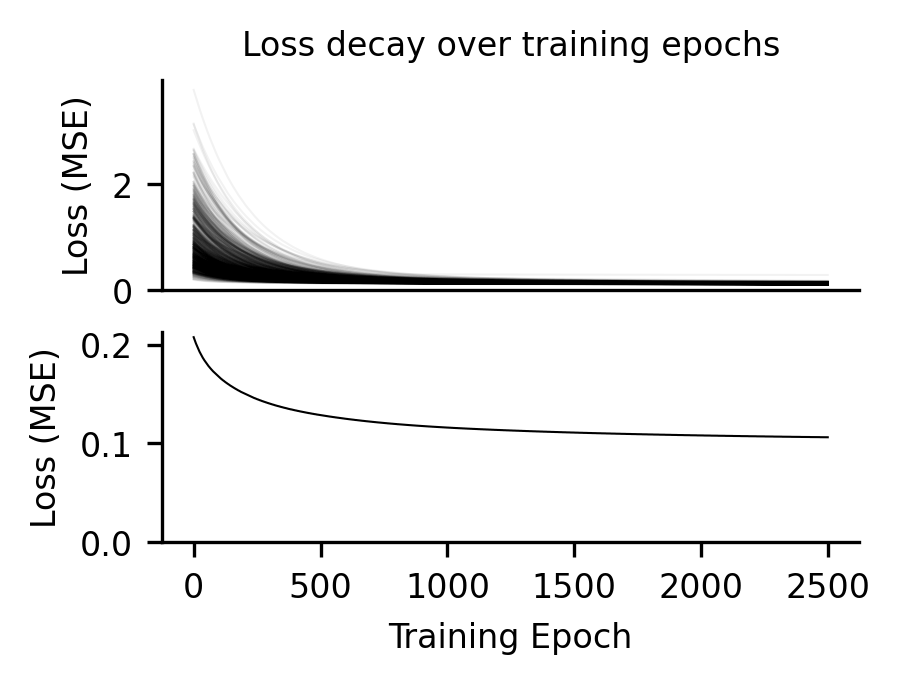

In [18]:
fig, ax = plt.subplots(2, figsize = (3,2))

for i, decay in enumerate(loss_decay.T):
    ax[0].plot(decay, alpha = 0.05, color = 'black', linewidth = linewidth)

ax[1].set_xlabel("Training Epoch", fontsize = fontsize)
ax[0].set_ylabel("Loss (MSE)", fontsize = fontsize)
ax[0].set_ylim(0,)
ax[0].set_xticks([])

ax[1].set_ylabel("Loss (MSE)", fontsize = fontsize)
ax[1].plot(loss_decay[:,best], alpha = 1, color = 'black', linewidth = linewidth)
ax[1].set_ylim(0.)
ax[0].set_title("Loss decay over training epochs", fontsize = fontsize)

for i in range(2):
    ax[i].tick_params(labelsize = fontsize)
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['right'].set_visible(False)

figname = '2d_model_loss_decay_first_round.svg'
savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
plt.savefig(savepath, transparent = False, facecolor = 'white',
           bbox_inches = 'tight', dpi = 300)

Text(0.5, 1.0, 'Loss distribution on final training epoch')

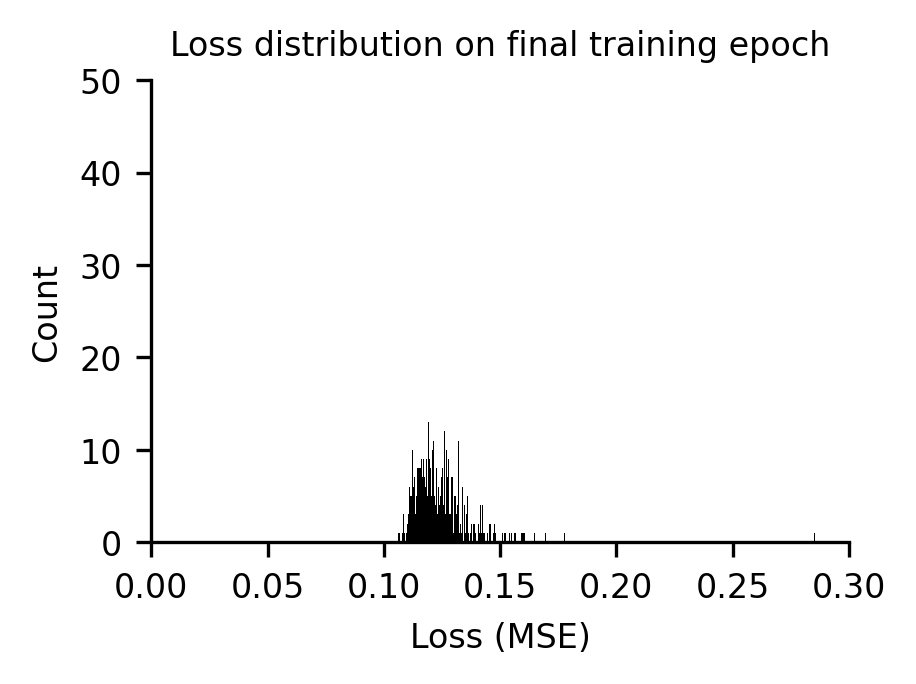

In [19]:
fig, ax = plt.subplots(figsize = (3,2))
ax.hist(loss_decay[-1], bins = 1000, color = 'black')
ax.tick_params(labelsize = fontsize)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_ylabel("Count", fontsize = fontsize)
ax.set_xlabel("Loss (MSE)", fontsize = fontsize)
ax.set_xticks(np.arange(0,0.35,0.05))
ax.set_ylim(0,50)
ax.set_title("Loss distribution on final training epoch", fontsize = fontsize)

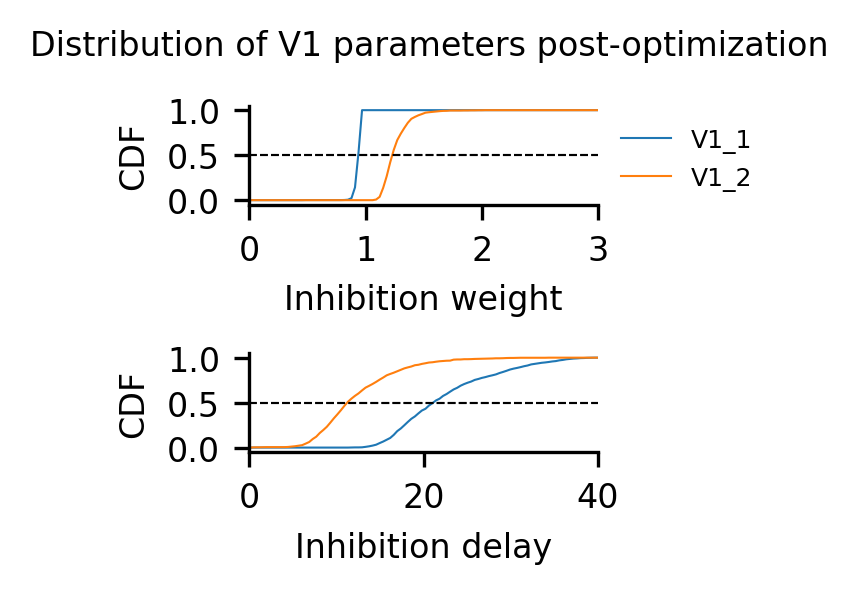

In [20]:
fig, ax = plt.subplots(2,1, figsize = (1.5, 1.5))

for i in range(2):
    i_ = np.abs(i-1)
    for u in range(2):
        x = np.linspace(
            list(plot_bounds.values())[-1-i][0],
            list(plot_bounds.values())[-1-i][1],
            100
        )
        data = param_history['V1_params'][:,-1,u,0,i_,0,0]
        kde = ecdf(data).cdf
        y = kde.evaluate(x)

        ax[i].plot(x,y, label = f'V1_{u+1}', linewidth = linewidth)
        ax[i].plot(x, np.full(len(x), 0.5), '--', color = 'black', linewidth = linewidth)
        ax[i].set_xlim(
            list(plot_bounds.values())[-1-i][0],
            list(plot_bounds.values())[-1-i][1]
        )
        ax[i].set_ylabel("CDF", fontsize = fontsize)
        ax[i].set_yticks(np.arange(0, 1.5, 0.5))
        ax[i].spines['top'].set_visible(False)
        ax[i].spines['right'].set_visible(False)
        ax[i].tick_params(labelsize = fontsize)

ax[0].set_xlabel('Inhibition weight', fontsize = fontsize)
ax[1].set_xlabel('Inhibition delay', fontsize = fontsize)
ax[0].legend(fontsize = 6, frameon = False, bbox_to_anchor = (1,1))
fig.subplots_adjust(hspace=1.5)
plt.suptitle("Distribution of V1 parameters post-optimization", fontsize = fontsize, x = 0.525, y = 1.05)

figname = '2d_model_v1_param_density_func_first_round.svg'
savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
plt.savefig(savepath, transparent = False, facecolor = 'white',
           bbox_inches = 'tight', dpi = 300)

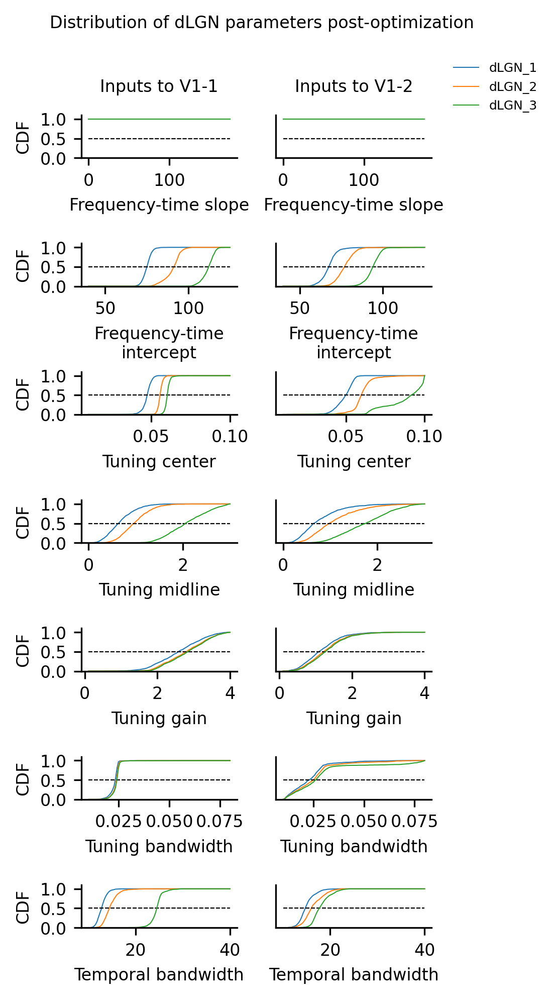

In [21]:
fig, ax = plt.subplots(7,2, figsize = (3,7))

param_labels = [
    'Frequency-time slope',
    'Frequency-time\nintercept',
    'Tuning center',
    'Tuning midline',
    'Tuning gain',
    'Tuning bandwidth',
    'Temporal bandwidth'
]

neuron_labels = [f'dLGN_{i+1}' for i in range(3)]


for row in range(7):
    ymax = []
    for i in range(3):
        for u in range(2):
            data = param_history['dLGN_params'][:,-1,u,i,row,0,0]
            x = np.linspace(
                list(plot_bounds.values())[:7][row][0],
                list(plot_bounds.values())[:7][row][1], 
                100
            )
            kde = ecdf(data).cdf
            y = kde.evaluate(x)

            ymax.append(y.max())

            ax[row, u].plot(x, np.full(len(x), 0.5), '--', color = 'black', linewidth = linewidth)
            ax[row, u].plot(x, y, label = neuron_labels[i], linewidth = linewidth)
            ax[row, u].set_xlabel(param_labels[row], fontsize = fontsize)
            ax[row, u].tick_params(labelsize = fontsize)

    ax[row, 0].set_ylabel("CDF", fontsize = fontsize)
    for u in range(2):
        ax[row, u].set_ylim(0, 1.1)
        ax[row, 1].set_yticks([])
        ax[row, 0].set_yticks(np.arange(0, 1.5, 0.5))
        ax[row, u].spines['top'].set_visible(False)
        ax[row, u].spines['right'].set_visible(False)

fig.subplots_adjust(hspace = 2, wspace=0.25)
plt.tick_params(labelsize = 8)
ax[0,1].legend(fontsize = 6, bbox_to_anchor = (1.75,2.5), frameon = False)
ax[0,0].set_title("Inputs to V1-1", fontsize = fontsize, y = 1.25)
ax[0,1].set_title("Inputs to V1-2", fontsize = fontsize, y = 1.25)
plt.suptitle("Distribution of dLGN parameters post-optimization", fontsize = fontsize, x = 0.525, y = 0.975)

figname = '2d_model_dlgn_param_density_func_first_round.svg'
savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
plt.savefig(savepath, transparent = False, facecolor = 'white',
           bbox_inches = 'tight', dpi = 300)

Text(0.5, 1.15, 'Convergence of V1 parameter values')

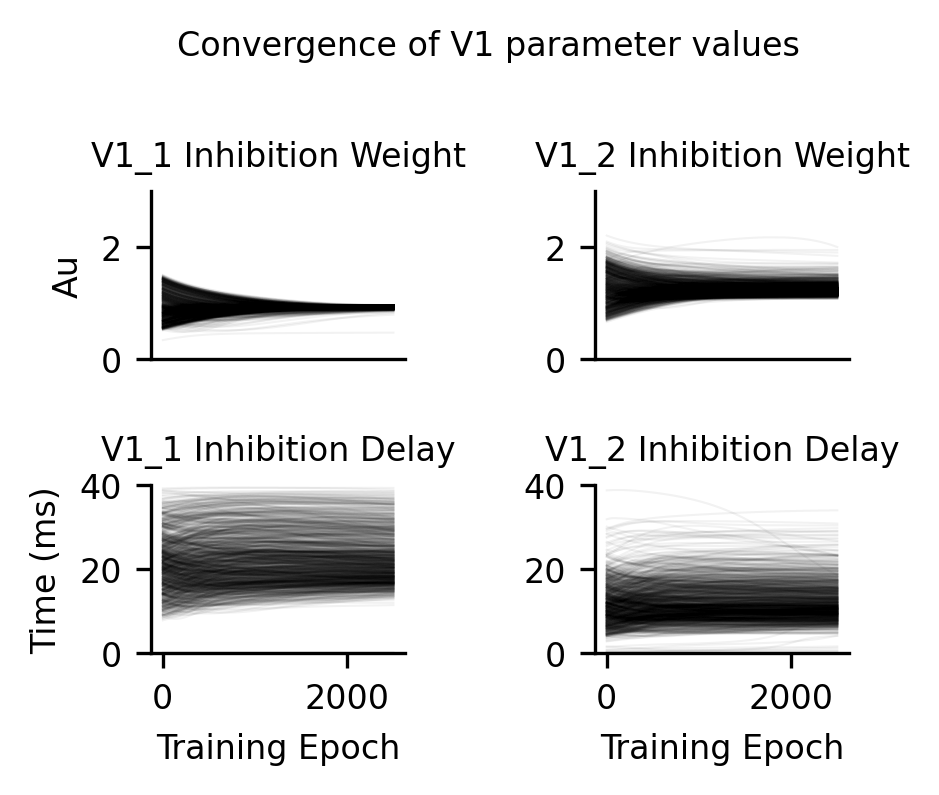

In [22]:
## inhibition weight::inhibition delay

fig, ax = plt.subplots(2,2, figsize = (3,2))

inh_w = 1
v1_n = 0 

for row in range(2):
    for col in range(2):
        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

ax[0,0].plot(
    param_history['V1_params'][:,:,v1_n,0,inh_w,0,0].T,
    linewidth=linewidth,
    alpha=0.05,
    color = 'black'
)

# 
v1_n = 1
ax[0,1].plot(
    param_history['V1_params'][:,:,v1_n,0,inh_w,0,0].T,
    linewidth=linewidth,
    alpha=0.05,
    color = 'black'
)

# a0
inh_d = 0
v1_n = 0
ax[1,0].plot(
    param_history['V1_params'][:,:,v1_n,0,inh_d,0,0].T,
    linewidth=linewidth,
    alpha=0.05,
    color = 'black'
)

# a1
v1_n = 1
ax[1,1].plot(
    param_history['V1_params'][:,:,v1_n,0,inh_d,0,0].T,
    linewidth=linewidth,
    alpha=0.05,
    color = 'black'
)

ax[0,0].set_ylim(plot_bounds['inh_w'][0], plot_bounds['inh_w'][1])
ax[0,0].set_title("V1_1 Inhibition Weight", fontsize = fontsize)
ax[0,0].set_xticks([])
ax[0,0].set_ylabel("Au", fontsize = fontsize)

ax[0,1].set_ylim(plot_bounds['inh_w'][0], plot_bounds['inh_w'][1])
ax[0,1].set_title("V1_2 Inhibition Weight", fontsize = fontsize)
ax[0,1].set_xticks([])

ax[1,0].set_ylim(plot_bounds['inh_d'][0], plot_bounds['inh_d'][1])
ax[1,0].set_title("V1_1 Inhibition Delay", fontsize = fontsize)
ax[1,0].set_ylabel("Time (ms)", fontsize = fontsize)
ax[1,0].set_xlabel("Training Epoch", fontsize = fontsize)

ax[1,1].set_ylim(plot_bounds['inh_d'][0], plot_bounds['inh_d'][1])
ax[1,1].set_title("V1_2 Inhibition Delay", fontsize = fontsize)
ax[1,1].set_xlabel("Training Epoch", fontsize = fontsize)
fig.subplots_adjust(wspace=0.75, hspace=0.75)
plt.suptitle("Convergence of V1 parameter values", fontsize = fontsize, y = 1.15)

# figname = '2d_model_v1_param_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

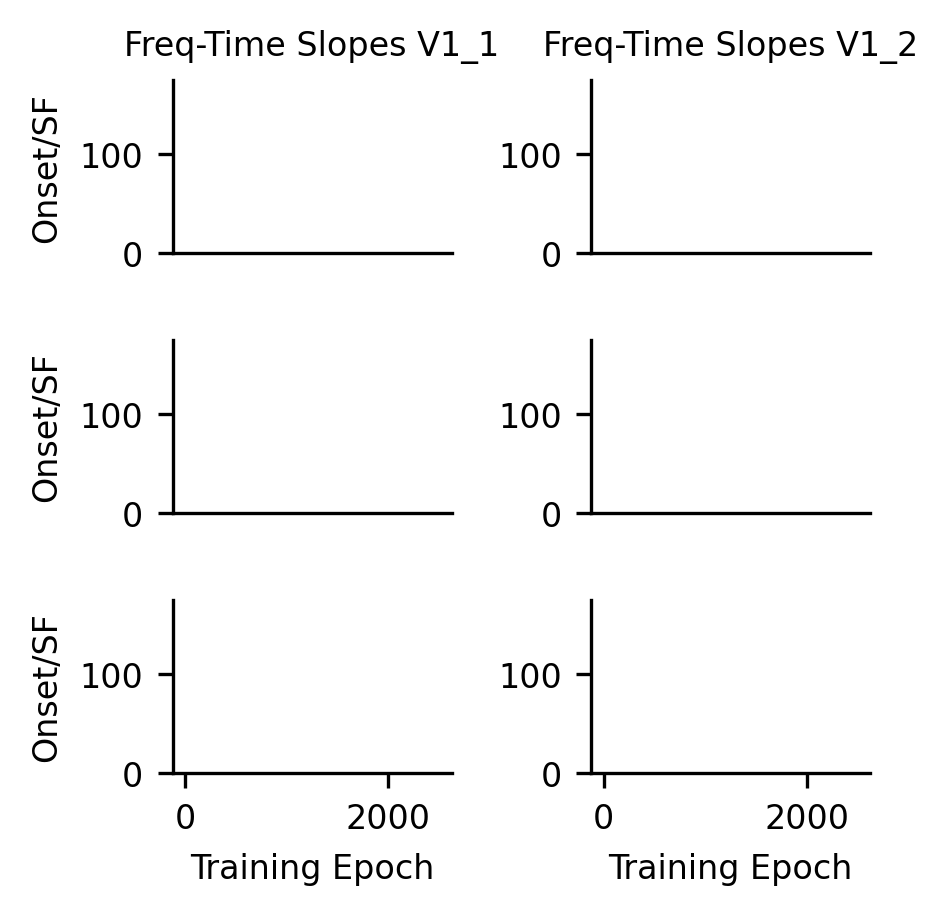

In [23]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 0

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Freq-Time Slopes V1_{i+1}", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Onset/SF", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['fts'][0], plot_bounds['fts'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_fts_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

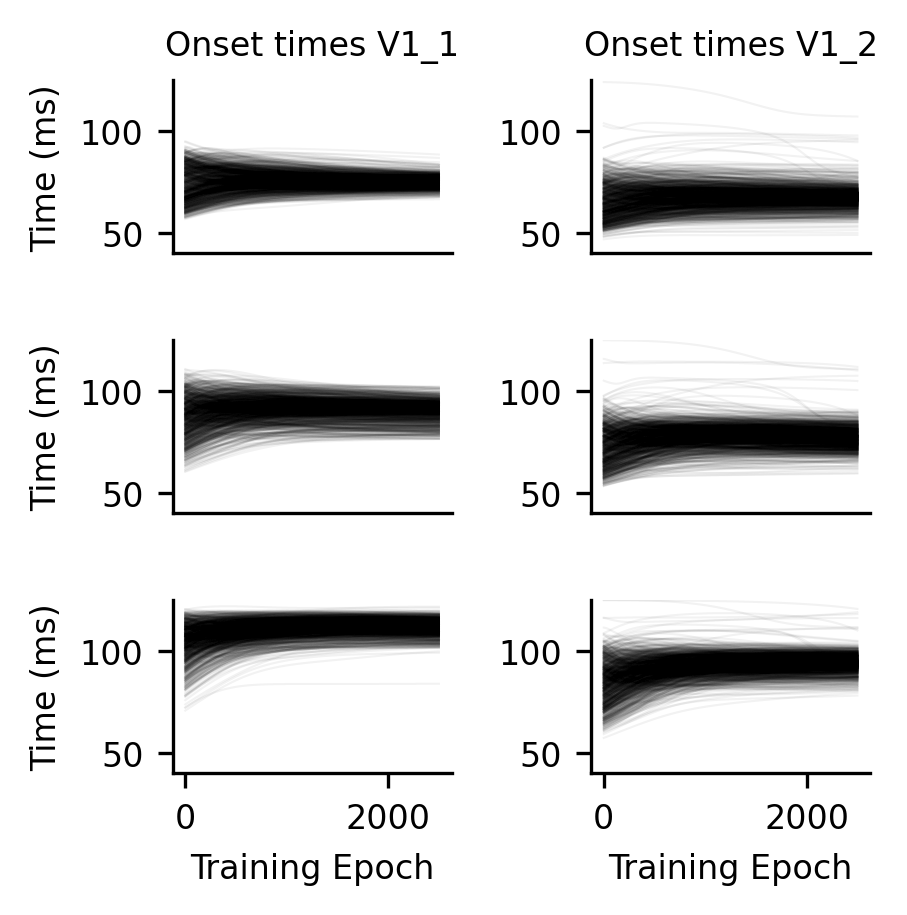

In [24]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 1

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Onset times V1_{i+1}", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Time (ms)", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['t'][0], plot_bounds['t'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_t_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

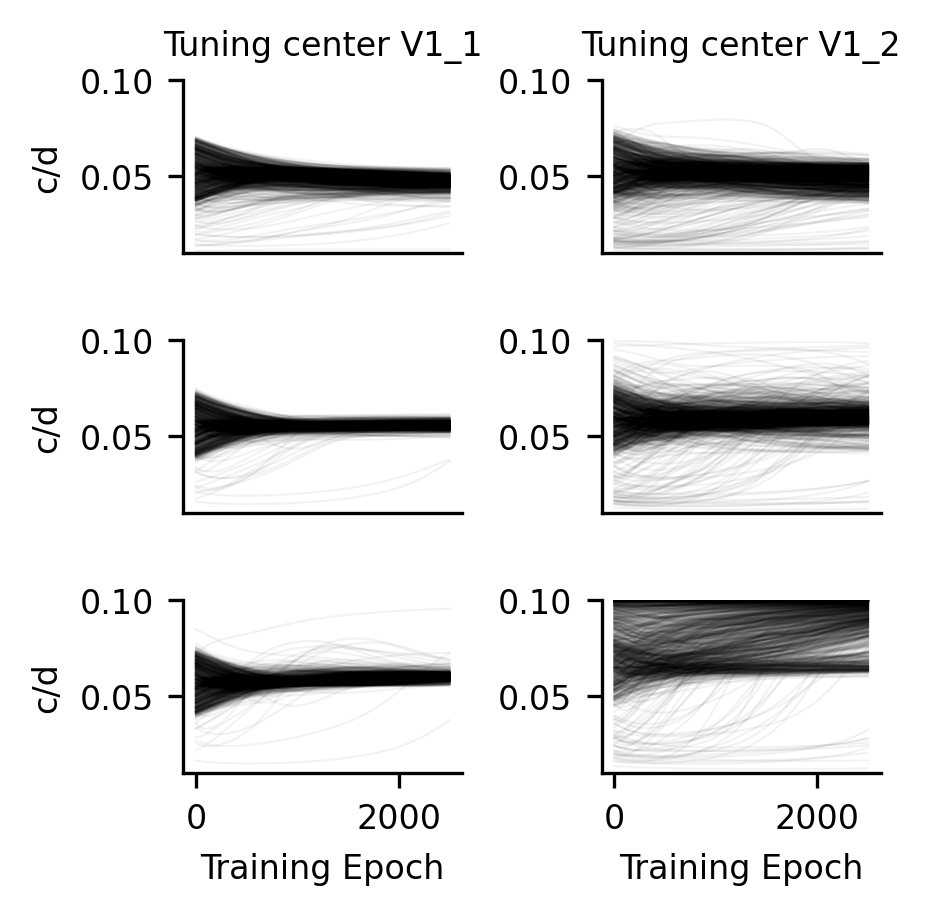

In [25]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 2

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Tuning center V1_{i+1}", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("c/d", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['ampc'][0], plot_bounds['ampc'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_ampc_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

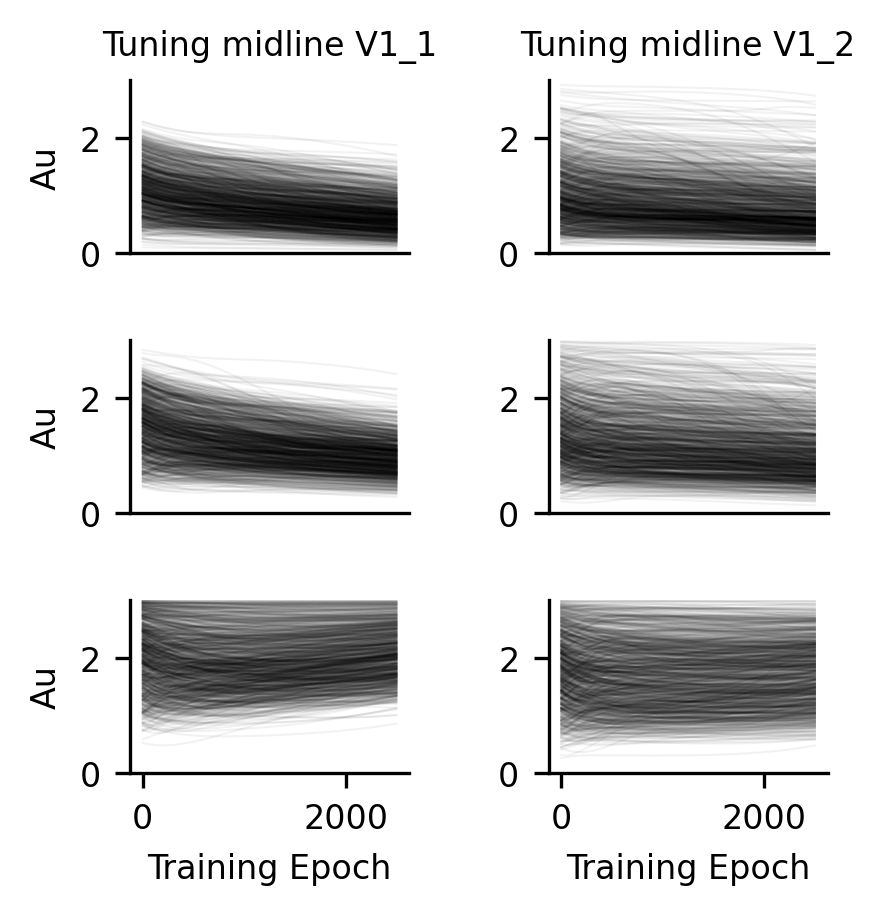

In [26]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 3

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Tuning midline V1_{i+1}", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Au", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['ampm'][0], plot_bounds['ampm'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_ampm_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

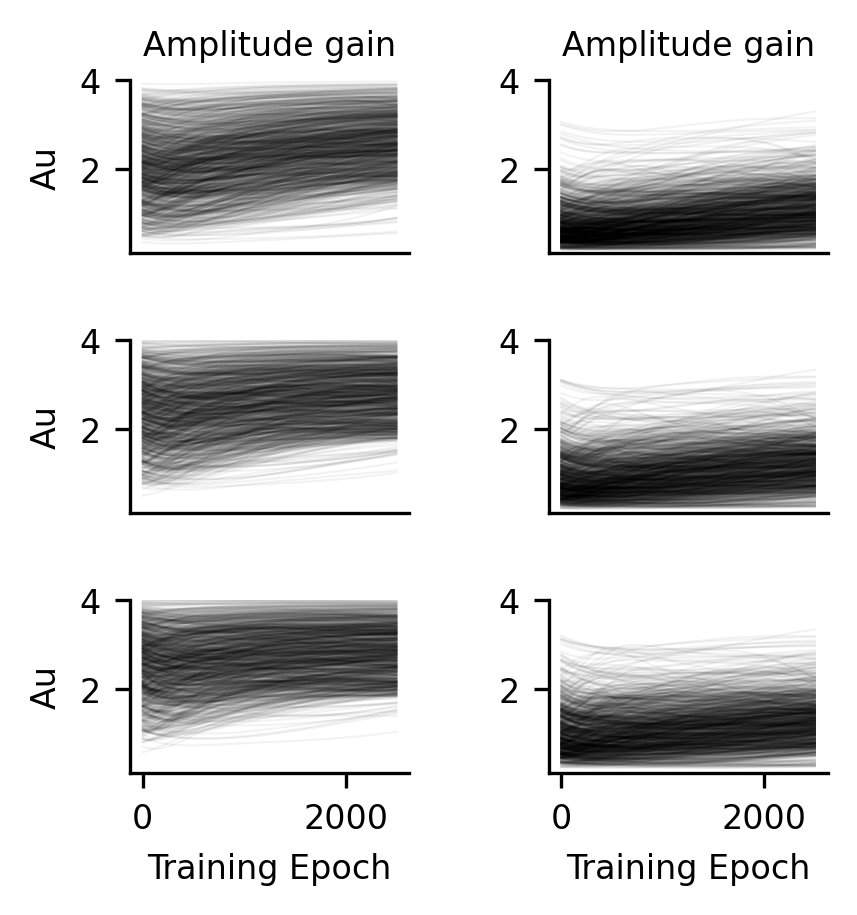

In [27]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 4

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Amplitude gain", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Au", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['ampg'][0], plot_bounds['ampg'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_ampg_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

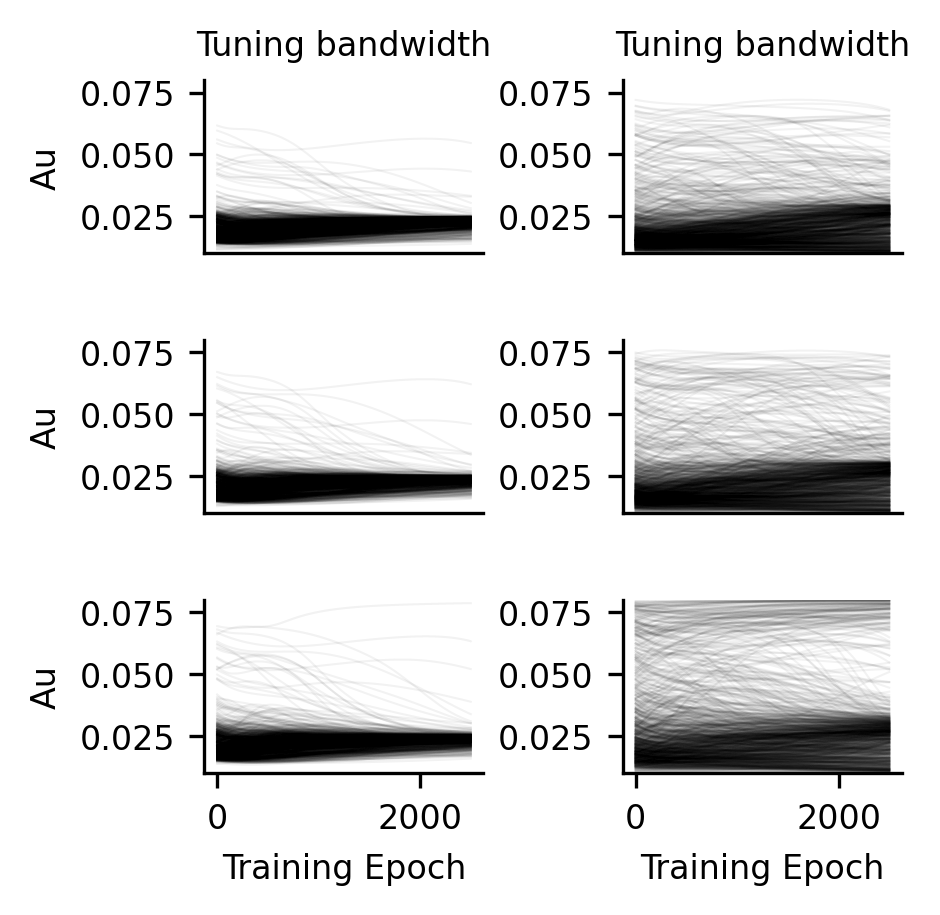

In [28]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 5

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Tuning bandwidth", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Au", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['ampw'][0], plot_bounds['ampw'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_ampw_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

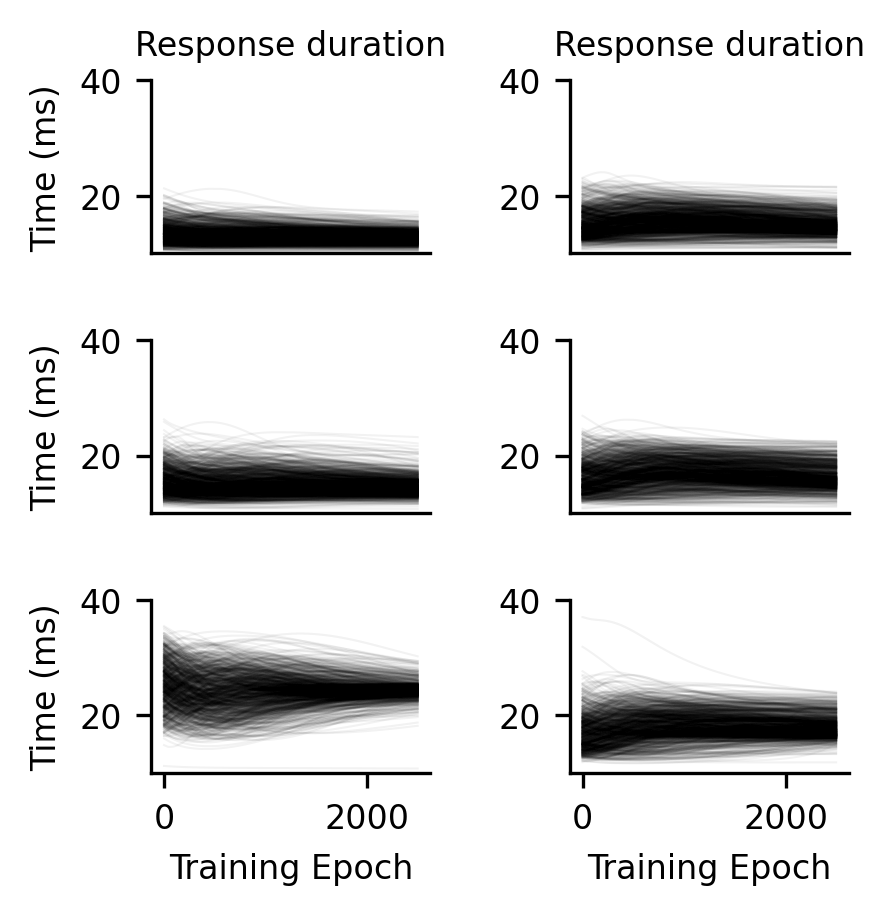

In [29]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 6

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Response duration", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Time (ms)", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['d'][0], plot_bounds['d'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_d_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

In [30]:
res = param_history['dLGN_params'].squeeze()
print(res.shape[2:])
n_samples, n_epochs = res.shape[:2]
n_params = np.prod(res.shape[2:])# + np.prod(r2.shape[2:])

res = res.reshape(res.shape[0] * res.shape[1], np.prod(res.shape[2:]))

(2, 3, 7)


In [31]:
pca = PCA() # all epochs included
res_transformed_pca = pca.fit_transform(res).reshape(n_samples, n_epochs, n_params)

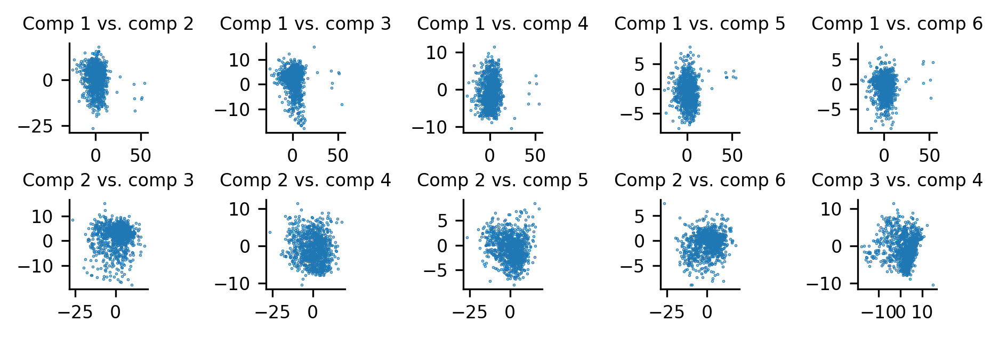

In [32]:
fig, ax = plt.subplots(2,5, figsize = (7,2))

comp_pairs = (list(combinations(np.arange(6), 2)))
i = 0
for row in range(2):
    for col in range(5):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        c0, c1 = comp_pairs[i]
        ax[row, col].scatter(res_transformed_pca[:,-1,c0], res_transformed_pca[:,-1,c1], s = 0.1) # last epoch
        ax[row, col].set_title(f"Comp {c0+1} vs. comp {c1+1}", fontsize = fontsize)
        i+=1

fig.subplots_adjust(hspace = 0.75, wspace = 1.5)
figname = '2d_model_pcaprojection_first_round.svg'
savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
plt.savefig(savepath, transparent = False, facecolor = 'white',
           bbox_inches = 'tight', dpi = 300)

In [33]:
lgn_params = [
    'Frequency-time slope',
    'Onset time',
    'Tuning center',
    'Tuning midline',
    'Tuning gain',
    'Tuning bandwidth',
    'Response duration'
]

v1_params = [
    'Inhibition delay',
    'Inhibition weight'
]

lgn_units = [
    'dLGN_1 into V1_1',
    'dLGN_2 into V1_1',
    'dLGN_3 into V1_1',
    'dLGN_1 into V1_2',
    'dLGN_2 into V1_2',
    'dLGN_3 into V1_2',
]

v1_units = [
    'V1_1',
    'V1_2'
]

full_lgn_params = []
for unit in lgn_units:
    for param in lgn_params:
        full_lgn_params.append(f"{param} ({unit})")

full_v1_params = []
for unit in v1_units:
    for param in v1_params:
        full_v1_params.append(f"{param} ({unit})")
        
param_names = full_lgn_params+full_v1_params

In [34]:
# for i in range(10):
#     fig, ax = plt.subplots(figsize = (8, 4))
#     ax.tick_params(labelsize = fontsize)
#     ax.spines['top'].set_visible(False)
#     ax.spines['right'].set_visible(False)
#     ax.bar(np.arange(len(full_lgn_params)), np.abs(pca.components_[i]))
#     ax.set_xticks(np.arange(len(full_lgn_params)))
#     ax.set_xticklabels(param_names[:len(full_lgn_params)], rotation = 90)
#     ax.set_ylabel("Loading scores", fontsize = fontsize)
#     ax.set_title(f"Component {i+1}", fontsize = fontsize)

#     figname = f'2d_model_pca_loadings_pc{i+1}_first_round.svg'
#     savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
#     plt.savefig(savepath, transparent = False, facecolor = 'white',
#             bbox_inches = 'tight', dpi = 300)

## Clip response durations

In [35]:
param_bounds = {
    "fts": [0, 175],
    "t": [40, 125],
    "ampc": [0.01, 0.1],
    'ampm': [0,3],
    "ampg": [0.1, 4],
    "ampw": [0.01,0.08],
    "d": [20, 20],
    "inh_d": [0, 40],
    "inh_w": [0, 3],
}

In [36]:
model = SGCCircuit(param_bounds)

In [37]:
p = {x[0]:x[1] + tf.random.uniform(x[1].shape, -0.75, 0.75) 
    for x in optimized_model['final_epoch_params'].items()}

In [38]:
model.load_saved_parameters(p)

In [39]:
# initialize the optimizer
optimizer = Optimize(model, epochs=2500, loss_threshold=0)

# fit the model
optimizer.fit(X, Y_true)

Optimizer initialized with <keras.optimizers.optimizer_v2.adam.Adam object at 0x000002983DB1E2B0>
Training step = 0, N_exploration_samples = 1000,
min_loss = 0.1786080151796341
med_loss = 0.635096549987793
max_loss = 2.794414758682251

Training step = 100, N_exploration_samples = 1000,
min_loss = 0.13360236585140228
med_loss = 0.3962833285331726
max_loss = 1.914292812347412

Training step = 200, N_exploration_samples = 1000,
min_loss = 0.11192023009061813
med_loss = 0.271903395652771
max_loss = 1.331807255744934

Training step = 300, N_exploration_samples = 1000,
min_loss = 0.10556190460920334
med_loss = 0.20645751059055328
max_loss = 0.9148642420768738

Training step = 400, N_exploration_samples = 1000,
min_loss = 0.10221759229898453
med_loss = 0.1710692048072815
max_loss = 0.6328760981559753

Training step = 500, N_exploration_samples = 1000,
min_loss = 0.10011570155620575
med_loss = 0.1504160463809967
max_loss = 0.47331365942955017

Training step = 600, N_exploration_samples = 1000,

<tf.Tensor: shape=(2500, 1000), dtype=float16, numpy=
array([[0.638  , 1.286  , 0.8843 , ..., 0.472  , 0.5703 , 0.7705 ],
       [0.6343 , 1.278  , 0.879  , ..., 0.4695 , 0.568  , 0.766  ],
       [0.63   , 1.2705 , 0.874  , ..., 0.4673 , 0.5654 , 0.7617 ],
       ...,
       [0.10144, 0.1025 , 0.10254, ..., 0.1017 , 0.1063 , 0.11194],
       [0.10144, 0.1025 , 0.10254, ..., 0.1017 , 0.1063 , 0.11194],
       [0.10144, 0.1025 , 0.10254, ..., 0.1017 , 0.1063 , 0.11194]],
      dtype=float16)>

In [40]:
optimizer.save_state('conditional_optimization_clipped_duration')

In [41]:
loss_decay = optimizer.outputs['loss_decay']

In [42]:
param_history = optimizer.outputs['param_history']

In [43]:
last_epoch = loss_decay[-1]
best = np.where(last_epoch == last_epoch.min())[0][0]
print(f"Index of best parameters: {best}, loss = {last_epoch[best]}")

Index of best parameters: 441, loss = 0.09100341796875


In [44]:
def minmax_norm(array, lower, upper):
    if (array.max() - array.min()) != 0:
        norm = (array - array.min()) / (array.max() - array.min())
        return lower + (norm * (upper-lower))
    else:
        return array

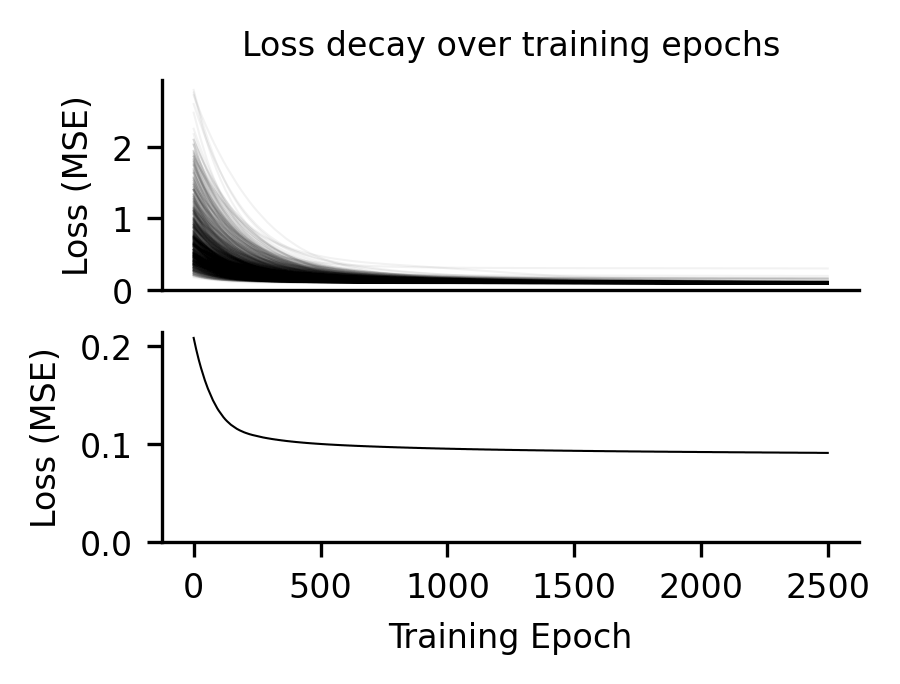

In [45]:
fig, ax = plt.subplots(2, figsize = (3,2))

for i, decay in enumerate(loss_decay.T):
    ax[0].plot(decay, alpha = 0.05, color = 'black', linewidth = linewidth)

ax[1].set_xlabel("Training Epoch", fontsize = fontsize)
ax[0].set_ylabel("Loss (MSE)", fontsize = fontsize)
ax[0].set_ylim(0,)
ax[0].set_xticks([])

ax[1].set_ylabel("Loss (MSE)", fontsize = fontsize)
ax[1].plot(loss_decay[:,best], alpha = 1, color = 'black', linewidth = linewidth)
ax[1].set_ylim(0.)
ax[0].set_title("Loss decay over training epochs", fontsize = fontsize)

for i in range(2):
    ax[i].tick_params(labelsize = fontsize)
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['right'].set_visible(False)

figname = '2d_model_loss_decay_first_round.svg'
savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
plt.savefig(savepath, transparent = False, facecolor = 'white',
           bbox_inches = 'tight', dpi = 300)

Text(0.5, 1.0, 'Loss distribution on final training epoch')

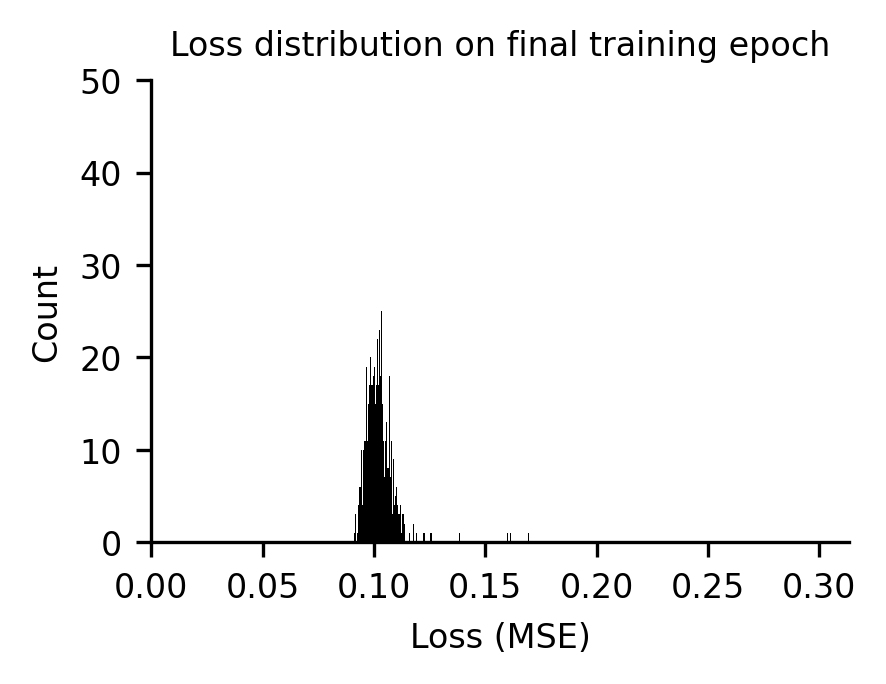

In [46]:
fig, ax = plt.subplots(figsize = (3,2))
ax.hist(loss_decay[-1], bins = 1000, color = 'black')
ax.tick_params(labelsize = fontsize)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_ylabel("Count", fontsize = fontsize)
ax.set_xlabel("Loss (MSE)", fontsize = fontsize)
ax.set_xticks(np.arange(0,0.35,0.05))
ax.set_ylim(0,50)
ax.set_title("Loss distribution on final training epoch", fontsize = fontsize)

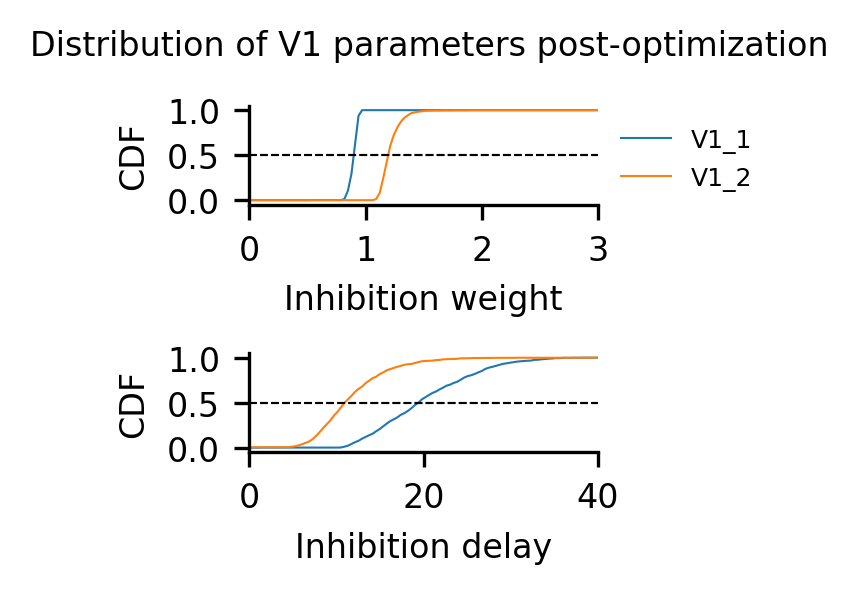

In [47]:
fig, ax = plt.subplots(2,1, figsize = (1.5, 1.5))

for i in range(2):
    i_ = np.abs(i-1)
    for u in range(2):
        x = np.linspace(
            list(plot_bounds.values())[-1-i][0],
            list(plot_bounds.values())[-1-i][1],
            100
        )
        data = param_history['V1_params'][:,-1,u,0,i_,0,0]
        kde = ecdf(data).cdf
        y = kde.evaluate(x)

        ax[i].plot(x,y, label = f'V1_{u+1}', linewidth = linewidth)
        ax[i].plot(x, np.full(len(x), 0.5), '--', color = 'black', linewidth = linewidth)
        ax[i].set_xlim(
            list(plot_bounds.values())[-1-i][0],
            list(plot_bounds.values())[-1-i][1]
        )
        ax[i].set_ylabel("CDF", fontsize = fontsize)
        ax[i].set_yticks(np.arange(0, 1.5, 0.5))
        ax[i].spines['top'].set_visible(False)
        ax[i].spines['right'].set_visible(False)
        ax[i].tick_params(labelsize = fontsize)

ax[0].set_xlabel('Inhibition weight', fontsize = fontsize)
ax[1].set_xlabel('Inhibition delay', fontsize = fontsize)
ax[0].legend(fontsize = 6, frameon = False, bbox_to_anchor = (1,1))
fig.subplots_adjust(hspace=1.5)
plt.suptitle("Distribution of V1 parameters post-optimization", fontsize = fontsize, x = 0.525, y = 1.05)

figname = '2d_model_v1_param_density_func_first_round.svg'
savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
plt.savefig(savepath, transparent = False, facecolor = 'white',
           bbox_inches = 'tight', dpi = 300)

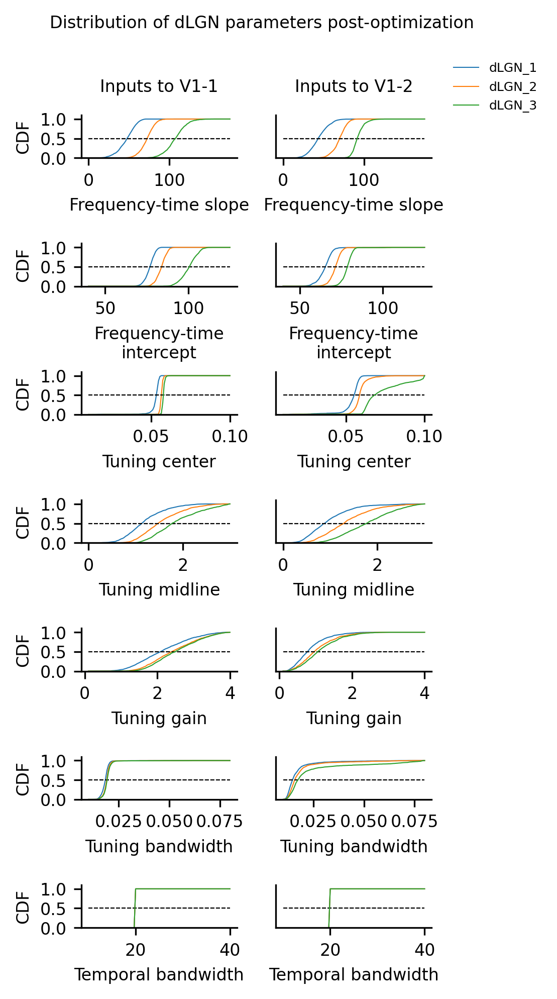

In [48]:
fig, ax = plt.subplots(7,2, figsize = (3,7))

param_labels = [
    'Frequency-time slope',
    'Frequency-time\nintercept',
    'Tuning center',
    'Tuning midline',
    'Tuning gain',
    'Tuning bandwidth',
    'Temporal bandwidth'
]

neuron_labels = [f'dLGN_{i+1}' for i in range(3)]


for row in range(7):
    ymax = []
    for i in range(3):
        for u in range(2):
            data = param_history['dLGN_params'][:,-1,u,i,row,0,0]
            x = np.linspace(
                list(plot_bounds.values())[:7][row][0],
                list(plot_bounds.values())[:7][row][1], 
                100
            )
            kde = ecdf(data).cdf
            y = kde.evaluate(x)

            ymax.append(y.max())

            ax[row, u].plot(x, np.full(len(x), 0.5), '--', color = 'black', linewidth = linewidth)
            ax[row, u].plot(x, y, label = neuron_labels[i], linewidth = linewidth)
            ax[row, u].set_xlabel(param_labels[row], fontsize = fontsize)
            ax[row, u].tick_params(labelsize = fontsize)

    ax[row, 0].set_ylabel("CDF", fontsize = fontsize)
    for u in range(2):
        ax[row, u].set_ylim(0, 1.1)
        ax[row, 1].set_yticks([])
        ax[row, 0].set_yticks(np.arange(0, 1.5, 0.5))
        ax[row, u].spines['top'].set_visible(False)
        ax[row, u].spines['right'].set_visible(False)

fig.subplots_adjust(hspace = 2, wspace=0.25)
plt.tick_params(labelsize = 8)
ax[0,1].legend(fontsize = 6, bbox_to_anchor = (1.75,2.5), frameon = False)
ax[0,0].set_title("Inputs to V1-1", fontsize = fontsize, y = 1.25)
ax[0,1].set_title("Inputs to V1-2", fontsize = fontsize, y = 1.25)
plt.suptitle("Distribution of dLGN parameters post-optimization", fontsize = fontsize, x = 0.525, y = 0.975)

figname = '2d_model_dlgn_param_density_func_first_round.svg'
savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
plt.savefig(savepath, transparent = False, facecolor = 'white',
           bbox_inches = 'tight', dpi = 300)

Text(0.5, 1.15, 'Convergence of V1 parameter values')

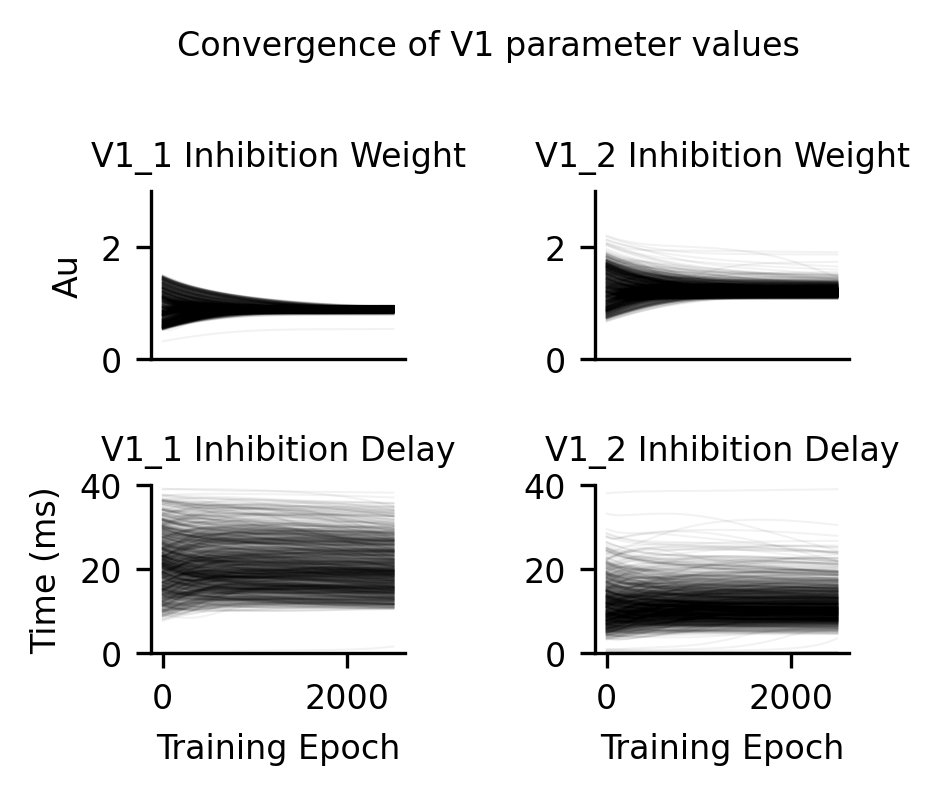

In [49]:
## inhibition weight::inhibition delay

fig, ax = plt.subplots(2,2, figsize = (3,2))

inh_w = 1
v1_n = 0 

for row in range(2):
    for col in range(2):
        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

ax[0,0].plot(
    param_history['V1_params'][:,:,v1_n,0,inh_w,0,0].T,
    linewidth=linewidth,
    alpha=0.05,
    color = 'black'
)

# 
v1_n = 1
ax[0,1].plot(
    param_history['V1_params'][:,:,v1_n,0,inh_w,0,0].T,
    linewidth=linewidth,
    alpha=0.05,
    color = 'black'
)

# a0
inh_d = 0
v1_n = 0
ax[1,0].plot(
    param_history['V1_params'][:,:,v1_n,0,inh_d,0,0].T,
    linewidth=linewidth,
    alpha=0.05,
    color = 'black'
)

# a1
v1_n = 1
ax[1,1].plot(
    param_history['V1_params'][:,:,v1_n,0,inh_d,0,0].T,
    linewidth=linewidth,
    alpha=0.05,
    color = 'black'
)

ax[0,0].set_ylim(plot_bounds['inh_w'][0], plot_bounds['inh_w'][1])
ax[0,0].set_title("V1_1 Inhibition Weight", fontsize = fontsize)
ax[0,0].set_xticks([])
ax[0,0].set_ylabel("Au", fontsize = fontsize)

ax[0,1].set_ylim(plot_bounds['inh_w'][0], plot_bounds['inh_w'][1])
ax[0,1].set_title("V1_2 Inhibition Weight", fontsize = fontsize)
ax[0,1].set_xticks([])

ax[1,0].set_ylim(plot_bounds['inh_d'][0], plot_bounds['inh_d'][1])
ax[1,0].set_title("V1_1 Inhibition Delay", fontsize = fontsize)
ax[1,0].set_ylabel("Time (ms)", fontsize = fontsize)
ax[1,0].set_xlabel("Training Epoch", fontsize = fontsize)

ax[1,1].set_ylim(plot_bounds['inh_d'][0], plot_bounds['inh_d'][1])
ax[1,1].set_title("V1_2 Inhibition Delay", fontsize = fontsize)
ax[1,1].set_xlabel("Training Epoch", fontsize = fontsize)
fig.subplots_adjust(wspace=0.75, hspace=0.75)
plt.suptitle("Convergence of V1 parameter values", fontsize = fontsize, y = 1.15)

# figname = '2d_model_v1_param_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

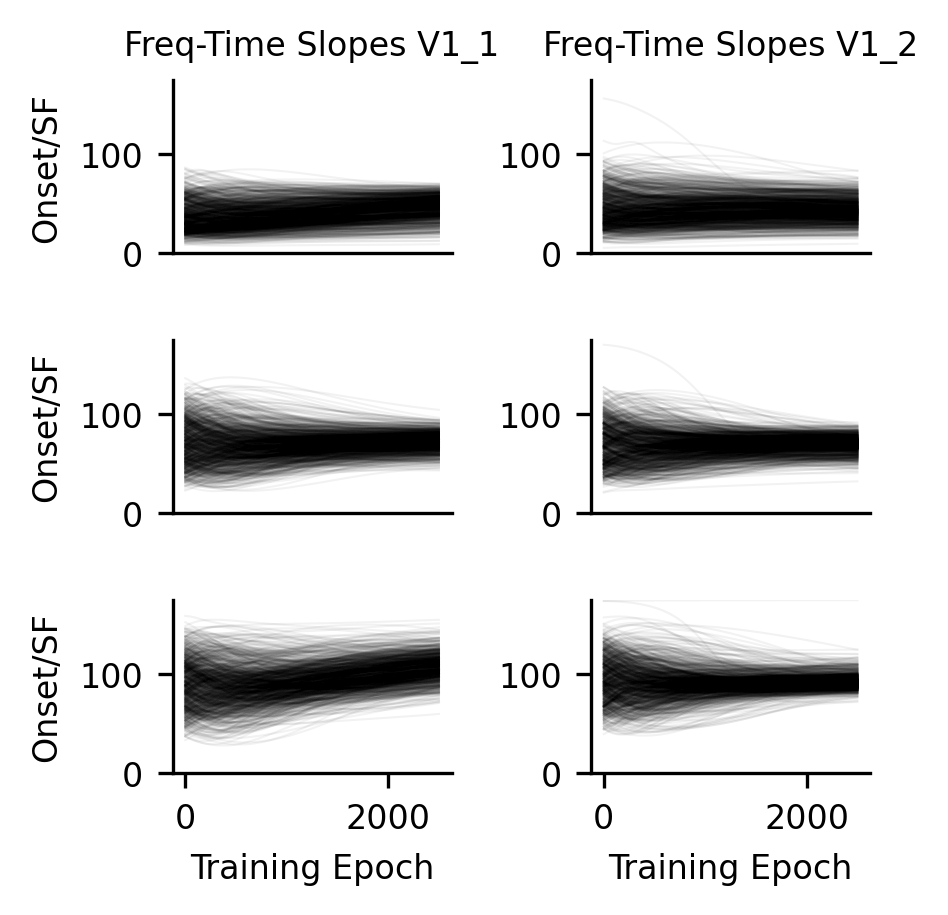

In [50]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 0

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Freq-Time Slopes V1_{i+1}", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Onset/SF", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['fts'][0], plot_bounds['fts'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_fts_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

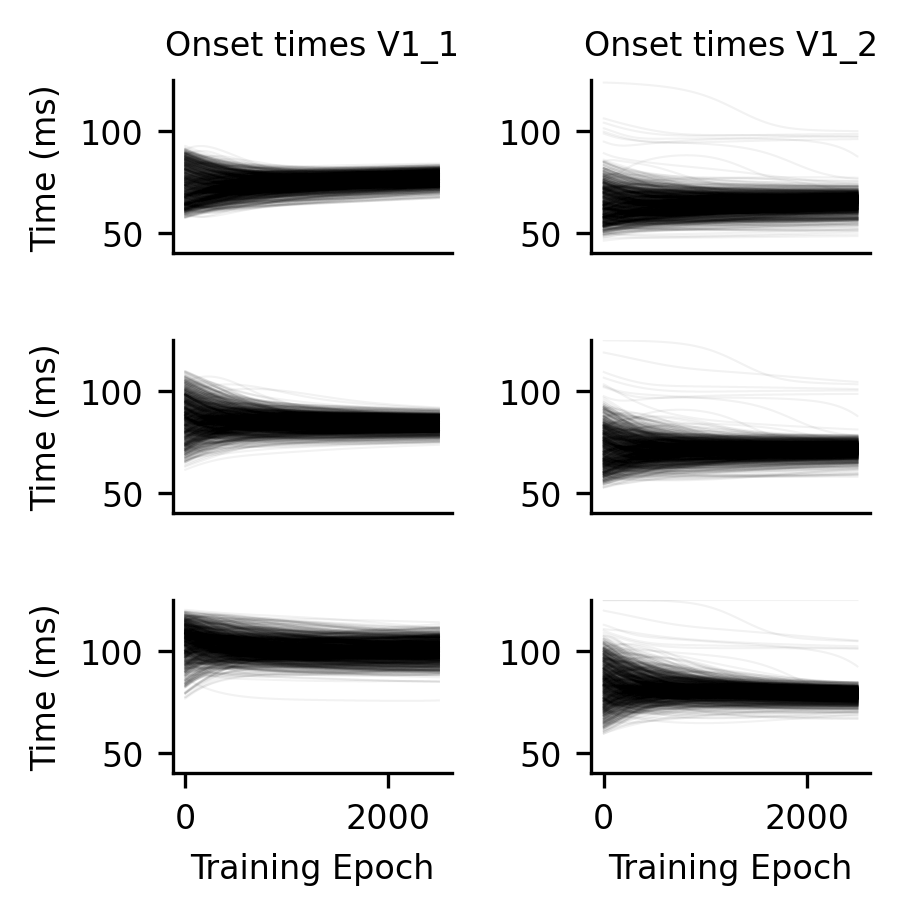

In [51]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 1

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Onset times V1_{i+1}", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Time (ms)", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['t'][0], plot_bounds['t'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_t_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

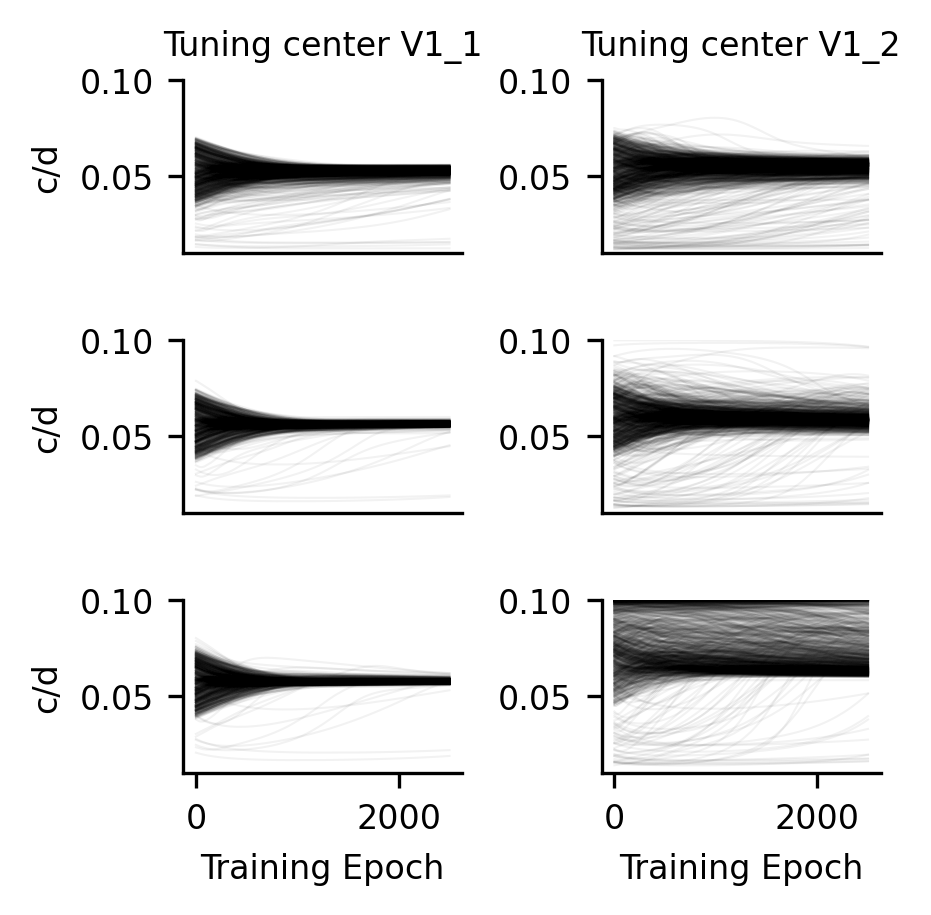

In [52]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 2

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Tuning center V1_{i+1}", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("c/d", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['ampc'][0], plot_bounds['ampc'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_ampc_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

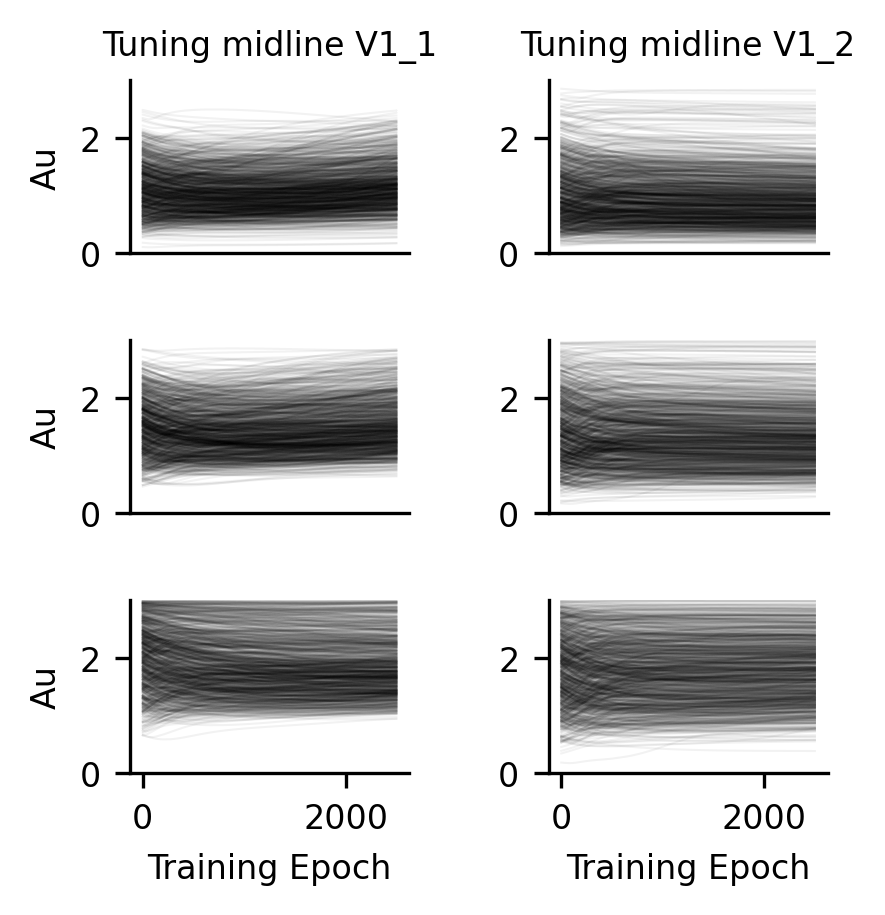

In [53]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 3

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Tuning midline V1_{i+1}", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Au", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['ampm'][0], plot_bounds['ampm'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_ampm_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

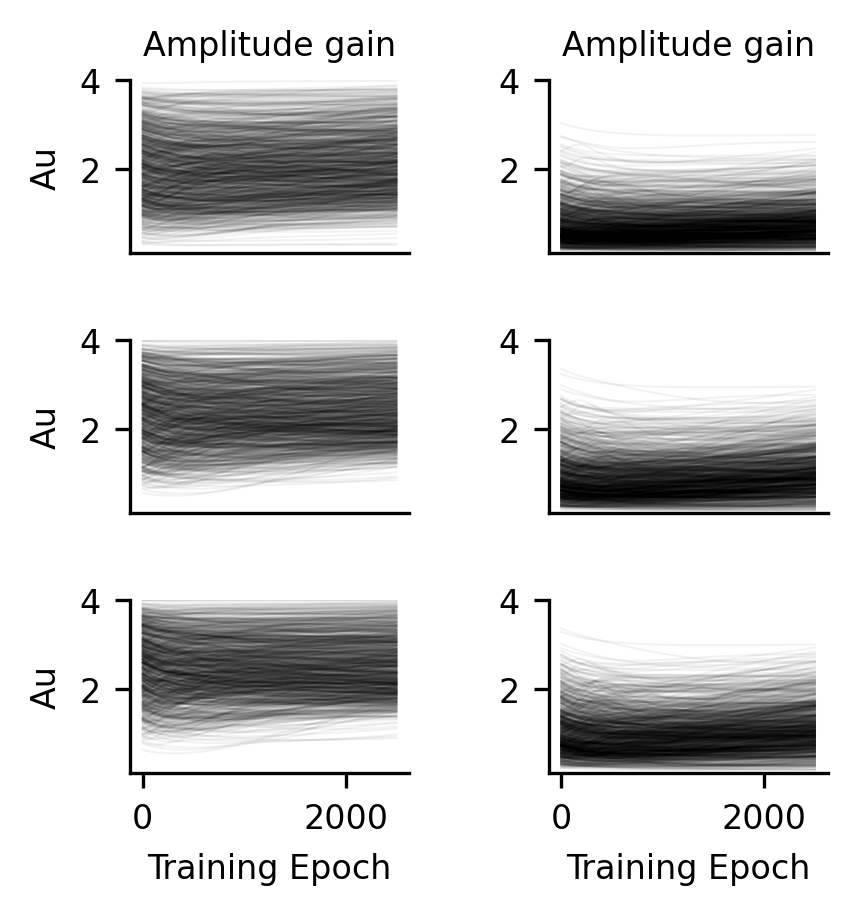

In [54]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 4

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Amplitude gain", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Au", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['ampg'][0], plot_bounds['ampg'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_ampg_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

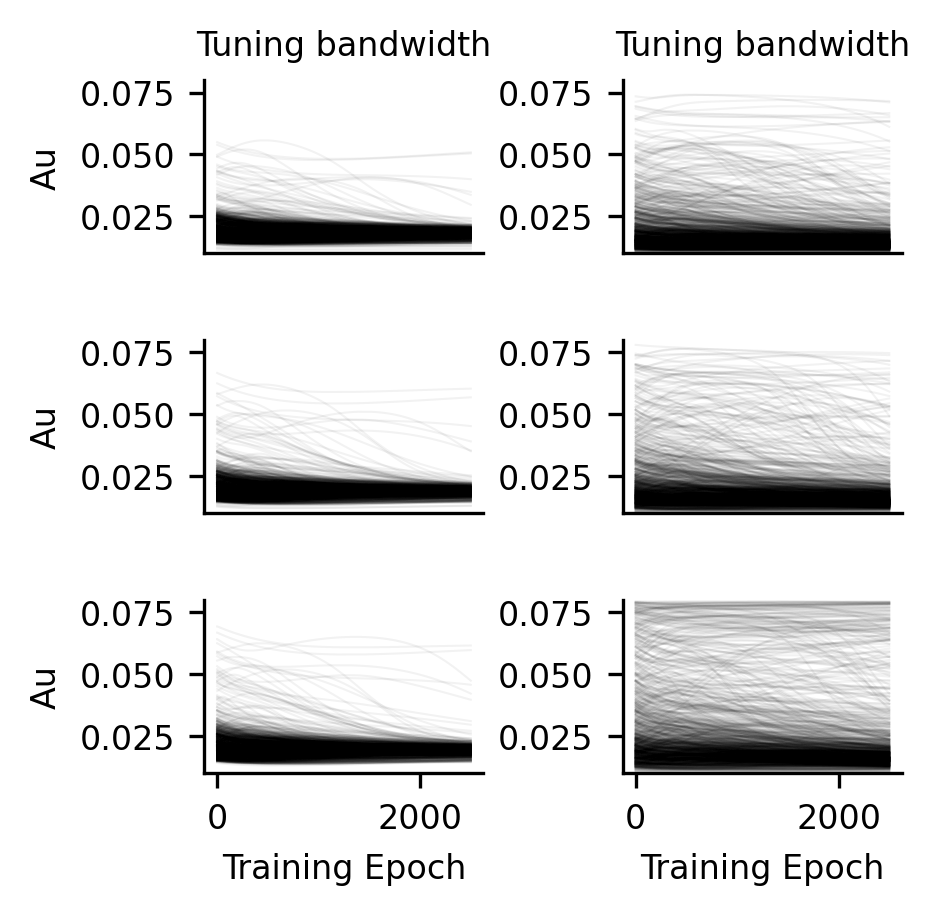

In [55]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 5

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Tuning bandwidth", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Au", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['ampw'][0], plot_bounds['ampw'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_ampw_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

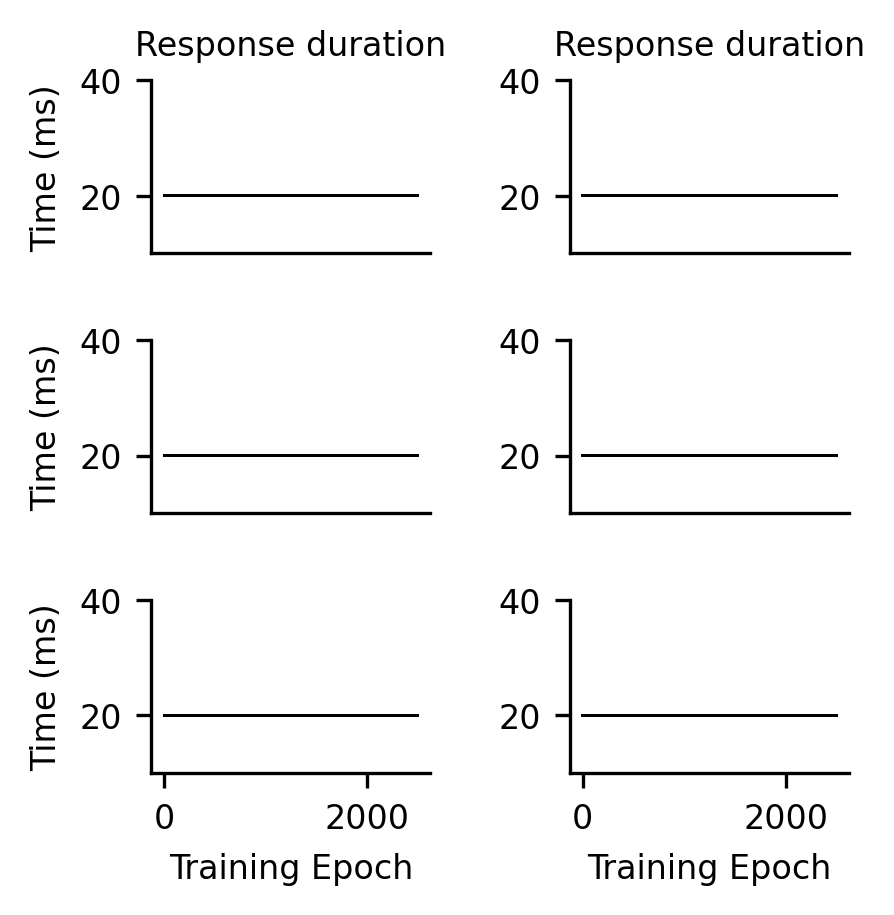

In [56]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 6

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Response duration", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Time (ms)", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['d'][0], plot_bounds['d'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_d_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

In [57]:
res = param_history['dLGN_params'].squeeze()
print(res.shape[2:])
n_samples, n_epochs = res.shape[:2]
n_params = np.prod(res.shape[2:])# + np.prod(r2.shape[2:])

res = res.reshape(res.shape[0] * res.shape[1], np.prod(res.shape[2:]))

(2, 3, 7)


In [58]:
pca = PCA() # all epochs included
res_transformed_pca = pca.fit_transform(res).reshape(n_samples, n_epochs, n_params)

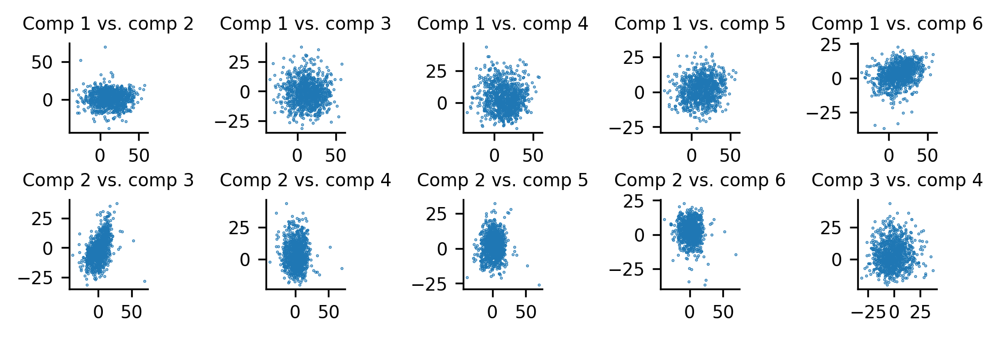

In [59]:
fig, ax = plt.subplots(2,5, figsize = (7,2))

comp_pairs = (list(combinations(np.arange(6), 2)))
i = 0
for row in range(2):
    for col in range(5):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        c0, c1 = comp_pairs[i]
        ax[row, col].scatter(res_transformed_pca[:,-1,c0], res_transformed_pca[:,-1,c1], s = 0.1) # last epoch
        ax[row, col].set_title(f"Comp {c0+1} vs. comp {c1+1}", fontsize = fontsize)
        i+=1

fig.subplots_adjust(hspace = 0.75, wspace = 1.5)
figname = '2d_model_pcaprojection_first_round.svg'
savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
plt.savefig(savepath, transparent = False, facecolor = 'white',
           bbox_inches = 'tight', dpi = 300)

In [60]:
lgn_params = [
    'Frequency-time slope',
    'Onset time',
    'Tuning center',
    'Tuning midline',
    'Tuning gain',
    'Tuning bandwidth',
    'Response duration'
]

v1_params = [
    'Inhibition delay',
    'Inhibition weight'
]

lgn_units = [
    'dLGN_1 into V1_1',
    'dLGN_2 into V1_1',
    'dLGN_3 into V1_1',
    'dLGN_1 into V1_2',
    'dLGN_2 into V1_2',
    'dLGN_3 into V1_2',
]

v1_units = [
    'V1_1',
    'V1_2'
]

full_lgn_params = []
for unit in lgn_units:
    for param in lgn_params:
        full_lgn_params.append(f"{param} ({unit})")

full_v1_params = []
for unit in v1_units:
    for param in v1_params:
        full_v1_params.append(f"{param} ({unit})")
        
param_names = full_lgn_params+full_v1_params

In [61]:
# for i in range(10):
#     fig, ax = plt.subplots(figsize = (8, 4))
#     ax.tick_params(labelsize = fontsize)
#     ax.spines['top'].set_visible(False)
#     ax.spines['right'].set_visible(False)
#     ax.bar(np.arange(len(full_lgn_params)), np.abs(pca.components_[i]))
#     ax.set_xticks(np.arange(len(full_lgn_params)))
#     ax.set_xticklabels(param_names[:len(full_lgn_params)], rotation = 90)
#     ax.set_ylabel("Loading scores", fontsize = fontsize)
#     ax.set_title(f"Component {i+1}", fontsize = fontsize)

#     figname = f'2d_model_pca_loadings_pc{i+1}_first_round.svg'
#     savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
#     plt.savefig(savepath, transparent = False, facecolor = 'white',
#             bbox_inches = 'tight', dpi = 300)

## Clip frequency-time intercepts:

In [62]:
param_bounds_1 = {
    "fts": [0, 175],
    "t": [tv1_1, tv1_1],
    "ampc": [0.01, 0.1],
    'ampm': [0,3],
    "ampg": [0.1, 4],
    "ampw": [0.01,0.08],
    "d": [10, 40],
    "inh_d": [0, 40],
    "inh_w": [0, 3],
}

param_bounds_2 = {
    "fts": [0, 175],
    "t": [tv1_2, tv1_2],
    "ampc": [0.01, 0.1],
    'ampm': [0,3],
    "ampg": [0.1, 4],
    "ampw": [0.01,0.08],
    "d": [10, 40],
    "inh_d": [0, 40],
    "inh_w": [0, 3],
}

bounds = [param_bounds_1, param_bounds_2]

In [63]:
model = SGCCircuit(bounds)

In [64]:
p = {x[0]:x[1] + tf.random.uniform(x[1].shape, -0.75, 0.75) 
    for x in optimized_model['final_epoch_params'].items()}

In [65]:
model.load_saved_parameters(p)

In [66]:
# initialize the optimizer
optimizer = Optimize(model, epochs=1000, loss_threshold=0)

# fit the model
optimizer.fit(X, Y_true)

Optimizer initialized with <keras.optimizers.optimizer_v2.adam.Adam object at 0x00000298231A3550>
Training step = 0, N_exploration_samples = 1000,
min_loss = 0.18412987887859344
med_loss = 0.782277524471283
max_loss = 4.160033702850342

Training step = 100, N_exploration_samples = 1000,
min_loss = 0.13297846913337708
med_loss = 0.512872576713562
max_loss = 2.9670238494873047

Training step = 200, N_exploration_samples = 1000,
min_loss = 0.12106326967477798
med_loss = 0.36323896050453186
max_loss = 2.113417625427246

Training step = 300, N_exploration_samples = 1000,
min_loss = 0.1144336685538292
med_loss = 0.27408912777900696
max_loss = 1.5073060989379883

Training step = 400, N_exploration_samples = 1000,
min_loss = 0.10982991009950638
med_loss = 0.22028952836990356
max_loss = 1.0876015424728394

Training step = 500, N_exploration_samples = 1000,
min_loss = 0.10602211952209473
med_loss = 0.1886509656906128
max_loss = 0.7990555763244629

Training step = 600, N_exploration_samples = 100

<tf.Tensor: shape=(1000, 1000), dtype=float16, numpy=
array([[0.6133 , 1.599  , 0.4163 , ..., 1.112  , 1.246  , 2.73   ],
       [0.6094 , 1.593  , 0.4148 , ..., 1.106  , 1.24   , 2.719  ],
       [0.606  , 1.586  , 0.413  , ..., 1.102  , 1.234  , 2.707  ],
       ...,
       [0.1218 , 0.1692 , 0.109  , ..., 0.1566 , 0.1633 , 0.152  ],
       [0.12177, 0.1691 , 0.109  , ..., 0.1566 , 0.1633 , 0.1519 ],
       [0.1217 , 0.1691 , 0.109  , ..., 0.1566 , 0.1632 , 0.1517 ]],
      dtype=float16)>

In [67]:
optimizer.save_state('conditional_optimization_clipped_fti')

In [68]:
loss_decay = optimizer.outputs['loss_decay']

In [69]:
param_history = optimizer.outputs['param_history']

In [70]:
last_epoch = loss_decay[-1]
best = np.where(last_epoch == last_epoch.min())[0][0]
print(f"Index of best parameters: {best}, loss = {last_epoch[best]}")

Index of best parameters: 443, loss = 0.10052490234375


In [71]:
def minmax_norm(array, lower, upper):
    if (array.max() - array.min()) != 0:
        norm = (array - array.min()) / (array.max() - array.min())
        return lower + (norm * (upper-lower))
    else:
        return array

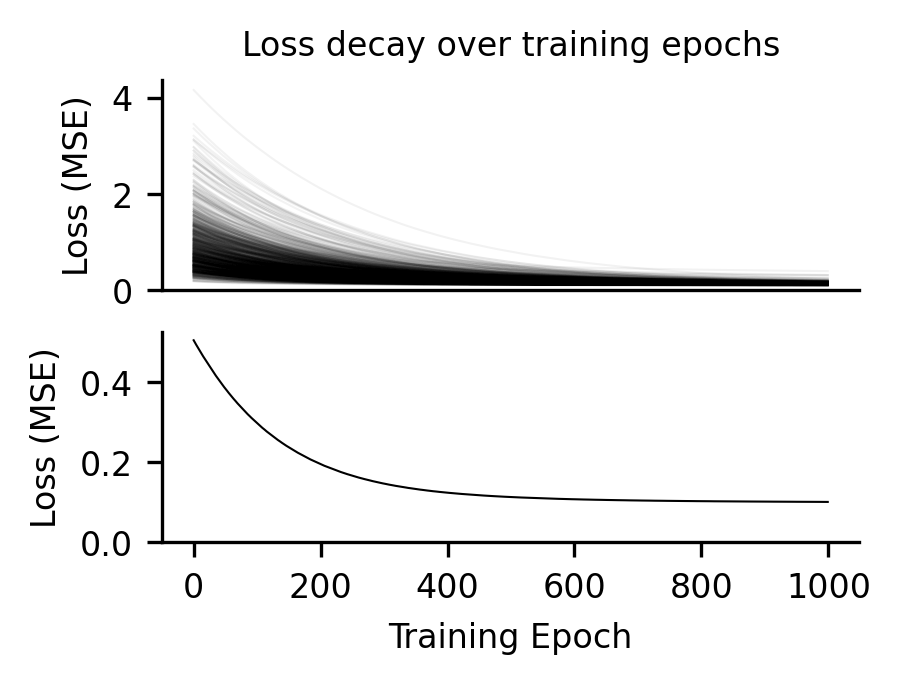

In [72]:
fig, ax = plt.subplots(2, figsize = (3,2))

for i, decay in enumerate(loss_decay.T):
    ax[0].plot(decay, alpha = 0.05, color = 'black', linewidth = linewidth)

ax[1].set_xlabel("Training Epoch", fontsize = fontsize)
ax[0].set_ylabel("Loss (MSE)", fontsize = fontsize)
ax[0].set_ylim(0,)
ax[0].set_xticks([])

ax[1].set_ylabel("Loss (MSE)", fontsize = fontsize)
ax[1].plot(loss_decay[:,best], alpha = 1, color = 'black', linewidth = linewidth)
ax[1].set_ylim(0.)
ax[0].set_title("Loss decay over training epochs", fontsize = fontsize)

for i in range(2):
    ax[i].tick_params(labelsize = fontsize)
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['right'].set_visible(False)

figname = '2d_model_loss_decay_first_round.svg'
savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
plt.savefig(savepath, transparent = False, facecolor = 'white',
           bbox_inches = 'tight', dpi = 300)

Text(0.5, 1.0, 'Loss distribution on final training epoch')

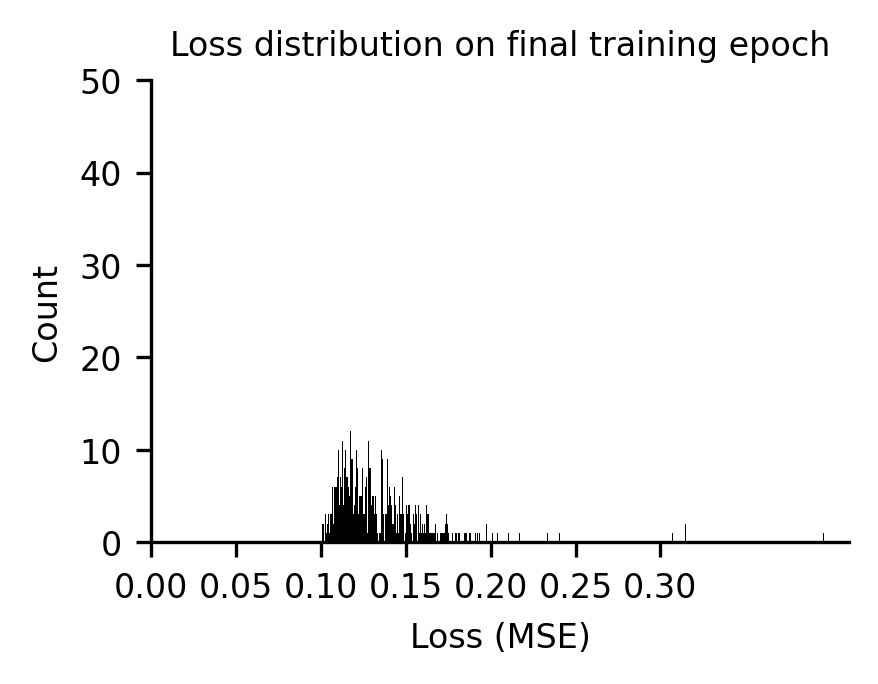

In [73]:
fig, ax = plt.subplots(figsize = (3,2))
ax.hist(loss_decay[-1], bins = 1000, color = 'black')
ax.tick_params(labelsize = fontsize)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_ylabel("Count", fontsize = fontsize)
ax.set_xlabel("Loss (MSE)", fontsize = fontsize)
ax.set_xticks(np.arange(0,0.35,0.05))
ax.set_ylim(0,50)
ax.set_title("Loss distribution on final training epoch", fontsize = fontsize)

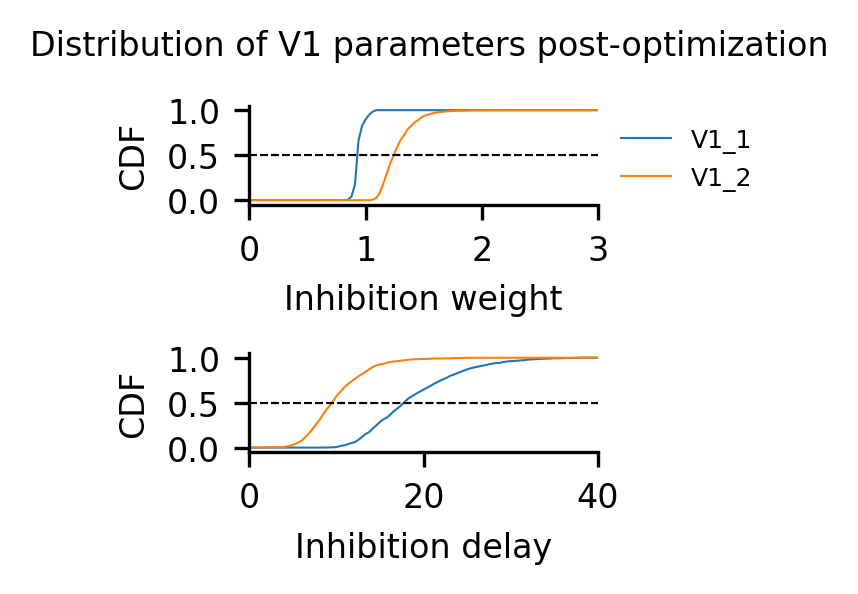

In [74]:
fig, ax = plt.subplots(2,1, figsize = (1.5, 1.5))

for i in range(2):
    i_ = np.abs(i-1)
    for u in range(2):
        x = np.linspace(
            list(plot_bounds.values())[-1-i][0],
            list(plot_bounds.values())[-1-i][1],
            100
        )
        data = param_history['V1_params'][:,-1,u,0,i_,0,0]
        kde = ecdf(data).cdf
        y = kde.evaluate(x)

        ax[i].plot(x,y, label = f'V1_{u+1}', linewidth = linewidth)
        ax[i].plot(x, np.full(len(x), 0.5), '--', color = 'black', linewidth = linewidth)
        ax[i].set_xlim(
            list(plot_bounds.values())[-1-i][0],
            list(plot_bounds.values())[-1-i][1]
        )
        ax[i].set_ylabel("CDF", fontsize = fontsize)
        ax[i].set_yticks(np.arange(0, 1.5, 0.5))
        ax[i].spines['top'].set_visible(False)
        ax[i].spines['right'].set_visible(False)
        ax[i].tick_params(labelsize = fontsize)

ax[0].set_xlabel('Inhibition weight', fontsize = fontsize)
ax[1].set_xlabel('Inhibition delay', fontsize = fontsize)
ax[0].legend(fontsize = 6, frameon = False, bbox_to_anchor = (1,1))
fig.subplots_adjust(hspace=1.5)
plt.suptitle("Distribution of V1 parameters post-optimization", fontsize = fontsize, x = 0.525, y = 1.05)

figname = '2d_model_v1_param_density_func_first_round.svg'
savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
plt.savefig(savepath, transparent = False, facecolor = 'white',
           bbox_inches = 'tight', dpi = 300)

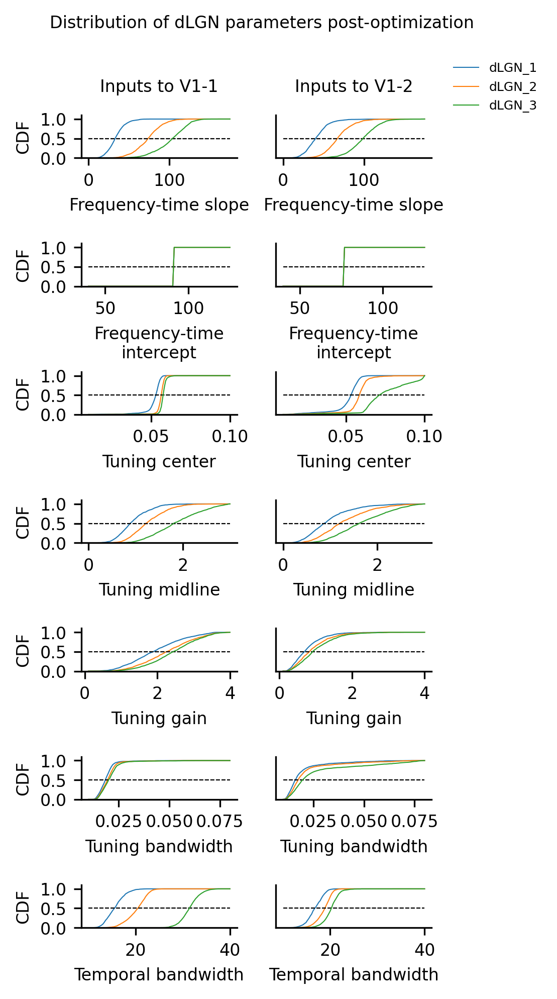

In [75]:
fig, ax = plt.subplots(7,2, figsize = (3,7))

param_labels = [
    'Frequency-time slope',
    'Frequency-time\nintercept',
    'Tuning center',
    'Tuning midline',
    'Tuning gain',
    'Tuning bandwidth',
    'Temporal bandwidth'
]

neuron_labels = [f'dLGN_{i+1}' for i in range(3)]


for row in range(7):
    ymax = []
    for i in range(3):
        for u in range(2):
            data = param_history['dLGN_params'][:,-1,u,i,row,0,0]
            x = np.linspace(
                list(plot_bounds.values())[:7][row][0],
                list(plot_bounds.values())[:7][row][1], 
                100
            )
            kde = ecdf(data).cdf
            y = kde.evaluate(x)

            ymax.append(y.max())

            ax[row, u].plot(x, np.full(len(x), 0.5), '--', color = 'black', linewidth = linewidth)
            ax[row, u].plot(x, y, label = neuron_labels[i], linewidth = linewidth)
            ax[row, u].set_xlabel(param_labels[row], fontsize = fontsize)
            ax[row, u].tick_params(labelsize = fontsize)

    ax[row, 0].set_ylabel("CDF", fontsize = fontsize)
    for u in range(2):
        ax[row, u].set_ylim(0, 1.1)
        ax[row, 1].set_yticks([])
        ax[row, 0].set_yticks(np.arange(0, 1.5, 0.5))
        ax[row, u].spines['top'].set_visible(False)
        ax[row, u].spines['right'].set_visible(False)

fig.subplots_adjust(hspace = 2, wspace=0.25)
plt.tick_params(labelsize = 8)
ax[0,1].legend(fontsize = 6, bbox_to_anchor = (1.75,2.5), frameon = False)
ax[0,0].set_title("Inputs to V1-1", fontsize = fontsize, y = 1.25)
ax[0,1].set_title("Inputs to V1-2", fontsize = fontsize, y = 1.25)
plt.suptitle("Distribution of dLGN parameters post-optimization", fontsize = fontsize, x = 0.525, y = 0.975)

figname = '2d_model_dlgn_param_density_func_first_round.svg'
savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
plt.savefig(savepath, transparent = False, facecolor = 'white',
           bbox_inches = 'tight', dpi = 300)

Text(0.5, 1.15, 'Convergence of V1 parameter values')

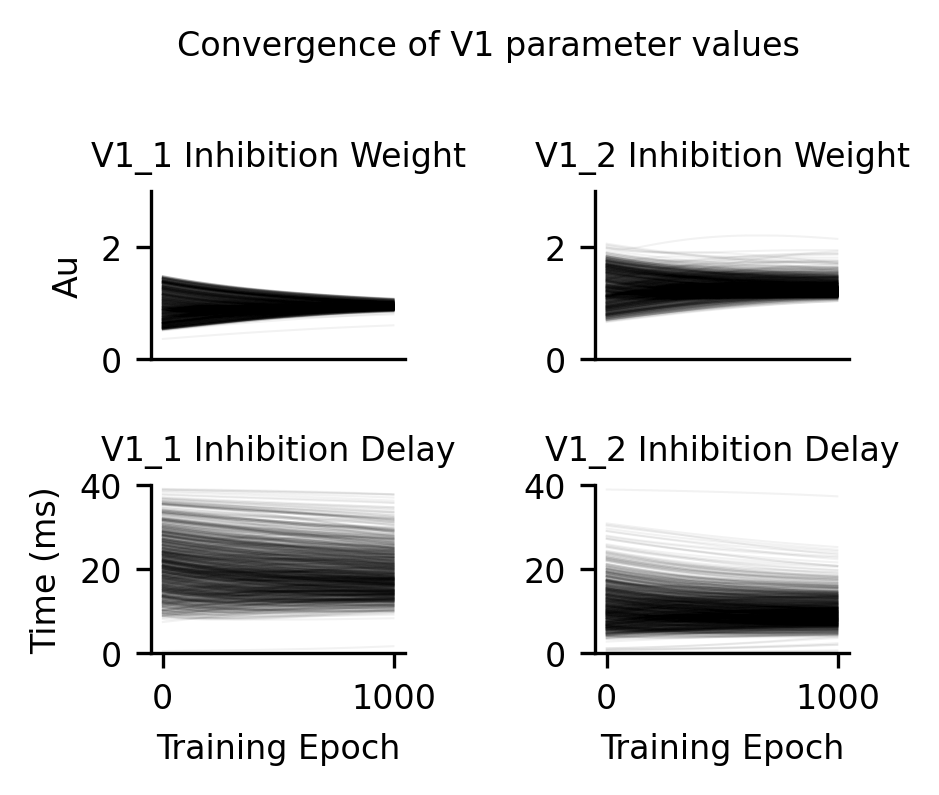

In [76]:
## inhibition weight::inhibition delay

fig, ax = plt.subplots(2,2, figsize = (3,2))

inh_w = 1
v1_n = 0 

for row in range(2):
    for col in range(2):
        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

ax[0,0].plot(
    param_history['V1_params'][:,:,v1_n,0,inh_w,0,0].T,
    linewidth=linewidth,
    alpha=0.05,
    color = 'black'
)

# 
v1_n = 1
ax[0,1].plot(
    param_history['V1_params'][:,:,v1_n,0,inh_w,0,0].T,
    linewidth=linewidth,
    alpha=0.05,
    color = 'black'
)

# a0
inh_d = 0
v1_n = 0
ax[1,0].plot(
    param_history['V1_params'][:,:,v1_n,0,inh_d,0,0].T,
    linewidth=linewidth,
    alpha=0.05,
    color = 'black'
)

# a1
v1_n = 1
ax[1,1].plot(
    param_history['V1_params'][:,:,v1_n,0,inh_d,0,0].T,
    linewidth=linewidth,
    alpha=0.05,
    color = 'black'
)

ax[0,0].set_ylim(plot_bounds['inh_w'][0], plot_bounds['inh_w'][1])
ax[0,0].set_title("V1_1 Inhibition Weight", fontsize = fontsize)
ax[0,0].set_xticks([])
ax[0,0].set_ylabel("Au", fontsize = fontsize)

ax[0,1].set_ylim(plot_bounds['inh_w'][0], plot_bounds['inh_w'][1])
ax[0,1].set_title("V1_2 Inhibition Weight", fontsize = fontsize)
ax[0,1].set_xticks([])

ax[1,0].set_ylim(plot_bounds['inh_d'][0], plot_bounds['inh_d'][1])
ax[1,0].set_title("V1_1 Inhibition Delay", fontsize = fontsize)
ax[1,0].set_ylabel("Time (ms)", fontsize = fontsize)
ax[1,0].set_xlabel("Training Epoch", fontsize = fontsize)

ax[1,1].set_ylim(plot_bounds['inh_d'][0], plot_bounds['inh_d'][1])
ax[1,1].set_title("V1_2 Inhibition Delay", fontsize = fontsize)
ax[1,1].set_xlabel("Training Epoch", fontsize = fontsize)
fig.subplots_adjust(wspace=0.75, hspace=0.75)
plt.suptitle("Convergence of V1 parameter values", fontsize = fontsize, y = 1.15)

# figname = '2d_model_v1_param_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

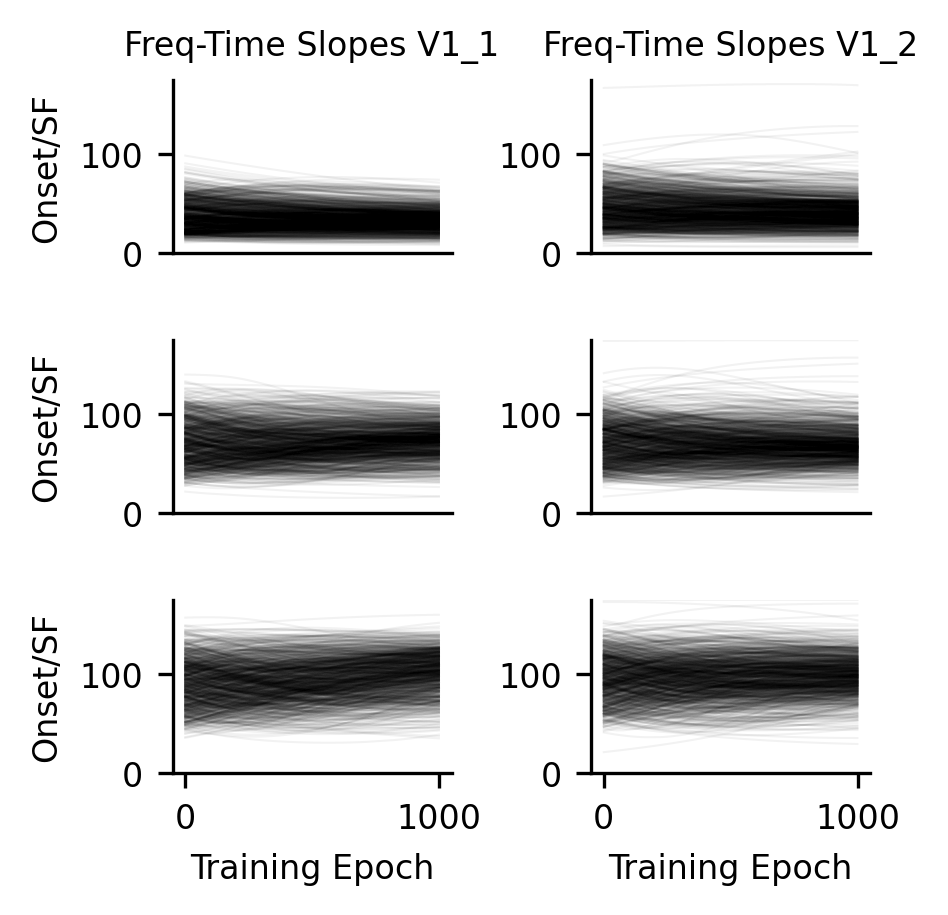

In [77]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 0

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Freq-Time Slopes V1_{i+1}", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Onset/SF", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['fts'][0], plot_bounds['fts'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_fts_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

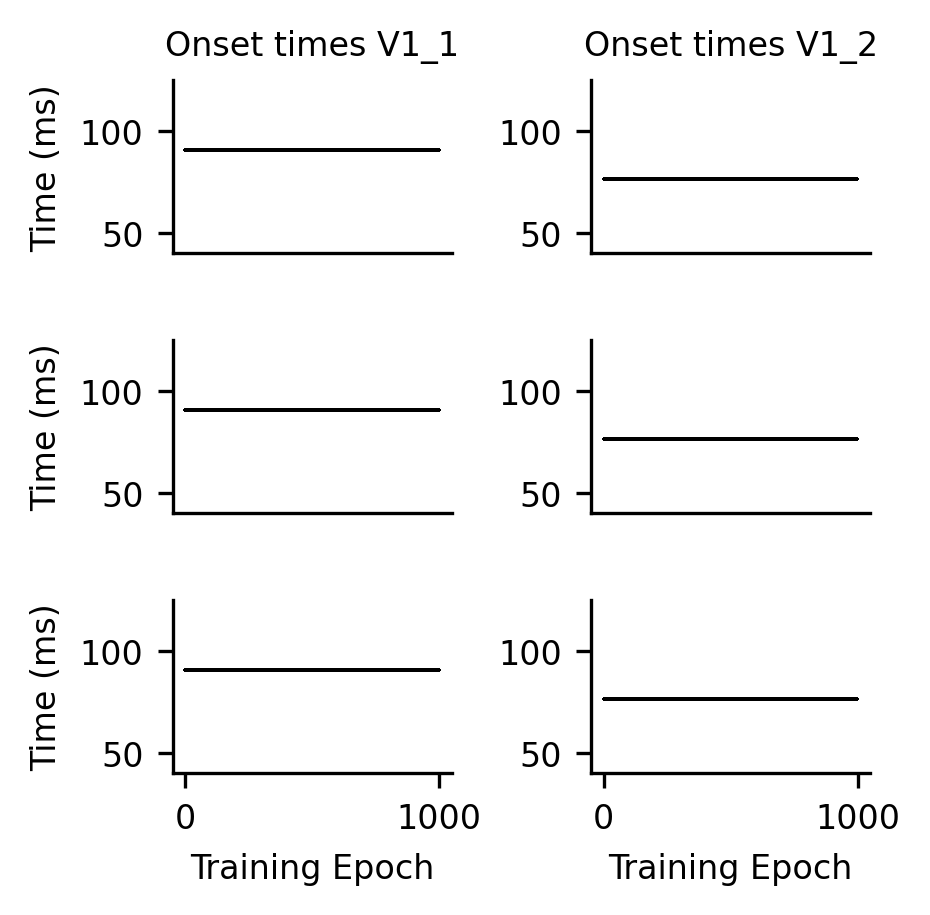

In [78]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 1

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Onset times V1_{i+1}", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Time (ms)", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['t'][0], plot_bounds['t'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_t_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

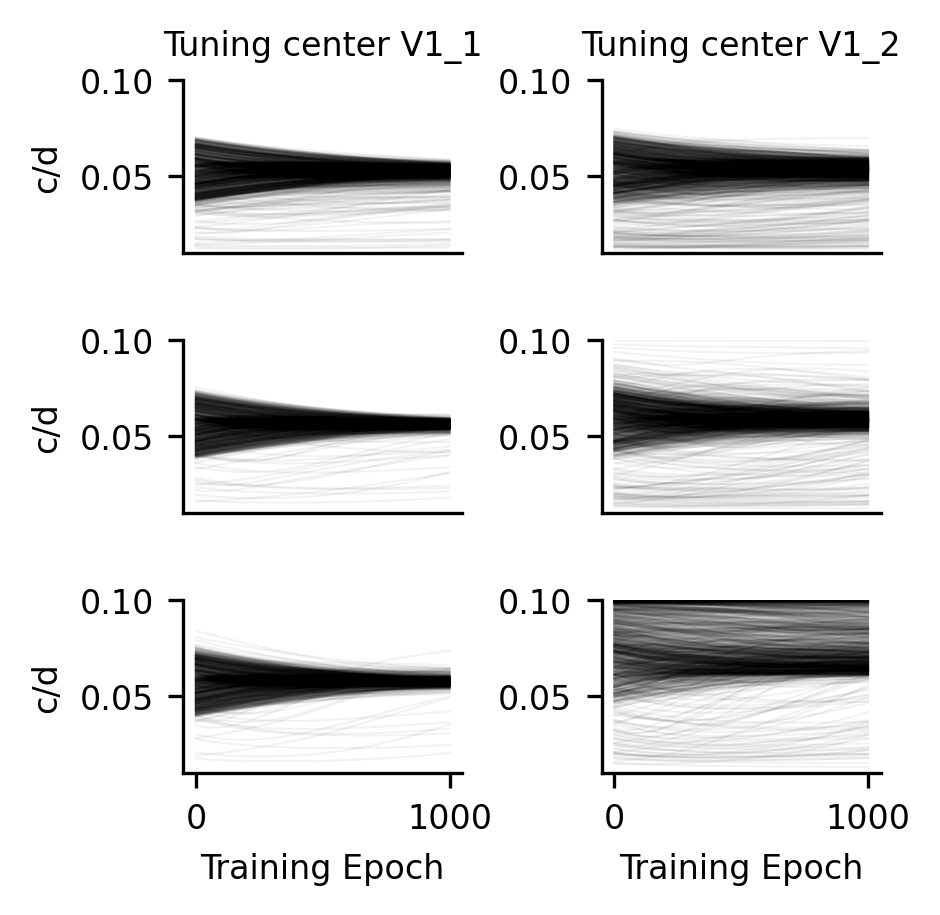

In [79]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 2

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Tuning center V1_{i+1}", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("c/d", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['ampc'][0], plot_bounds['ampc'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_ampc_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

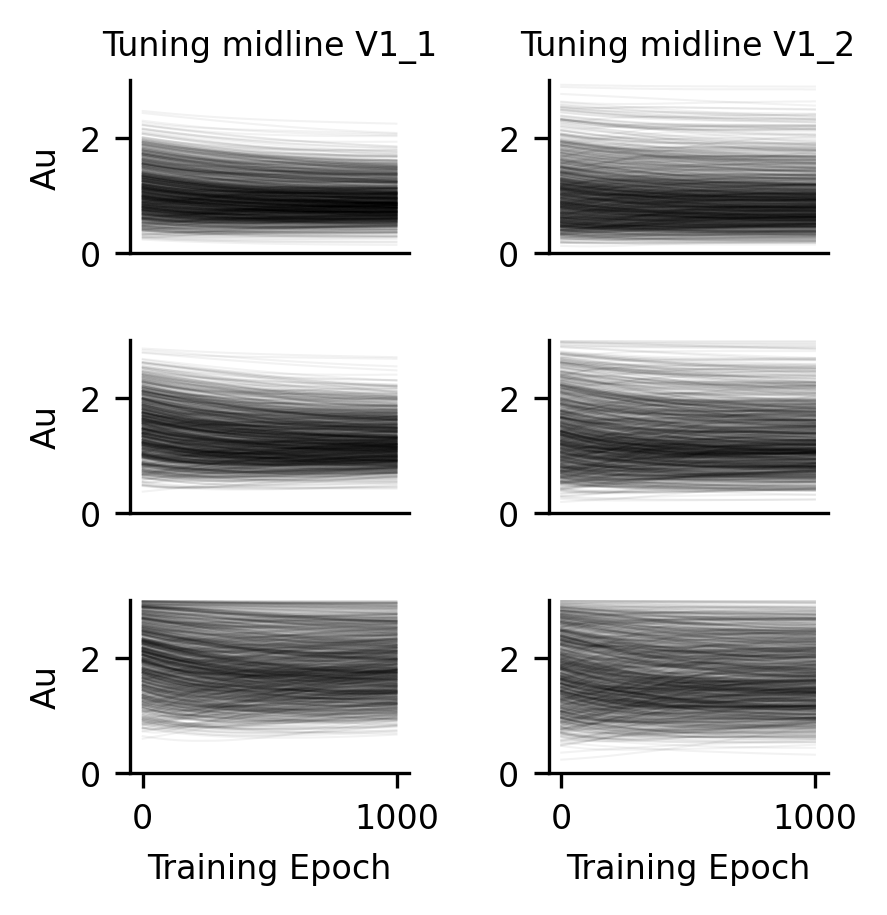

In [80]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 3

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Tuning midline V1_{i+1}", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Au", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['ampm'][0], plot_bounds['ampm'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_ampm_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

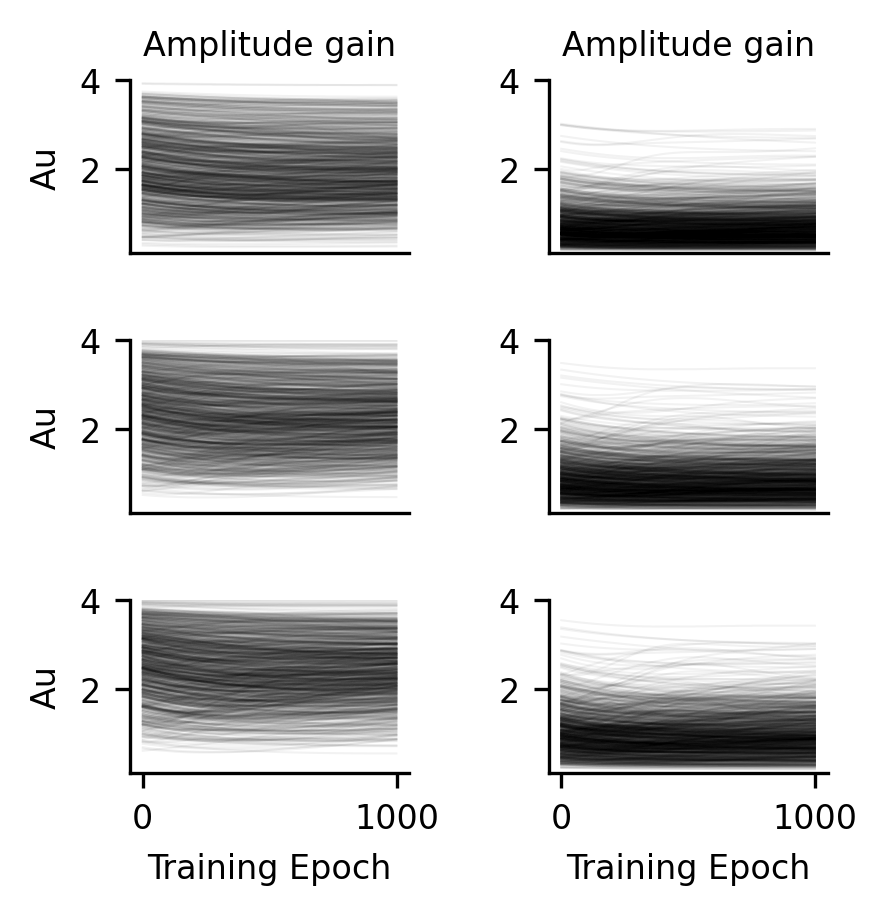

In [81]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 4

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Amplitude gain", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Au", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['ampg'][0], plot_bounds['ampg'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_ampg_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

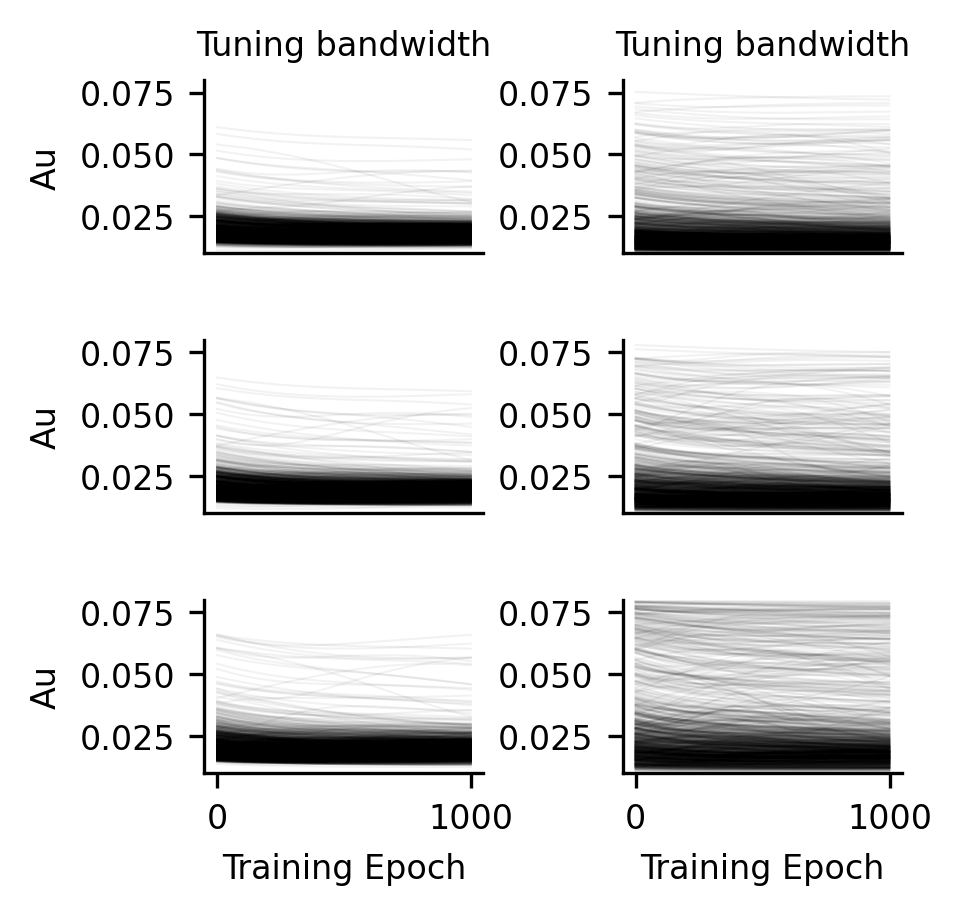

In [82]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 5

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Tuning bandwidth", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Au", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['ampw'][0], plot_bounds['ampw'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_ampw_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

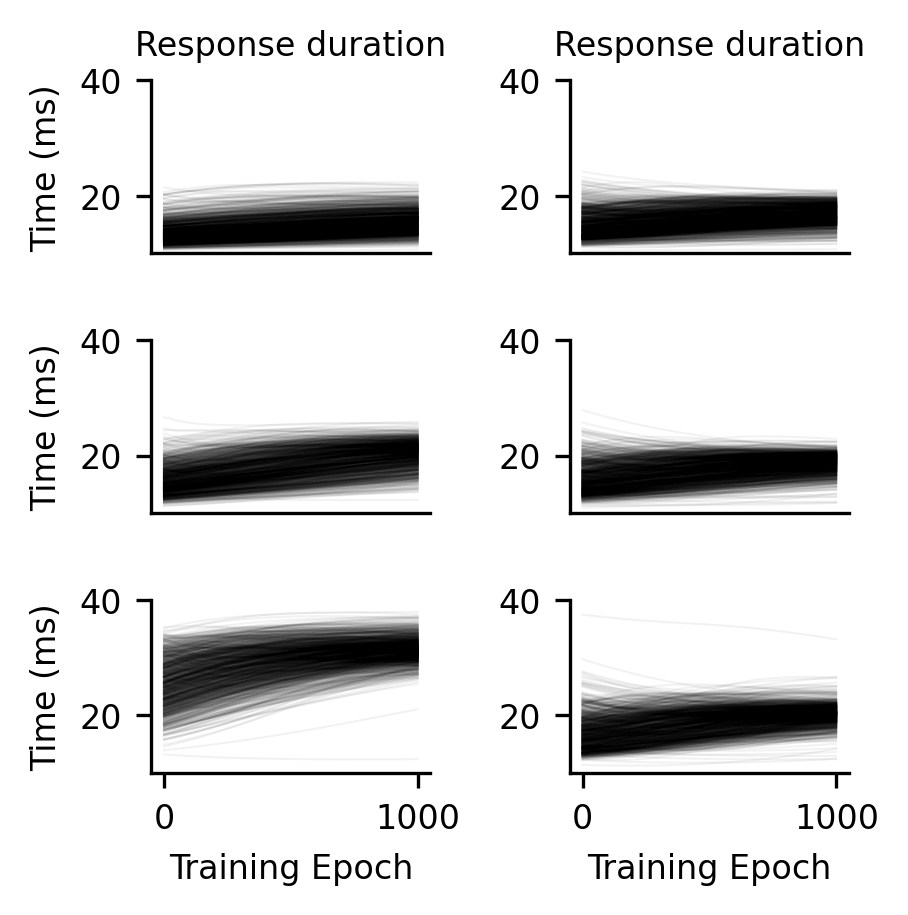

In [83]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 6

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Response duration", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Time (ms)", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['d'][0], plot_bounds['d'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_d_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

In [84]:
res = param_history['dLGN_params'].squeeze()
print(res.shape[2:])
n_samples, n_epochs = res.shape[:2]
n_params = np.prod(res.shape[2:])# + np.prod(r2.shape[2:])

res = res.reshape(res.shape[0] * res.shape[1], np.prod(res.shape[2:]))

(2, 3, 7)


In [85]:
pca = PCA() # all epochs included
res_transformed_pca = pca.fit_transform(res).reshape(n_samples, n_epochs, n_params)

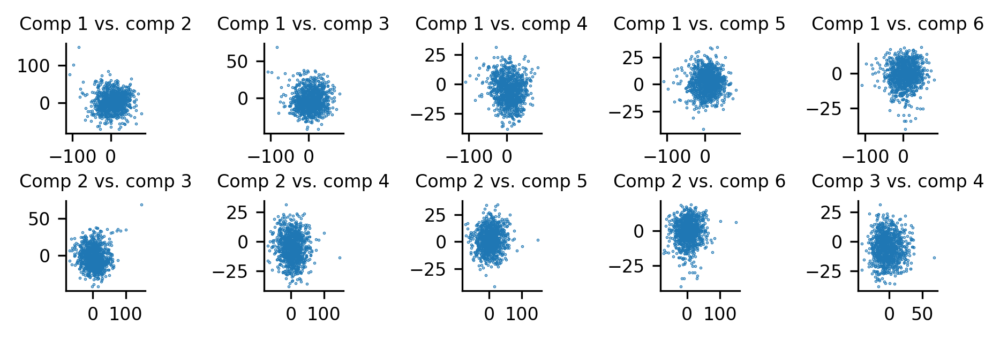

In [86]:
fig, ax = plt.subplots(2,5, figsize = (7,2))

comp_pairs = (list(combinations(np.arange(6), 2)))
i = 0
for row in range(2):
    for col in range(5):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        c0, c1 = comp_pairs[i]
        ax[row, col].scatter(res_transformed_pca[:,-1,c0], res_transformed_pca[:,-1,c1], s = 0.1) # last epoch
        ax[row, col].set_title(f"Comp {c0+1} vs. comp {c1+1}", fontsize = fontsize)
        i+=1

fig.subplots_adjust(hspace = 0.75, wspace = 1.5)
figname = '2d_model_pcaprojection_first_round.svg'
savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
plt.savefig(savepath, transparent = False, facecolor = 'white',
           bbox_inches = 'tight', dpi = 300)

In [87]:
lgn_params = [
    'Frequency-time slope',
    'Onset time',
    'Tuning center',
    'Tuning midline',
    'Tuning gain',
    'Tuning bandwidth',
    'Response duration'
]

v1_params = [
    'Inhibition delay',
    'Inhibition weight'
]

lgn_units = [
    'dLGN_1 into V1_1',
    'dLGN_2 into V1_1',
    'dLGN_3 into V1_1',
    'dLGN_1 into V1_2',
    'dLGN_2 into V1_2',
    'dLGN_3 into V1_2',
]

v1_units = [
    'V1_1',
    'V1_2'
]

full_lgn_params = []
for unit in lgn_units:
    for param in lgn_params:
        full_lgn_params.append(f"{param} ({unit})")

full_v1_params = []
for unit in v1_units:
    for param in v1_params:
        full_v1_params.append(f"{param} ({unit})")
        
param_names = full_lgn_params+full_v1_params

In [88]:
# for i in range(10):
#     fig, ax = plt.subplots(figsize = (8, 4))
#     ax.tick_params(labelsize = fontsize)
#     ax.spines['top'].set_visible(False)
#     ax.spines['right'].set_visible(False)
#     ax.bar(np.arange(len(full_lgn_params)), np.abs(pca.components_[i]))
#     ax.set_xticks(np.arange(len(full_lgn_params)))
#     ax.set_xticklabels(param_names[:len(full_lgn_params)], rotation = 90)
#     ax.set_ylabel("Loading scores", fontsize = fontsize)
#     ax.set_title(f"Component {i+1}", fontsize = fontsize)

#     figname = f'2d_model_pca_loadings_pc{i+1}_first_round.svg'
#     savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
#     plt.savefig(savepath, transparent = False, facecolor = 'white',
#             bbox_inches = 'tight', dpi = 300)

## Clip frequency-time intercepts and slopes:

In [89]:
param_bounds_1 = {
    "fts": [0, 0],
    "t": [tv1_1, tv1_1],
    "ampc": [0.01, 0.1],
    'ampm': [0,3],
    "ampg": [0.1, 4],
    "ampw": [0.01,0.08],
    "d": [10, 40],
    "inh_d": [0, 40],
    "inh_w": [0, 3],
}

param_bounds_2 = {
    "fts": [0, 0],
    "t": [tv1_2, tv1_2],
    "ampc": [0.01, 0.1],
    'ampm': [0,3],
    "ampg": [0.1, 4],
    "ampw": [0.01,0.08],
    "d": [10, 40],
    "inh_d": [0, 40],
    "inh_w": [0, 3],
}

bounds = [param_bounds_1, param_bounds_2]

In [90]:
model = SGCCircuit(bounds)

In [91]:
p = {x[0]:x[1] + tf.random.uniform(x[1].shape, -0.75, 0.75) 
    for x in optimized_model['final_epoch_params'].items()}

In [92]:
model.load_saved_parameters(p)

In [93]:
# initialize the optimizer
optimizer = Optimize(model, epochs=2500, loss_threshold=0)

# fit the model
optimizer.fit(X, Y_true)

Optimizer initialized with <keras.optimizers.optimizer_v2.adam.Adam object at 0x000002979D32C2B0>
Training step = 0, N_exploration_samples = 1000,
min_loss = 0.2322230190038681
med_loss = 0.92335045337677
max_loss = 4.570971488952637

Training step = 100, N_exploration_samples = 1000,
min_loss = 0.21338754892349243
med_loss = 0.6542149782180786
max_loss = 3.329615592956543

Training step = 200, N_exploration_samples = 1000,
min_loss = 0.20248039066791534
med_loss = 0.4915231764316559
max_loss = 2.4502038955688477

Training step = 300, N_exploration_samples = 1000,
min_loss = 0.19629119336605072
med_loss = 0.39743655920028687
max_loss = 1.8299661874771118

Training step = 400, N_exploration_samples = 1000,
min_loss = 0.19274777173995972
med_loss = 0.34091946482658386
max_loss = 1.3916574716567993

Training step = 500, N_exploration_samples = 1000,
min_loss = 0.1907612681388855
med_loss = 0.3064309358596802
max_loss = 1.079664945602417

Training step = 600, N_exploration_samples = 1000,


<tf.Tensor: shape=(2500, 1000), dtype=float16, numpy=
array([[0.978 , 0.698 , 0.5225, ..., 0.9224, 0.9907, 1.36  ],
       [0.9746, 0.6963, 0.5205, ..., 0.919 , 0.9883, 1.3545],
       [0.9717, 0.694 , 0.5186, ..., 0.916 , 0.986 , 1.349 ],
       ...,
       [0.241 , 0.1908, 0.1903, ..., 0.1914, 0.204 , 0.2228],
       [0.241 , 0.1908, 0.1903, ..., 0.1914, 0.204 , 0.2228],
       [0.2408, 0.1908, 0.1903, ..., 0.1914, 0.2039, 0.2227]],
      dtype=float16)>

In [94]:
optimizer.save_state('conditional_optimization_clipped_fts_and_fti')

In [95]:
loss_decay = optimizer.outputs['loss_decay']

In [96]:
param_history = optimizer.outputs['param_history']

In [97]:
last_epoch = loss_decay[-1]
best = np.where(last_epoch == last_epoch.min())[0][0]
print(f"Index of best parameters: {best}, loss = {last_epoch[best]}")

Index of best parameters: 798, loss = 0.1854248046875


In [98]:
def minmax_norm(array, lower, upper):
    if (array.max() - array.min()) != 0:
        norm = (array - array.min()) / (array.max() - array.min())
        return lower + (norm * (upper-lower))
    else:
        return array

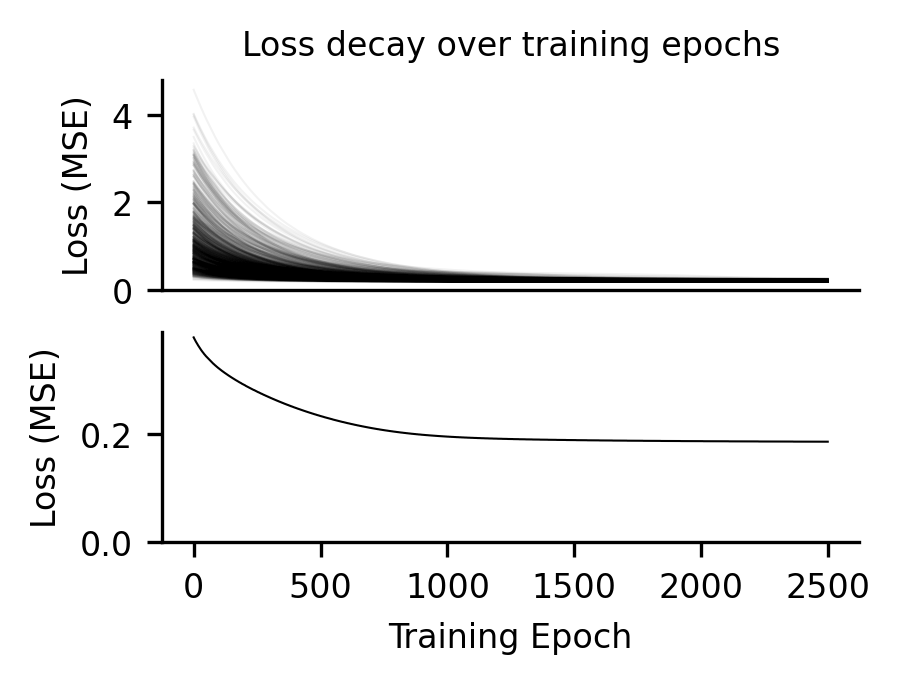

In [99]:
fig, ax = plt.subplots(2, figsize = (3,2))

for i, decay in enumerate(loss_decay.T):
    ax[0].plot(decay, alpha = 0.05, color = 'black', linewidth = linewidth)

ax[1].set_xlabel("Training Epoch", fontsize = fontsize)
ax[0].set_ylabel("Loss (MSE)", fontsize = fontsize)
ax[0].set_ylim(0,)
ax[0].set_xticks([])

ax[1].set_ylabel("Loss (MSE)", fontsize = fontsize)
ax[1].plot(loss_decay[:,best], alpha = 1, color = 'black', linewidth = linewidth)
ax[1].set_ylim(0.)
ax[0].set_title("Loss decay over training epochs", fontsize = fontsize)

for i in range(2):
    ax[i].tick_params(labelsize = fontsize)
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['right'].set_visible(False)

figname = '2d_model_loss_decay_first_round.svg'
savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
plt.savefig(savepath, transparent = False, facecolor = 'white',
           bbox_inches = 'tight', dpi = 300)

Text(0.5, 1.0, 'Loss distribution on final training epoch')

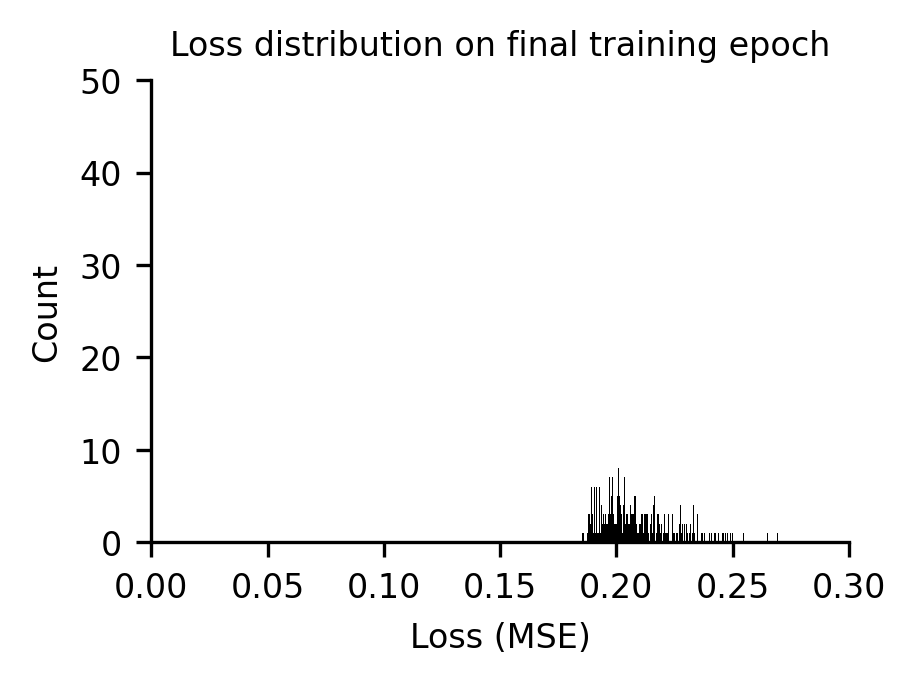

In [100]:
fig, ax = plt.subplots(figsize = (3,2))
ax.hist(loss_decay[-1], bins = 1000, color = 'black')
ax.tick_params(labelsize = fontsize)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_ylabel("Count", fontsize = fontsize)
ax.set_xlabel("Loss (MSE)", fontsize = fontsize)
ax.set_xticks(np.arange(0,0.35,0.05))
ax.set_ylim(0,50)
ax.set_title("Loss distribution on final training epoch", fontsize = fontsize)

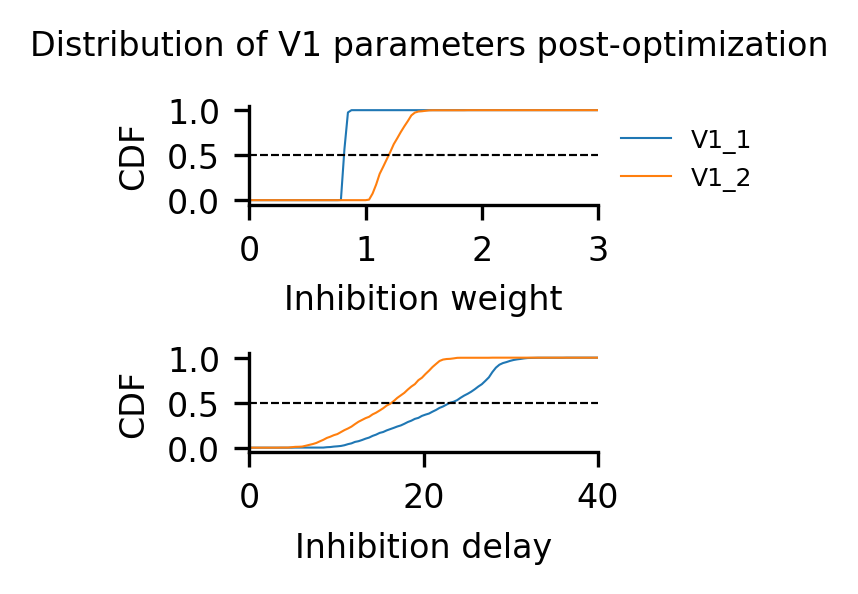

In [101]:
fig, ax = plt.subplots(2,1, figsize = (1.5, 1.5))

for i in range(2):
    i_ = np.abs(i-1)
    for u in range(2):
        x = np.linspace(
            list(plot_bounds.values())[-1-i][0],
            list(plot_bounds.values())[-1-i][1],
            100
        )
        data = param_history['V1_params'][:,-1,u,0,i_,0,0]
        kde = ecdf(data).cdf
        y = kde.evaluate(x)

        ax[i].plot(x,y, label = f'V1_{u+1}', linewidth = linewidth)
        ax[i].plot(x, np.full(len(x), 0.5), '--', color = 'black', linewidth = linewidth)
        ax[i].set_xlim(
            list(plot_bounds.values())[-1-i][0],
            list(plot_bounds.values())[-1-i][1]
        )
        ax[i].set_ylabel("CDF", fontsize = fontsize)
        ax[i].set_yticks(np.arange(0, 1.5, 0.5))
        ax[i].spines['top'].set_visible(False)
        ax[i].spines['right'].set_visible(False)
        ax[i].tick_params(labelsize = fontsize)

ax[0].set_xlabel('Inhibition weight', fontsize = fontsize)
ax[1].set_xlabel('Inhibition delay', fontsize = fontsize)
ax[0].legend(fontsize = 6, frameon = False, bbox_to_anchor = (1,1))
fig.subplots_adjust(hspace=1.5)
plt.suptitle("Distribution of V1 parameters post-optimization", fontsize = fontsize, x = 0.525, y = 1.05)

figname = '2d_model_v1_param_density_func_first_round.svg'
savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
plt.savefig(savepath, transparent = False, facecolor = 'white',
           bbox_inches = 'tight', dpi = 300)

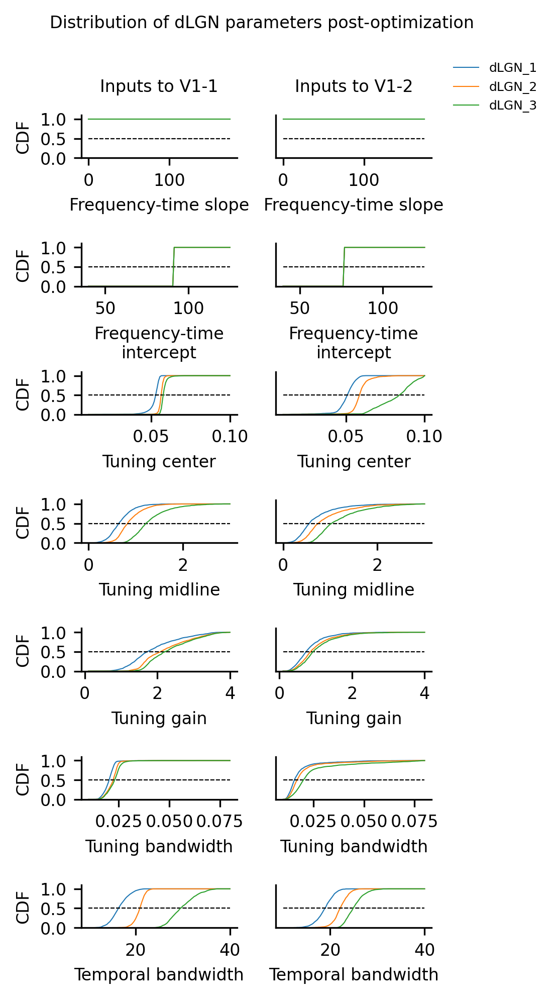

In [102]:
fig, ax = plt.subplots(7,2, figsize = (3,7))

param_labels = [
    'Frequency-time slope',
    'Frequency-time\nintercept',
    'Tuning center',
    'Tuning midline',
    'Tuning gain',
    'Tuning bandwidth',
    'Temporal bandwidth'
]

neuron_labels = [f'dLGN_{i+1}' for i in range(3)]


for row in range(7):
    ymax = []
    for i in range(3):
        for u in range(2):
            data = param_history['dLGN_params'][:,-1,u,i,row,0,0]
            x = np.linspace(
                list(plot_bounds.values())[:7][row][0],
                list(plot_bounds.values())[:7][row][1], 
                100
            )
            kde = ecdf(data).cdf
            y = kde.evaluate(x)

            ymax.append(y.max())

            ax[row, u].plot(x, np.full(len(x), 0.5), '--', color = 'black', linewidth = linewidth)
            ax[row, u].plot(x, y, label = neuron_labels[i], linewidth = linewidth)
            ax[row, u].set_xlabel(param_labels[row], fontsize = fontsize)
            ax[row, u].tick_params(labelsize = fontsize)

    ax[row, 0].set_ylabel("CDF", fontsize = fontsize)
    for u in range(2):
        ax[row, u].set_ylim(0, 1.1)
        ax[row, 1].set_yticks([])
        ax[row, 0].set_yticks(np.arange(0, 1.5, 0.5))
        ax[row, u].spines['top'].set_visible(False)
        ax[row, u].spines['right'].set_visible(False)

fig.subplots_adjust(hspace = 2, wspace=0.25)
plt.tick_params(labelsize = 8)
ax[0,1].legend(fontsize = 6, bbox_to_anchor = (1.75,2.5), frameon = False)
ax[0,0].set_title("Inputs to V1-1", fontsize = fontsize, y = 1.25)
ax[0,1].set_title("Inputs to V1-2", fontsize = fontsize, y = 1.25)
plt.suptitle("Distribution of dLGN parameters post-optimization", fontsize = fontsize, x = 0.525, y = 0.975)

figname = '2d_model_dlgn_param_density_func_first_round.svg'
savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
plt.savefig(savepath, transparent = False, facecolor = 'white',
           bbox_inches = 'tight', dpi = 300)

Text(0.5, 1.15, 'Convergence of V1 parameter values')

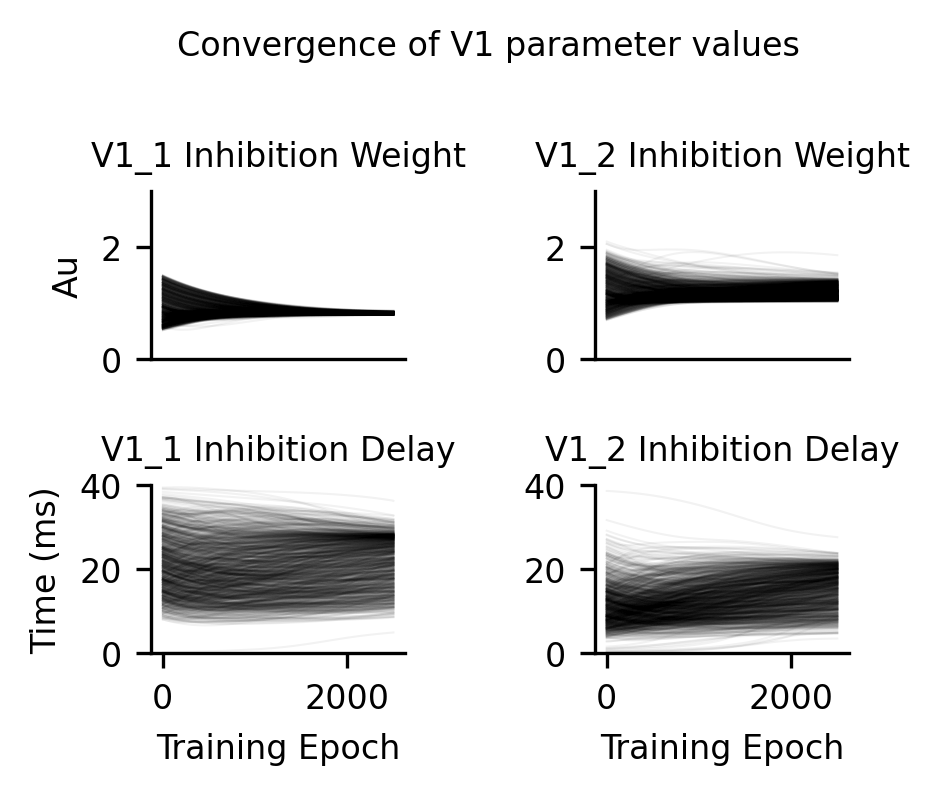

In [103]:
## inhibition weight::inhibition delay

fig, ax = plt.subplots(2,2, figsize = (3,2))

inh_w = 1
v1_n = 0 

for row in range(2):
    for col in range(2):
        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

ax[0,0].plot(
    param_history['V1_params'][:,:,v1_n,0,inh_w,0,0].T,
    linewidth=linewidth,
    alpha=0.05,
    color = 'black'
)

# 
v1_n = 1
ax[0,1].plot(
    param_history['V1_params'][:,:,v1_n,0,inh_w,0,0].T,
    linewidth=linewidth,
    alpha=0.05,
    color = 'black'
)

# a0
inh_d = 0
v1_n = 0
ax[1,0].plot(
    param_history['V1_params'][:,:,v1_n,0,inh_d,0,0].T,
    linewidth=linewidth,
    alpha=0.05,
    color = 'black'
)

# a1
v1_n = 1
ax[1,1].plot(
    param_history['V1_params'][:,:,v1_n,0,inh_d,0,0].T,
    linewidth=linewidth,
    alpha=0.05,
    color = 'black'
)

ax[0,0].set_ylim(plot_bounds['inh_w'][0], plot_bounds['inh_w'][1])
ax[0,0].set_title("V1_1 Inhibition Weight", fontsize = fontsize)
ax[0,0].set_xticks([])
ax[0,0].set_ylabel("Au", fontsize = fontsize)

ax[0,1].set_ylim(plot_bounds['inh_w'][0], plot_bounds['inh_w'][1])
ax[0,1].set_title("V1_2 Inhibition Weight", fontsize = fontsize)
ax[0,1].set_xticks([])

ax[1,0].set_ylim(plot_bounds['inh_d'][0], plot_bounds['inh_d'][1])
ax[1,0].set_title("V1_1 Inhibition Delay", fontsize = fontsize)
ax[1,0].set_ylabel("Time (ms)", fontsize = fontsize)
ax[1,0].set_xlabel("Training Epoch", fontsize = fontsize)

ax[1,1].set_ylim(plot_bounds['inh_d'][0], plot_bounds['inh_d'][1])
ax[1,1].set_title("V1_2 Inhibition Delay", fontsize = fontsize)
ax[1,1].set_xlabel("Training Epoch", fontsize = fontsize)
fig.subplots_adjust(wspace=0.75, hspace=0.75)
plt.suptitle("Convergence of V1 parameter values", fontsize = fontsize, y = 1.15)

# figname = '2d_model_v1_param_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

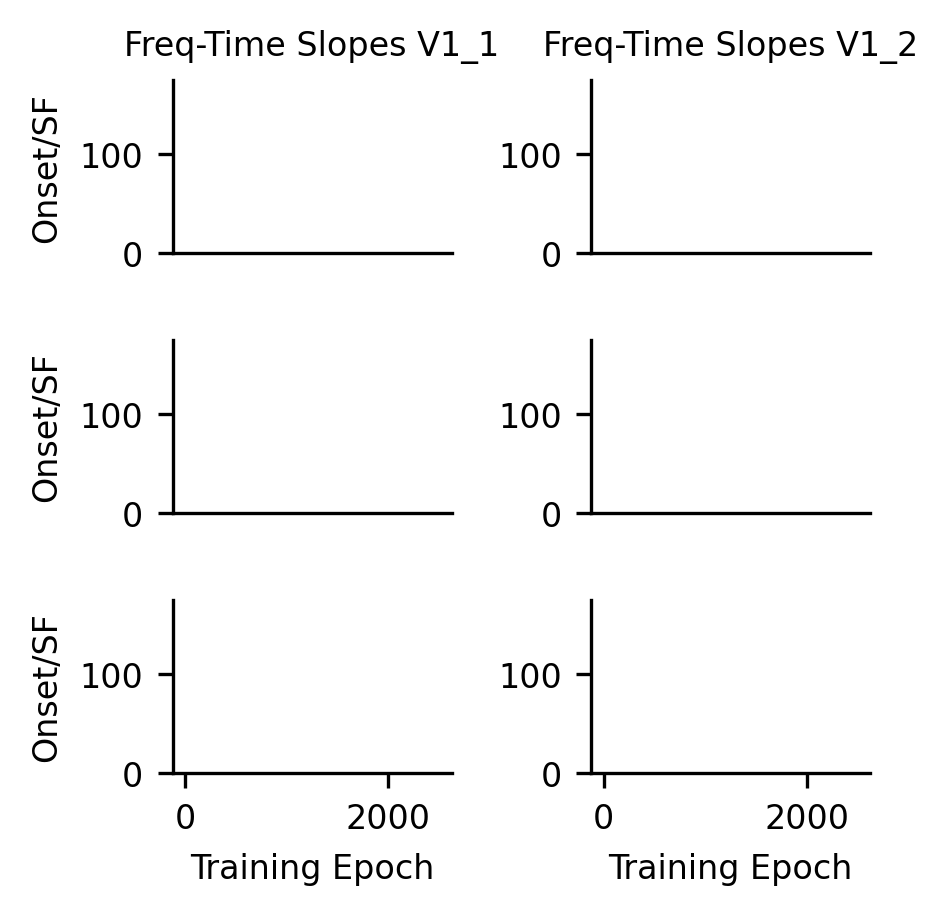

In [104]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 0

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Freq-Time Slopes V1_{i+1}", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Onset/SF", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['fts'][0], plot_bounds['fts'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_fts_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

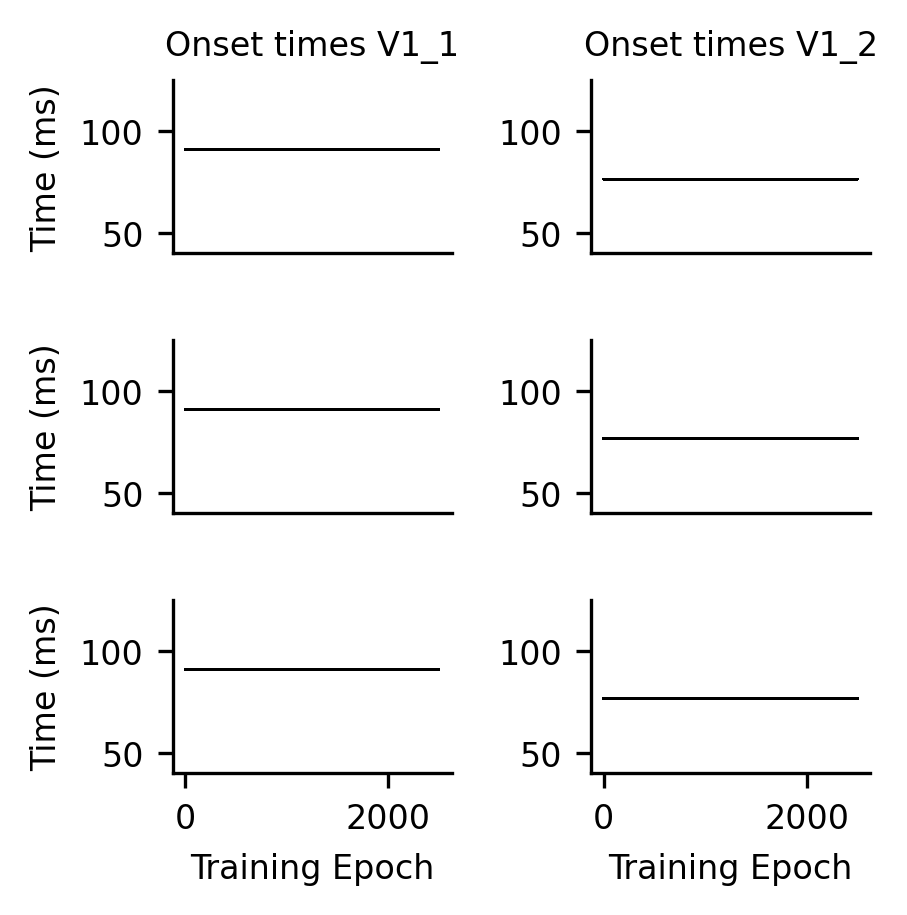

In [105]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 1

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Onset times V1_{i+1}", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Time (ms)", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['t'][0], plot_bounds['t'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_t_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

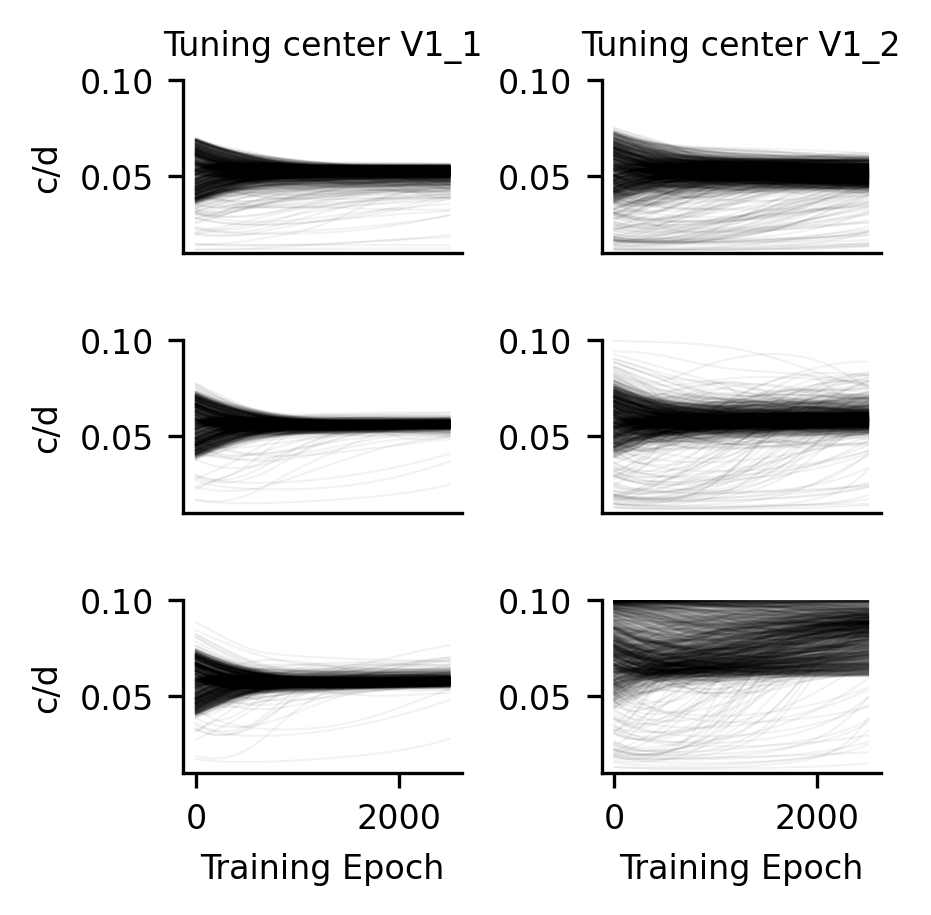

In [106]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 2

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Tuning center V1_{i+1}", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("c/d", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['ampc'][0], plot_bounds['ampc'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_ampc_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

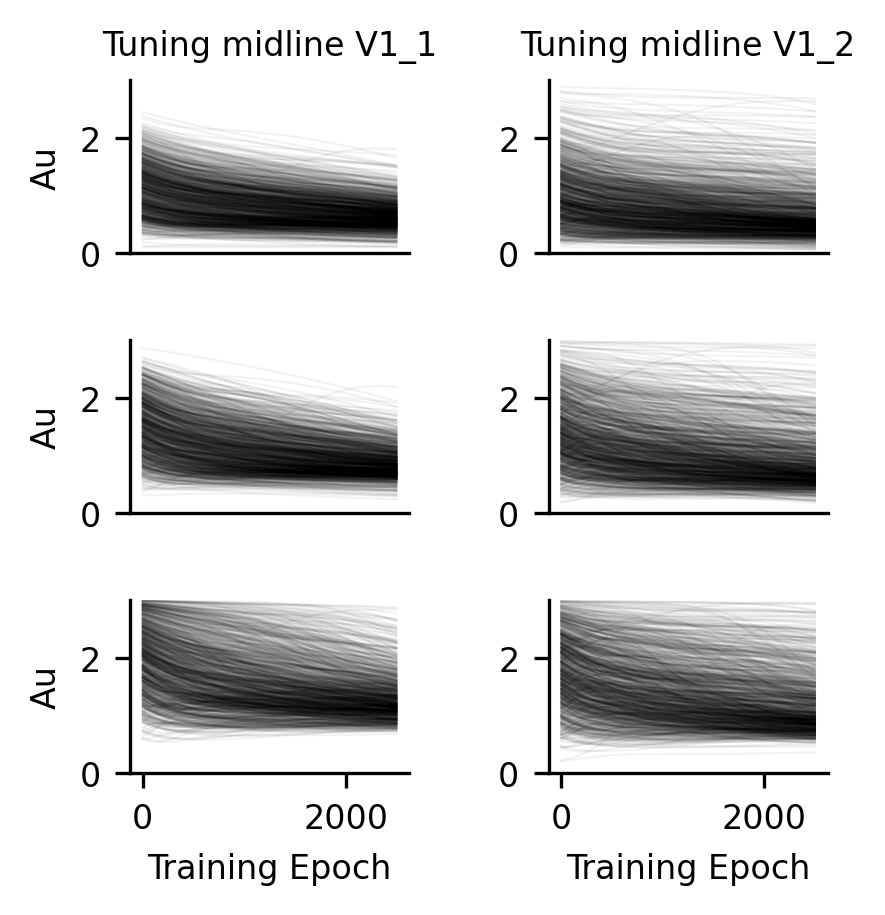

In [107]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 3

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Tuning midline V1_{i+1}", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Au", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['ampm'][0], plot_bounds['ampm'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_ampm_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

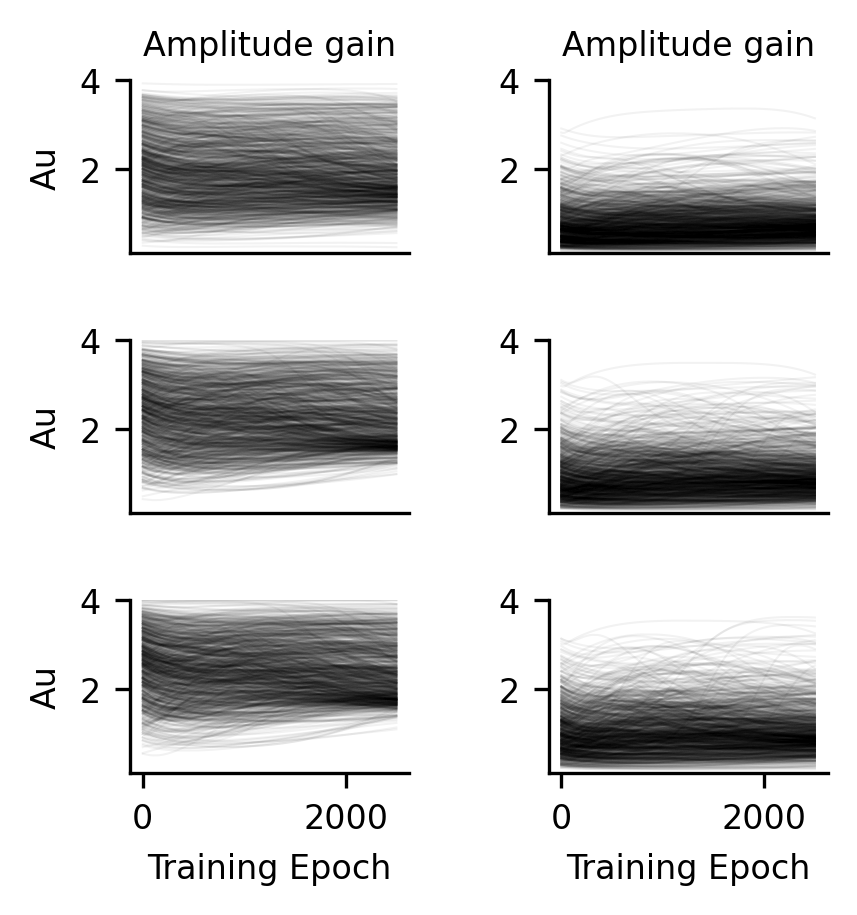

In [108]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 4

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Amplitude gain", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Au", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['ampg'][0], plot_bounds['ampg'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_ampg_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

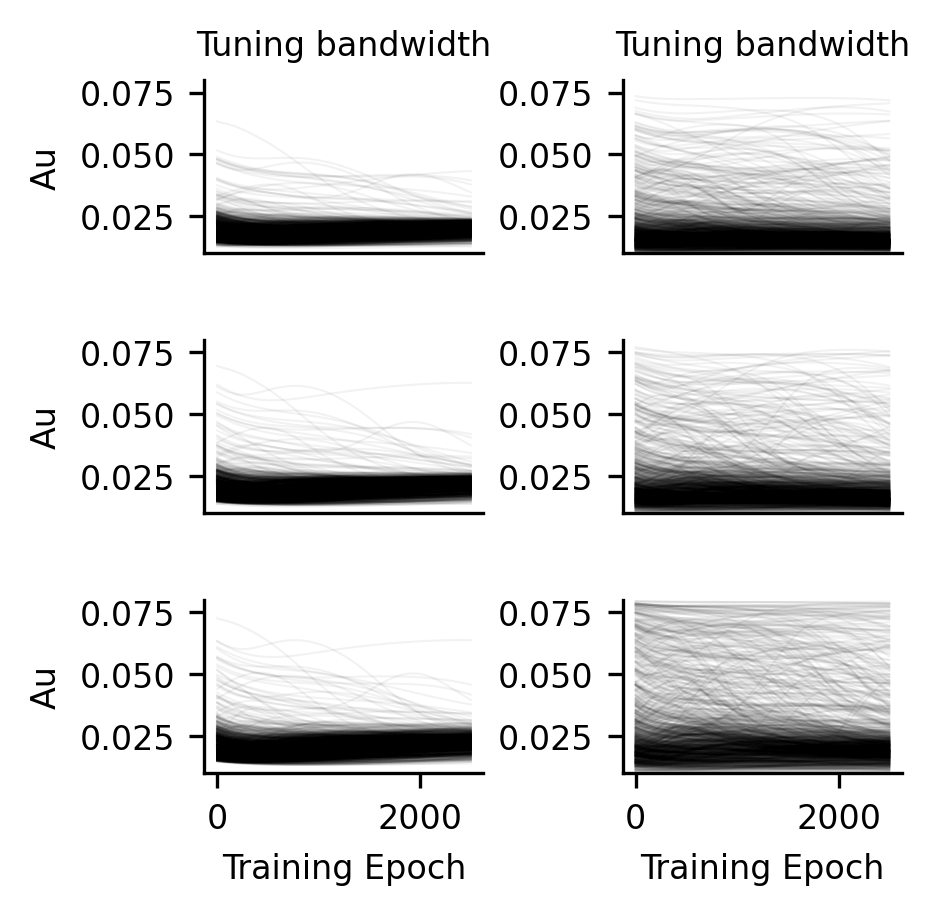

In [109]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 5

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Tuning bandwidth", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Au", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['ampw'][0], plot_bounds['ampw'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_ampw_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

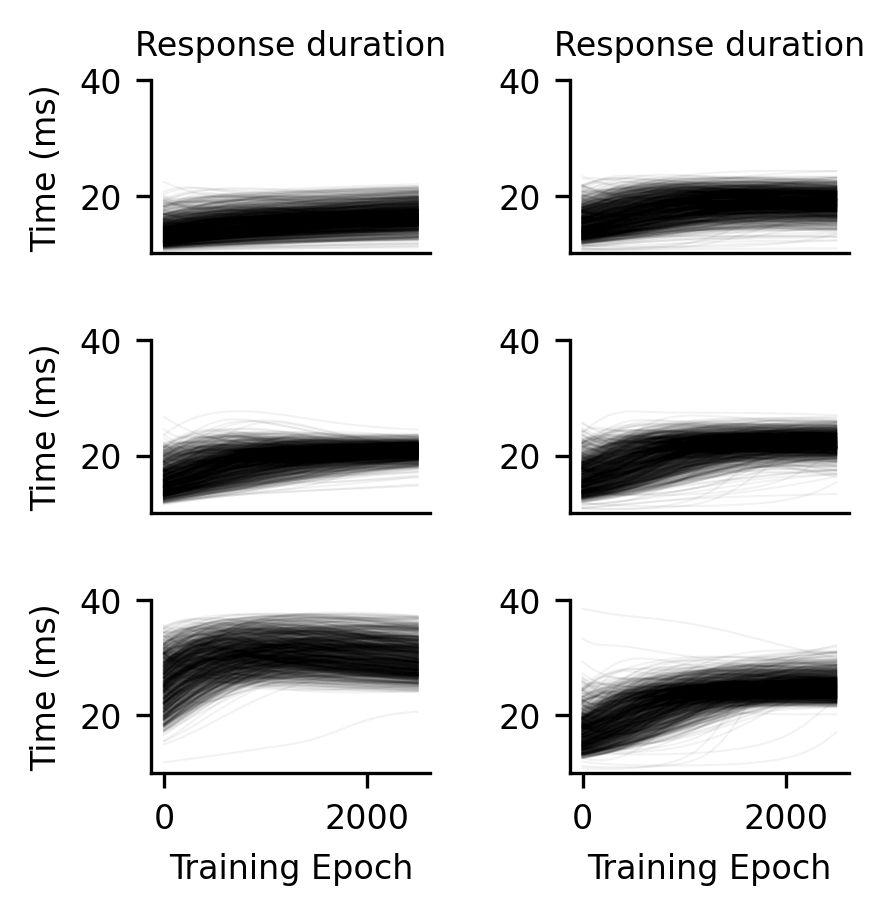

In [110]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 6

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Response duration", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Time (ms)", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['d'][0], plot_bounds['d'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_d_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

In [111]:
res = param_history['dLGN_params'].squeeze()
print(res.shape[2:])
n_samples, n_epochs = res.shape[:2]
n_params = np.prod(res.shape[2:])# + np.prod(r2.shape[2:])

res = res.reshape(res.shape[0] * res.shape[1], np.prod(res.shape[2:]))

(2, 3, 7)


In [112]:
pca = PCA() # all epochs included
res_transformed_pca = pca.fit_transform(res).reshape(n_samples, n_epochs, n_params)

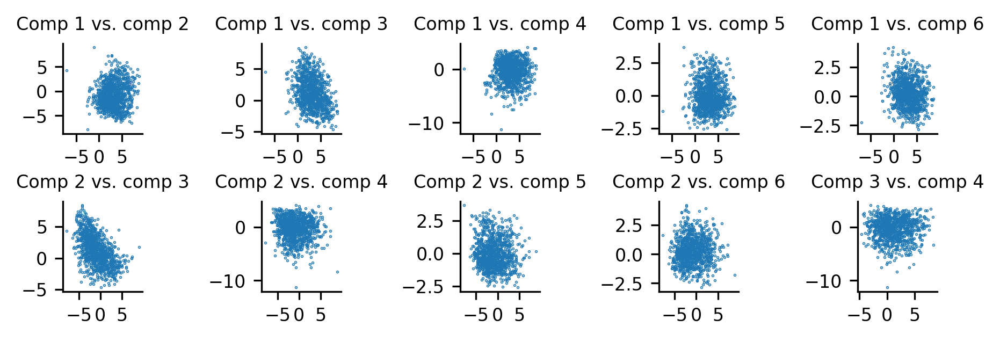

In [113]:
fig, ax = plt.subplots(2,5, figsize = (7,2))

comp_pairs = (list(combinations(np.arange(6), 2)))
i = 0
for row in range(2):
    for col in range(5):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        c0, c1 = comp_pairs[i]
        ax[row, col].scatter(res_transformed_pca[:,-1,c0], res_transformed_pca[:,-1,c1], s = 0.1) # last epoch
        ax[row, col].set_title(f"Comp {c0+1} vs. comp {c1+1}", fontsize = fontsize)
        i+=1

fig.subplots_adjust(hspace = 0.75, wspace = 1.5)
figname = '2d_model_pcaprojection_first_round.svg'
savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
plt.savefig(savepath, transparent = False, facecolor = 'white',
           bbox_inches = 'tight', dpi = 300)

In [114]:
lgn_params = [
    'Frequency-time slope',
    'Onset time',
    'Tuning center',
    'Tuning midline',
    'Tuning gain',
    'Tuning bandwidth',
    'Response duration'
]

v1_params = [
    'Inhibition delay',
    'Inhibition weight'
]

lgn_units = [
    'dLGN_1 into V1_1',
    'dLGN_2 into V1_1',
    'dLGN_3 into V1_1',
    'dLGN_1 into V1_2',
    'dLGN_2 into V1_2',
    'dLGN_3 into V1_2',
]

v1_units = [
    'V1_1',
    'V1_2'
]

full_lgn_params = []
for unit in lgn_units:
    for param in lgn_params:
        full_lgn_params.append(f"{param} ({unit})")

full_v1_params = []
for unit in v1_units:
    for param in v1_params:
        full_v1_params.append(f"{param} ({unit})")
        
param_names = full_lgn_params+full_v1_params

In [115]:
# for i in range(10):
#     fig, ax = plt.subplots(figsize = (8, 4))
#     ax.tick_params(labelsize = fontsize)
#     ax.spines['top'].set_visible(False)
#     ax.spines['right'].set_visible(False)
#     ax.bar(np.arange(len(full_lgn_params)), np.abs(pca.components_[i]))
#     ax.set_xticks(np.arange(len(full_lgn_params)))
#     ax.set_xticklabels(param_names[:len(full_lgn_params)], rotation = 90)
#     ax.set_ylabel("Loading scores", fontsize = fontsize)
#     ax.set_title(f"Component {i+1}", fontsize = fontsize)

#     figname = f'2d_model_pca_loadings_pc{i+1}_first_round.svg'
#     savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
#     plt.savefig(savepath, transparent = False, facecolor = 'white',
#             bbox_inches = 'tight', dpi = 300)

## Clipped fts and duration

In [116]:
param_bounds = {
    "fts": [0, 0],
    "t": [40, 125],
    "ampc": [0.01, 0.1],
    'ampm': [0,3],
    "ampg": [0.1, 4],
    "ampw": [0.01,0.08],
    "d": [20, 20],
    "inh_d": [0, 40],
    "inh_w": [0, 3],
}

In [117]:
model = SGCCircuit(param_bounds)

In [118]:
p = {x[0]:x[1] + tf.random.uniform(x[1].shape, -0.75, 0.75) 
    for x in optimized_model['final_epoch_params'].items()}

In [119]:
model.load_saved_parameters(p)

In [120]:
# initialize the optimizer
optimizer = Optimize(model, epochs=2500, loss_threshold=0)

# fit the model
optimizer.fit(X, Y_true)

Optimizer initialized with <keras.optimizers.optimizer_v2.adam.Adam object at 0x000002979FDE6A60>
Training step = 0, N_exploration_samples = 1000,
min_loss = 0.23438146710395813
med_loss = 0.788232147693634
max_loss = 4.914360523223877

Training step = 100, N_exploration_samples = 1000,
min_loss = 0.19257040321826935
med_loss = 0.5117762088775635
max_loss = 3.2292938232421875

Training step = 200, N_exploration_samples = 1000,
min_loss = 0.18130451440811157
med_loss = 0.37131255865097046
max_loss = 2.153696060180664

Training step = 300, N_exploration_samples = 1000,
min_loss = 0.1756976842880249
med_loss = 0.29798346757888794
max_loss = 1.4987266063690186

Training step = 400, N_exploration_samples = 1000,
min_loss = 0.17025473713874817
med_loss = 0.2557939291000366
max_loss = 1.0894432067871094

Training step = 500, N_exploration_samples = 1000,
min_loss = 0.1668354570865631
med_loss = 0.2288263440132141
max_loss = 0.797795295715332

Training step = 600, N_exploration_samples = 1000,

<tf.Tensor: shape=(2500, 1000), dtype=float16, numpy=
array([[0.6216, 1.175 , 1.479 , ..., 1.004 , 1.3125, 0.6323],
       [0.618 , 1.169 , 1.474 , ..., 0.999 , 1.306 , 0.63  ],
       [0.6147, 1.163 , 1.469 , ..., 0.9946, 1.3   , 0.6274],
       ...,
       [0.1625, 0.1715, 0.1625, ..., 0.166 , 0.1724, 0.1545],
       [0.1625, 0.1714, 0.1625, ..., 0.166 , 0.1724, 0.1545],
       [0.1625, 0.1714, 0.1625, ..., 0.166 , 0.1724, 0.1545]],
      dtype=float16)>

In [121]:
optimizer.save_state('conditional_optimization_clipped_fts_and_duration')

In [122]:
loss_decay = optimizer.outputs['loss_decay']

In [123]:
param_history = optimizer.outputs['param_history']

In [124]:
last_epoch = loss_decay[-1]
best = np.where(last_epoch == last_epoch.min())[0][0]
print(f"Index of best parameters: {best}, loss = {last_epoch[best]}")

Index of best parameters: 859, loss = 0.1456298828125


In [125]:
def minmax_norm(array, lower, upper):
    if (array.max() - array.min()) != 0:
        norm = (array - array.min()) / (array.max() - array.min())
        return lower + (norm * (upper-lower))
    else:
        return array

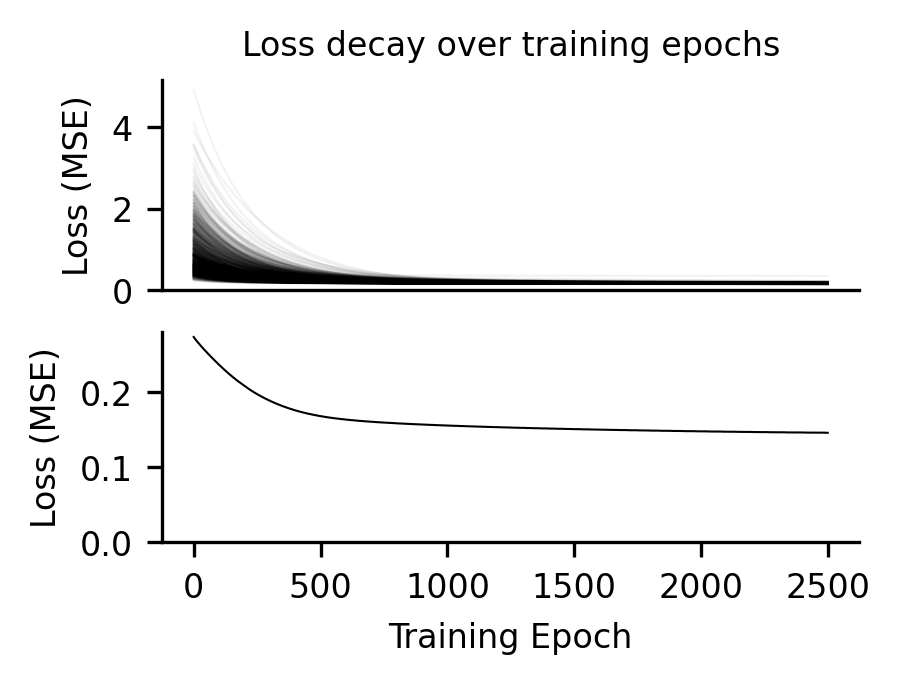

In [126]:
fig, ax = plt.subplots(2, figsize = (3,2))

for i, decay in enumerate(loss_decay.T):
    ax[0].plot(decay, alpha = 0.05, color = 'black', linewidth = linewidth)

ax[1].set_xlabel("Training Epoch", fontsize = fontsize)
ax[0].set_ylabel("Loss (MSE)", fontsize = fontsize)
ax[0].set_ylim(0,)
ax[0].set_xticks([])

ax[1].set_ylabel("Loss (MSE)", fontsize = fontsize)
ax[1].plot(loss_decay[:,best], alpha = 1, color = 'black', linewidth = linewidth)
ax[1].set_ylim(0.)
ax[0].set_title("Loss decay over training epochs", fontsize = fontsize)

for i in range(2):
    ax[i].tick_params(labelsize = fontsize)
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['right'].set_visible(False)

figname = '2d_model_loss_decay_first_round.svg'
savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
plt.savefig(savepath, transparent = False, facecolor = 'white',
           bbox_inches = 'tight', dpi = 300)

Text(0.5, 1.0, 'Loss distribution on final training epoch')

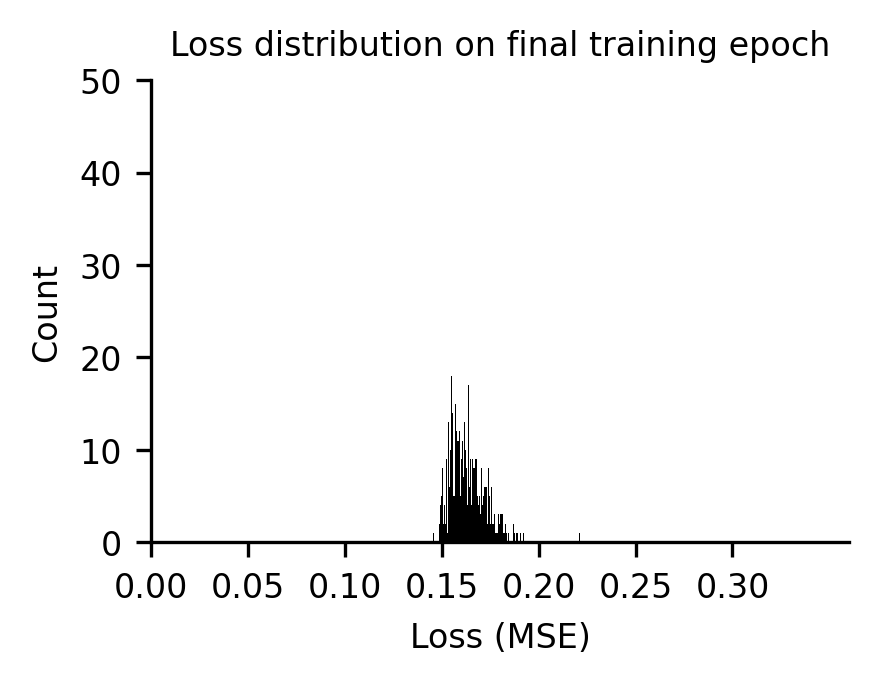

In [127]:
fig, ax = plt.subplots(figsize = (3,2))
ax.hist(loss_decay[-1], bins = 1000, color = 'black')
ax.tick_params(labelsize = fontsize)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_ylabel("Count", fontsize = fontsize)
ax.set_xlabel("Loss (MSE)", fontsize = fontsize)
ax.set_xticks(np.arange(0,0.35,0.05))
ax.set_ylim(0,50)
ax.set_title("Loss distribution on final training epoch", fontsize = fontsize)

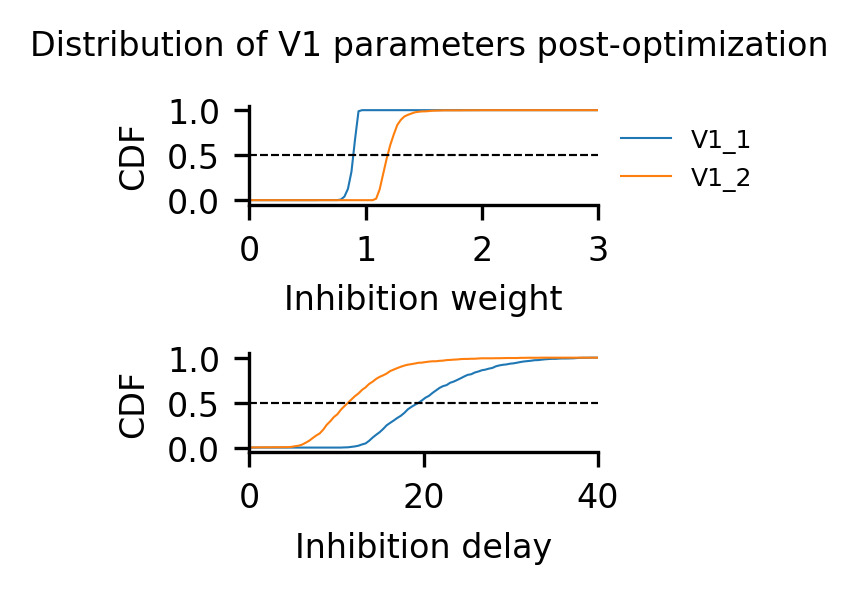

In [128]:
fig, ax = plt.subplots(2,1, figsize = (1.5, 1.5))

for i in range(2):
    i_ = np.abs(i-1)
    for u in range(2):
        x = np.linspace(
            list(plot_bounds.values())[-1-i][0],
            list(plot_bounds.values())[-1-i][1],
            100
        )
        data = param_history['V1_params'][:,-1,u,0,i_,0,0]
        kde = ecdf(data).cdf
        y = kde.evaluate(x)

        ax[i].plot(x,y, label = f'V1_{u+1}', linewidth = linewidth)
        ax[i].plot(x, np.full(len(x), 0.5), '--', color = 'black', linewidth = linewidth)
        ax[i].set_xlim(
            list(plot_bounds.values())[-1-i][0],
            list(plot_bounds.values())[-1-i][1]
        )
        ax[i].set_ylabel("CDF", fontsize = fontsize)
        ax[i].set_yticks(np.arange(0, 1.5, 0.5))
        ax[i].spines['top'].set_visible(False)
        ax[i].spines['right'].set_visible(False)
        ax[i].tick_params(labelsize = fontsize)

ax[0].set_xlabel('Inhibition weight', fontsize = fontsize)
ax[1].set_xlabel('Inhibition delay', fontsize = fontsize)
ax[0].legend(fontsize = 6, frameon = False, bbox_to_anchor = (1,1))
fig.subplots_adjust(hspace=1.5)
plt.suptitle("Distribution of V1 parameters post-optimization", fontsize = fontsize, x = 0.525, y = 1.05)

figname = '2d_model_v1_param_density_func_first_round.svg'
savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
plt.savefig(savepath, transparent = False, facecolor = 'white',
           bbox_inches = 'tight', dpi = 300)

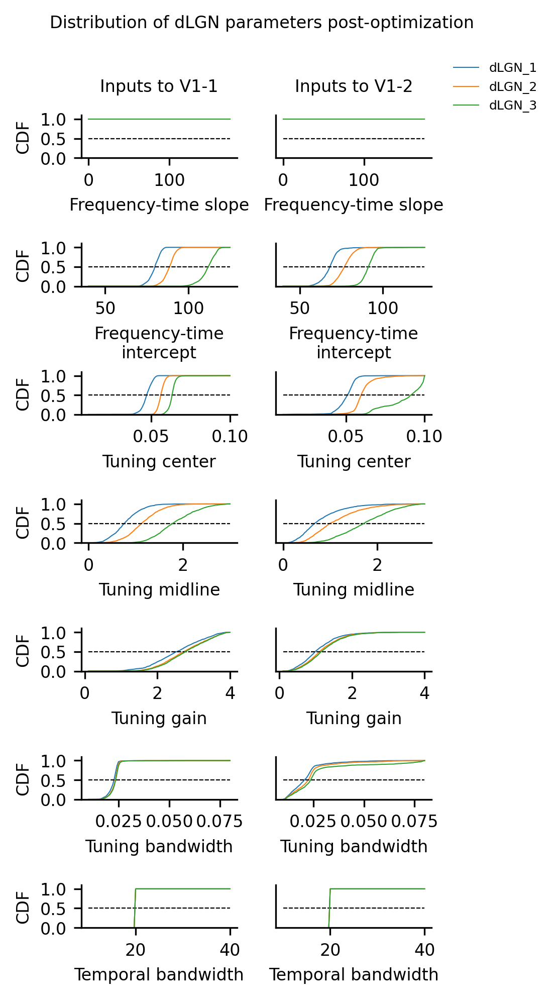

In [129]:
fig, ax = plt.subplots(7,2, figsize = (3,7))

param_labels = [
    'Frequency-time slope',
    'Frequency-time\nintercept',
    'Tuning center',
    'Tuning midline',
    'Tuning gain',
    'Tuning bandwidth',
    'Temporal bandwidth'
]

neuron_labels = [f'dLGN_{i+1}' for i in range(3)]


for row in range(7):
    ymax = []
    for i in range(3):
        for u in range(2):
            data = param_history['dLGN_params'][:,-1,u,i,row,0,0]
            x = np.linspace(
                list(plot_bounds.values())[:7][row][0],
                list(plot_bounds.values())[:7][row][1], 
                100
            )
            kde = ecdf(data).cdf
            y = kde.evaluate(x)

            ymax.append(y.max())

            ax[row, u].plot(x, np.full(len(x), 0.5), '--', color = 'black', linewidth = linewidth)
            ax[row, u].plot(x, y, label = neuron_labels[i], linewidth = linewidth)
            ax[row, u].set_xlabel(param_labels[row], fontsize = fontsize)
            ax[row, u].tick_params(labelsize = fontsize)

    ax[row, 0].set_ylabel("CDF", fontsize = fontsize)
    for u in range(2):
        ax[row, u].set_ylim(0, 1.1)
        ax[row, 1].set_yticks([])
        ax[row, 0].set_yticks(np.arange(0, 1.5, 0.5))
        ax[row, u].spines['top'].set_visible(False)
        ax[row, u].spines['right'].set_visible(False)

fig.subplots_adjust(hspace = 2, wspace=0.25)
plt.tick_params(labelsize = 8)
ax[0,1].legend(fontsize = 6, bbox_to_anchor = (1.75,2.5), frameon = False)
ax[0,0].set_title("Inputs to V1-1", fontsize = fontsize, y = 1.25)
ax[0,1].set_title("Inputs to V1-2", fontsize = fontsize, y = 1.25)
plt.suptitle("Distribution of dLGN parameters post-optimization", fontsize = fontsize, x = 0.525, y = 0.975)

figname = '2d_model_dlgn_param_density_func_first_round.svg'
savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
plt.savefig(savepath, transparent = False, facecolor = 'white',
           bbox_inches = 'tight', dpi = 300)

Text(0.5, 1.15, 'Convergence of V1 parameter values')

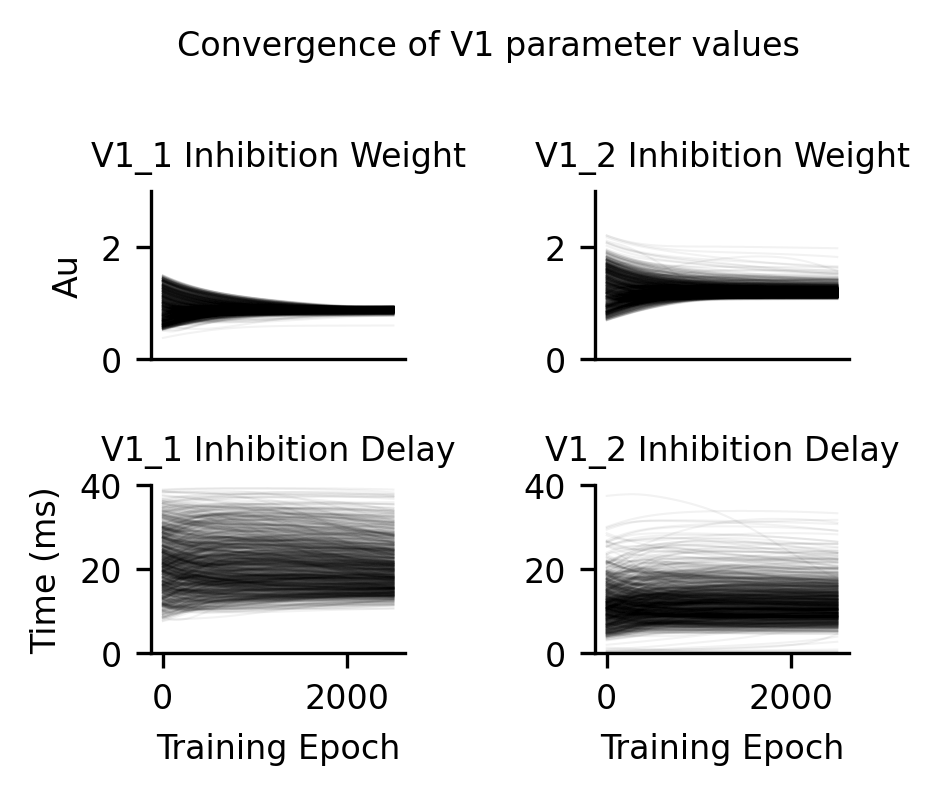

In [130]:
## inhibition weight::inhibition delay

fig, ax = plt.subplots(2,2, figsize = (3,2))

inh_w = 1
v1_n = 0 

for row in range(2):
    for col in range(2):
        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

ax[0,0].plot(
    param_history['V1_params'][:,:,v1_n,0,inh_w,0,0].T,
    linewidth=linewidth,
    alpha=0.05,
    color = 'black'
)

# 
v1_n = 1
ax[0,1].plot(
    param_history['V1_params'][:,:,v1_n,0,inh_w,0,0].T,
    linewidth=linewidth,
    alpha=0.05,
    color = 'black'
)

# a0
inh_d = 0
v1_n = 0
ax[1,0].plot(
    param_history['V1_params'][:,:,v1_n,0,inh_d,0,0].T,
    linewidth=linewidth,
    alpha=0.05,
    color = 'black'
)

# a1
v1_n = 1
ax[1,1].plot(
    param_history['V1_params'][:,:,v1_n,0,inh_d,0,0].T,
    linewidth=linewidth,
    alpha=0.05,
    color = 'black'
)

ax[0,0].set_ylim(plot_bounds['inh_w'][0], plot_bounds['inh_w'][1])
ax[0,0].set_title("V1_1 Inhibition Weight", fontsize = fontsize)
ax[0,0].set_xticks([])
ax[0,0].set_ylabel("Au", fontsize = fontsize)

ax[0,1].set_ylim(plot_bounds['inh_w'][0], plot_bounds['inh_w'][1])
ax[0,1].set_title("V1_2 Inhibition Weight", fontsize = fontsize)
ax[0,1].set_xticks([])

ax[1,0].set_ylim(plot_bounds['inh_d'][0], plot_bounds['inh_d'][1])
ax[1,0].set_title("V1_1 Inhibition Delay", fontsize = fontsize)
ax[1,0].set_ylabel("Time (ms)", fontsize = fontsize)
ax[1,0].set_xlabel("Training Epoch", fontsize = fontsize)

ax[1,1].set_ylim(plot_bounds['inh_d'][0], plot_bounds['inh_d'][1])
ax[1,1].set_title("V1_2 Inhibition Delay", fontsize = fontsize)
ax[1,1].set_xlabel("Training Epoch", fontsize = fontsize)
fig.subplots_adjust(wspace=0.75, hspace=0.75)
plt.suptitle("Convergence of V1 parameter values", fontsize = fontsize, y = 1.15)

# figname = '2d_model_v1_param_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

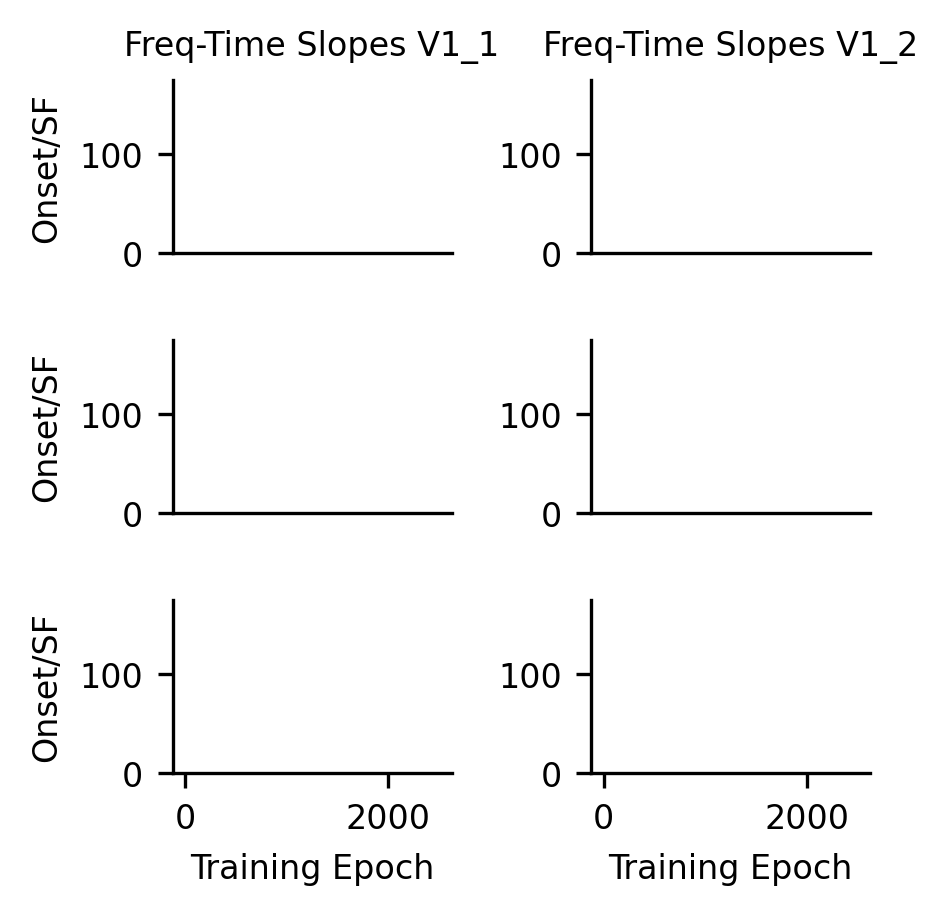

In [131]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 0

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Freq-Time Slopes V1_{i+1}", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Onset/SF", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['fts'][0], plot_bounds['fts'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_fts_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

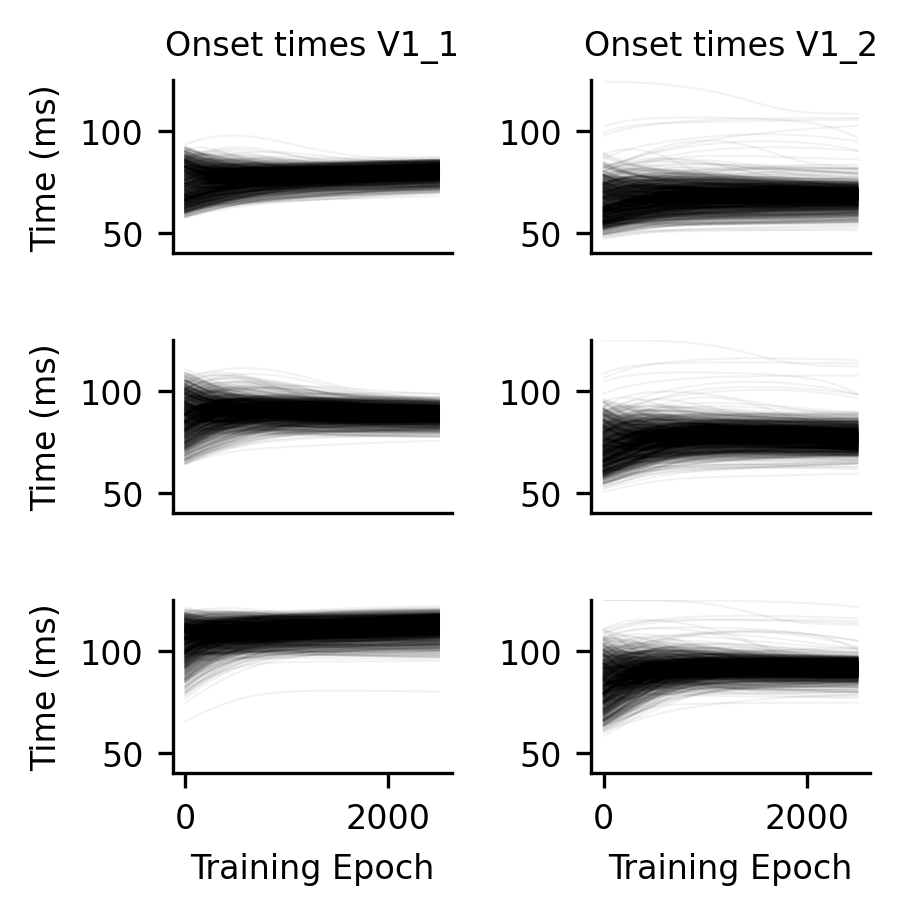

In [132]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 1

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Onset times V1_{i+1}", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Time (ms)", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['t'][0], plot_bounds['t'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_t_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

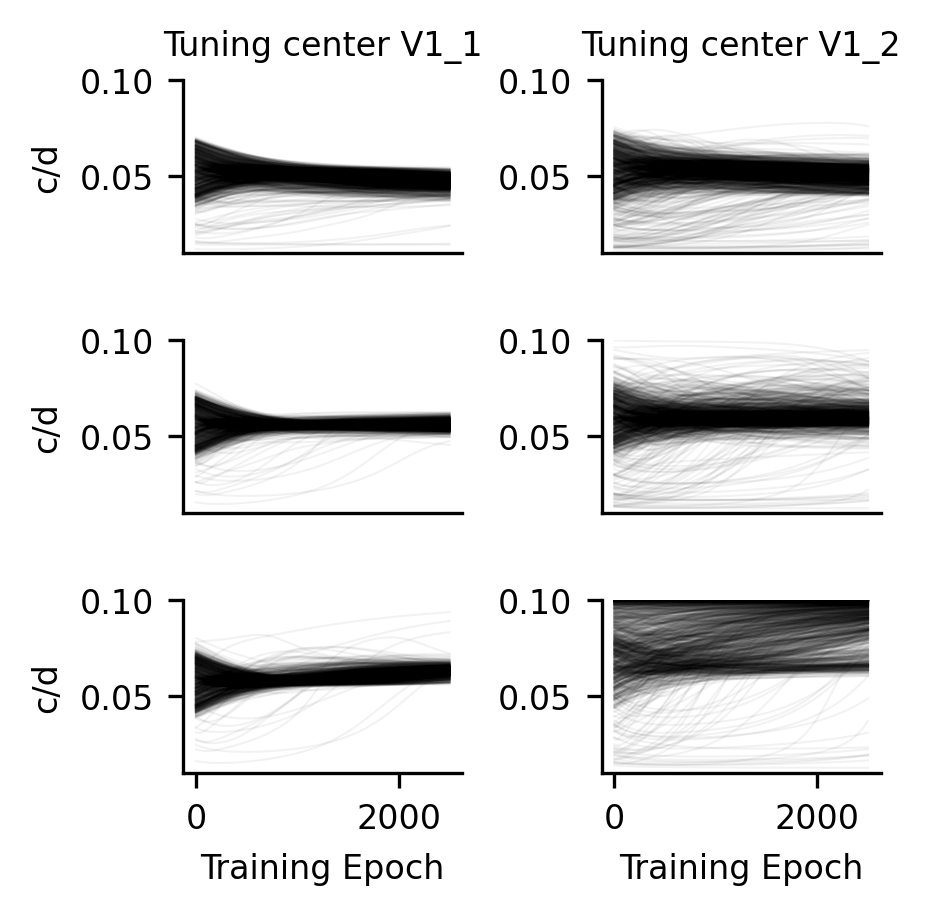

In [133]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 2

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Tuning center V1_{i+1}", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("c/d", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['ampc'][0], plot_bounds['ampc'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_ampc_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

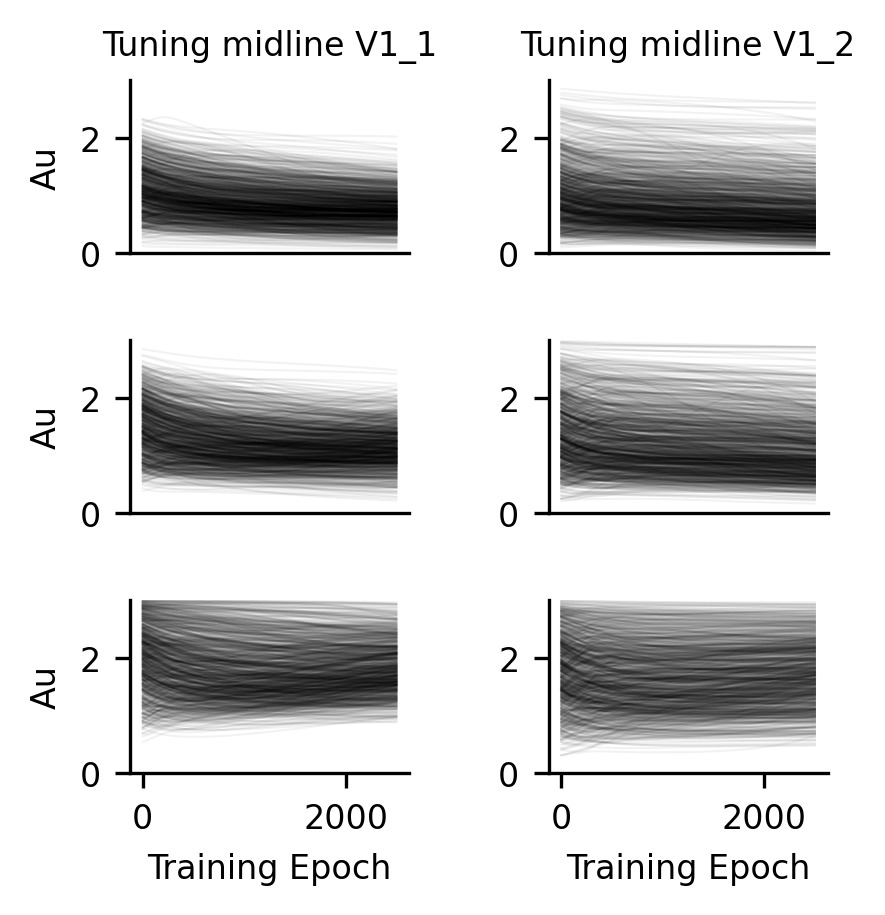

In [134]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 3

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Tuning midline V1_{i+1}", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Au", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['ampm'][0], plot_bounds['ampm'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_ampm_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

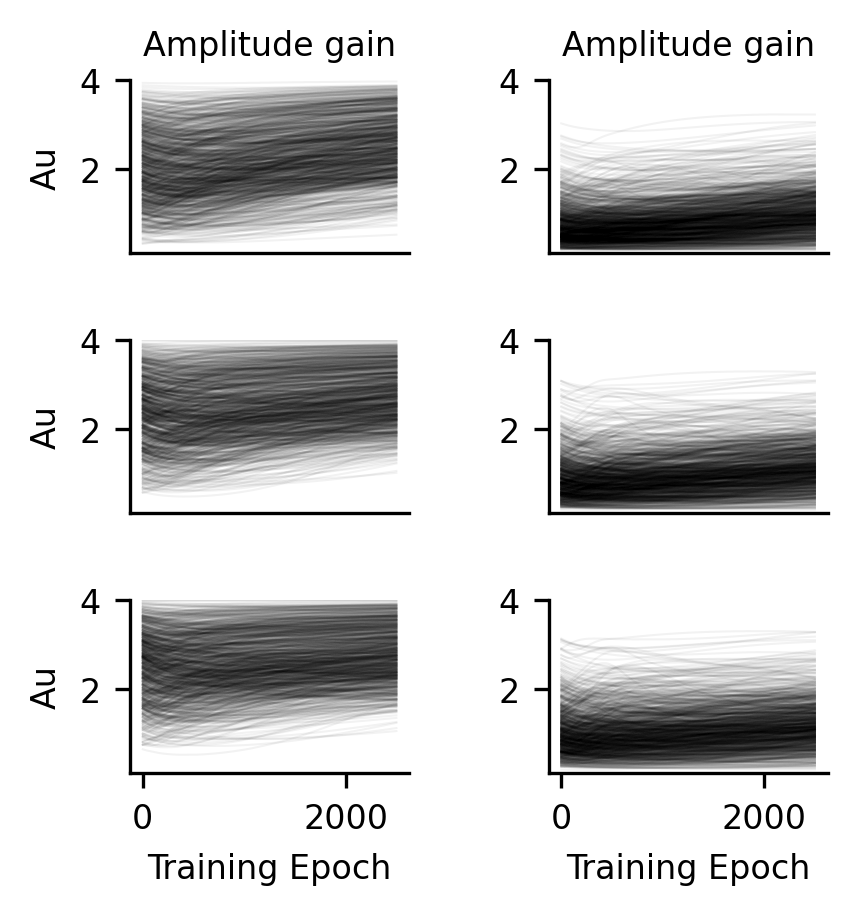

In [135]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 4

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Amplitude gain", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Au", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['ampg'][0], plot_bounds['ampg'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_ampg_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

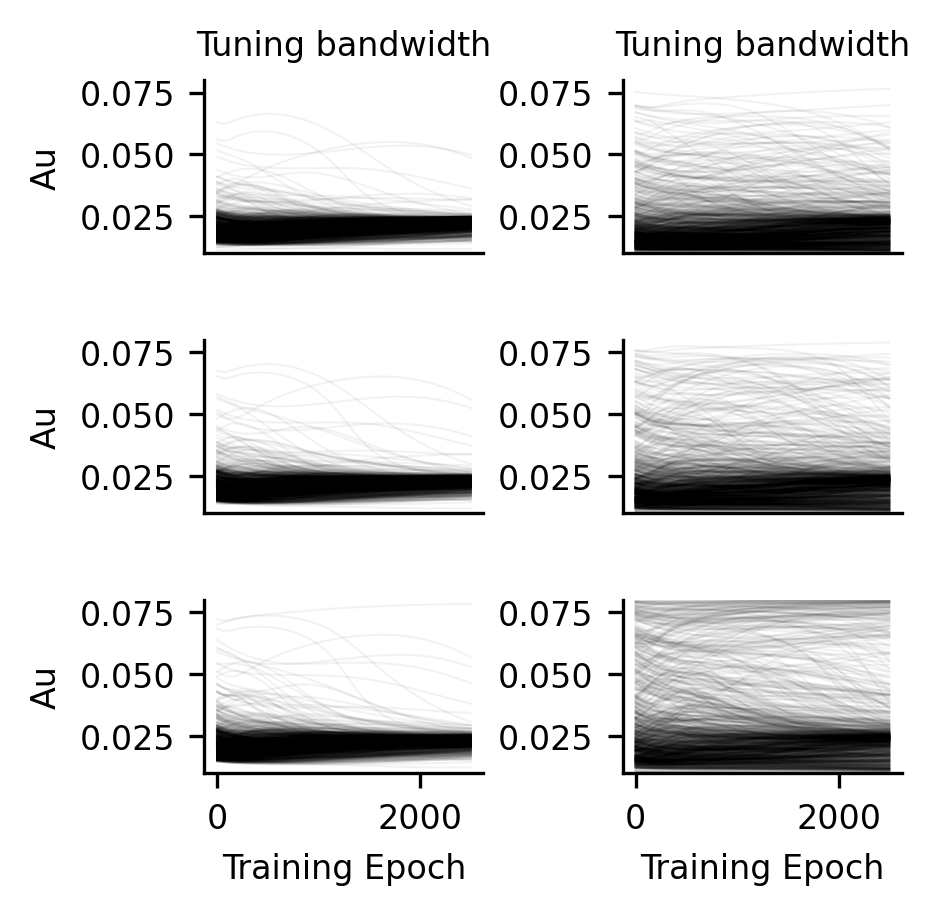

In [136]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 5

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Tuning bandwidth", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Au", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['ampw'][0], plot_bounds['ampw'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_ampw_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

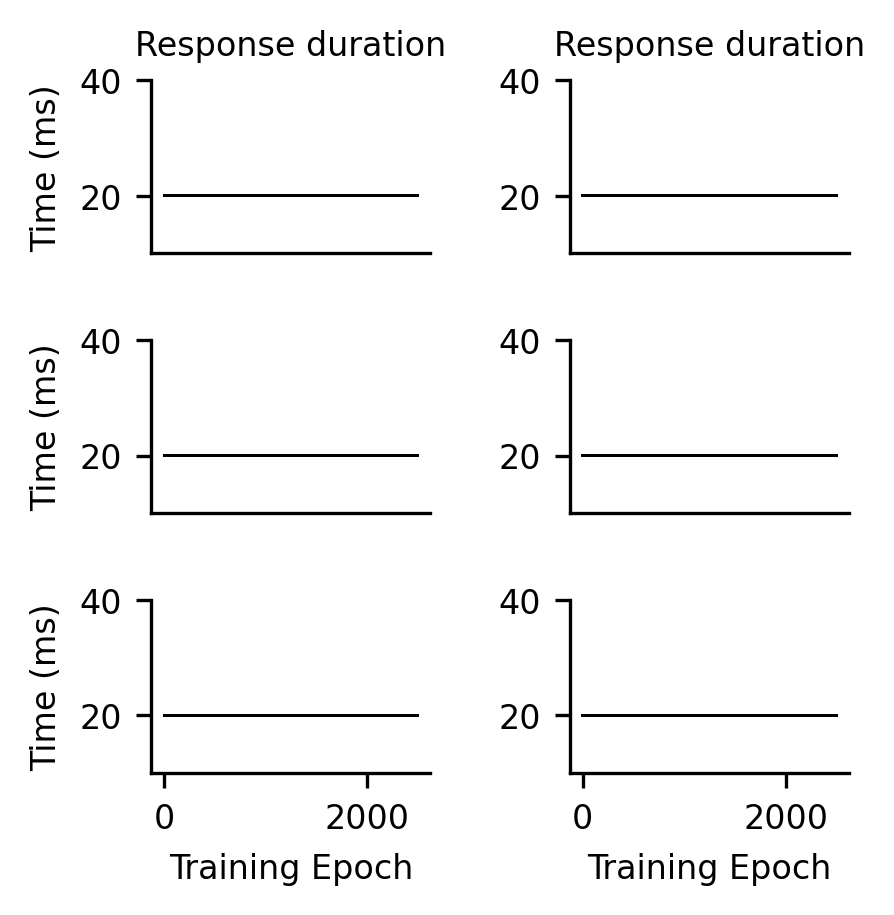

In [137]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 6

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Response duration", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Time (ms)", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['d'][0], plot_bounds['d'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_d_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

In [138]:
res = param_history['dLGN_params'].squeeze()
print(res.shape[2:])
n_samples, n_epochs = res.shape[:2]
n_params = np.prod(res.shape[2:])# + np.prod(r2.shape[2:])

res = res.reshape(res.shape[0] * res.shape[1], np.prod(res.shape[2:]))

(2, 3, 7)


In [139]:
pca = PCA() # all epochs included
res_transformed_pca = pca.fit_transform(res).reshape(n_samples, n_epochs, n_params)

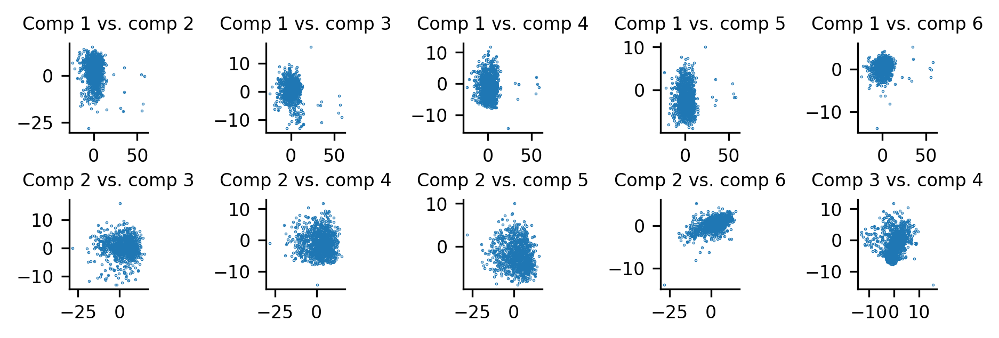

In [140]:
fig, ax = plt.subplots(2,5, figsize = (7,2))

comp_pairs = (list(combinations(np.arange(6), 2)))
i = 0
for row in range(2):
    for col in range(5):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        c0, c1 = comp_pairs[i]
        ax[row, col].scatter(res_transformed_pca[:,-1,c0], res_transformed_pca[:,-1,c1], s = 0.1) # last epoch
        ax[row, col].set_title(f"Comp {c0+1} vs. comp {c1+1}", fontsize = fontsize)
        i+=1

fig.subplots_adjust(hspace = 0.75, wspace = 1.5)
figname = '2d_model_pcaprojection_first_round.svg'
savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
plt.savefig(savepath, transparent = False, facecolor = 'white',
           bbox_inches = 'tight', dpi = 300)

In [141]:
lgn_params = [
    'Frequency-time slope',
    'Onset time',
    'Tuning center',
    'Tuning midline',
    'Tuning gain',
    'Tuning bandwidth',
    'Response duration'
]

v1_params = [
    'Inhibition delay',
    'Inhibition weight'
]

lgn_units = [
    'dLGN_1 into V1_1',
    'dLGN_2 into V1_1',
    'dLGN_3 into V1_1',
    'dLGN_1 into V1_2',
    'dLGN_2 into V1_2',
    'dLGN_3 into V1_2',
]

v1_units = [
    'V1_1',
    'V1_2'
]

full_lgn_params = []
for unit in lgn_units:
    for param in lgn_params:
        full_lgn_params.append(f"{param} ({unit})")

full_v1_params = []
for unit in v1_units:
    for param in v1_params:
        full_v1_params.append(f"{param} ({unit})")
        
param_names = full_lgn_params+full_v1_params

In [142]:
# for i in range(10):
#     fig, ax = plt.subplots(figsize = (8, 4))
#     ax.tick_params(labelsize = fontsize)
#     ax.spines['top'].set_visible(False)
#     ax.spines['right'].set_visible(False)
#     ax.bar(np.arange(len(full_lgn_params)), np.abs(pca.components_[i]))
#     ax.set_xticks(np.arange(len(full_lgn_params)))
#     ax.set_xticklabels(param_names[:len(full_lgn_params)], rotation = 90)
#     ax.set_ylabel("Loading scores", fontsize = fontsize)
#     ax.set_title(f"Component {i+1}", fontsize = fontsize)

#     figname = f'2d_model_pca_loadings_pc{i+1}_first_round.svg'
#     savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
#     plt.savefig(savepath, transparent = False, facecolor = 'white',
#             bbox_inches = 'tight', dpi = 300)

## Clipped fti and duration

In [143]:
param_bounds_1 = {
    "fts": [0, 175],
    "t": [tv1_1, tv1_1],
    "ampc": [0.01, 0.1],
    'ampm': [0,3],
    "ampg": [0.1, 4],
    "ampw": [0.01,0.08],
    "d": [20, 20],
    "inh_d": [0, 40],
    "inh_w": [0, 3],
}

param_bounds_2 = {
    "fts": [0, 175],
    "t": [tv1_2, tv1_2],
    "ampc": [0.01, 0.1],
    'ampm': [0,3],
    "ampg": [0.1, 4],
    "ampw": [0.01,0.08],
    "d": [20, 20],
    "inh_d": [0, 40],
    "inh_w": [0, 3],
}

bounds = [param_bounds_1, param_bounds_2]

In [144]:
model = SGCCircuit(bounds)

In [145]:
p = {x[0]:x[1] + tf.random.uniform(x[1].shape, -0.75, 0.75) 
    for x in optimized_model['final_epoch_params'].items()}

In [146]:
model.load_saved_parameters(p)

In [147]:
# initialize the optimizer
optimizer = Optimize(model, epochs=2500, loss_threshold=0)

# fit the model
optimizer.fit(X, Y_true)

Optimizer initialized with <keras.optimizers.optimizer_v2.adam.Adam object at 0x00000297B05AB730>
Training step = 0, N_exploration_samples = 1000,
min_loss = 0.1747131049633026
med_loss = 0.7570803165435791
max_loss = 3.3108859062194824

Training step = 100, N_exploration_samples = 1000,
min_loss = 0.14329418540000916
med_loss = 0.49587035179138184
max_loss = 2.2515811920166016

Training step = 200, N_exploration_samples = 1000,
min_loss = 0.1280509978532791
med_loss = 0.350003719329834
max_loss = 1.5720511674880981

Training step = 300, N_exploration_samples = 1000,
min_loss = 0.12474068254232407
med_loss = 0.26464754343032837
max_loss = 1.1338025331497192

Training step = 400, N_exploration_samples = 1000,
min_loss = 0.12367149442434311
med_loss = 0.2158573567867279
max_loss = 0.8352448344230652

Training step = 500, N_exploration_samples = 1000,
min_loss = 0.12301542609930038
med_loss = 0.18835708498954773
max_loss = 0.6360810399055481

Training step = 600, N_exploration_samples = 1

<tf.Tensor: shape=(2500, 1000), dtype=float16, numpy=
array([[0.2559 , 0.3694 , 0.608  , ..., 1.14   , 0.4866 , 0.4995 ],
       [0.2546 , 0.3684 , 0.605  , ..., 1.135  , 0.4849 , 0.4968 ],
       [0.2534 , 0.3674 , 0.602  , ..., 1.131  , 0.4832 , 0.4944 ],
       ...,
       [0.11615, 0.12256, 0.1151 , ..., 0.1289 , 0.1211 , 0.1137 ],
       [0.11615, 0.12256, 0.1151 , ..., 0.1289 , 0.1211 , 0.1137 ],
       [0.11615, 0.12256, 0.1151 , ..., 0.1289 , 0.1211 , 0.1137 ]],
      dtype=float16)>

In [148]:
optimizer.save_state('conditional_optimization_clipped_fti_and_duration')

In [149]:
loss_decay = optimizer.outputs['loss_decay']

In [150]:
param_history = optimizer.outputs['param_history']

In [151]:
last_epoch = loss_decay[-1]
best = np.where(last_epoch == last_epoch.min())[0][0]
print(f"Index of best parameters: {best}, loss = {last_epoch[best]}")

Index of best parameters: 628, loss = 0.10968017578125


In [152]:
def minmax_norm(array, lower, upper):
    if (array.max() - array.min()) != 0:
        norm = (array - array.min()) / (array.max() - array.min())
        return lower + (norm * (upper-lower))
    else:
        return array

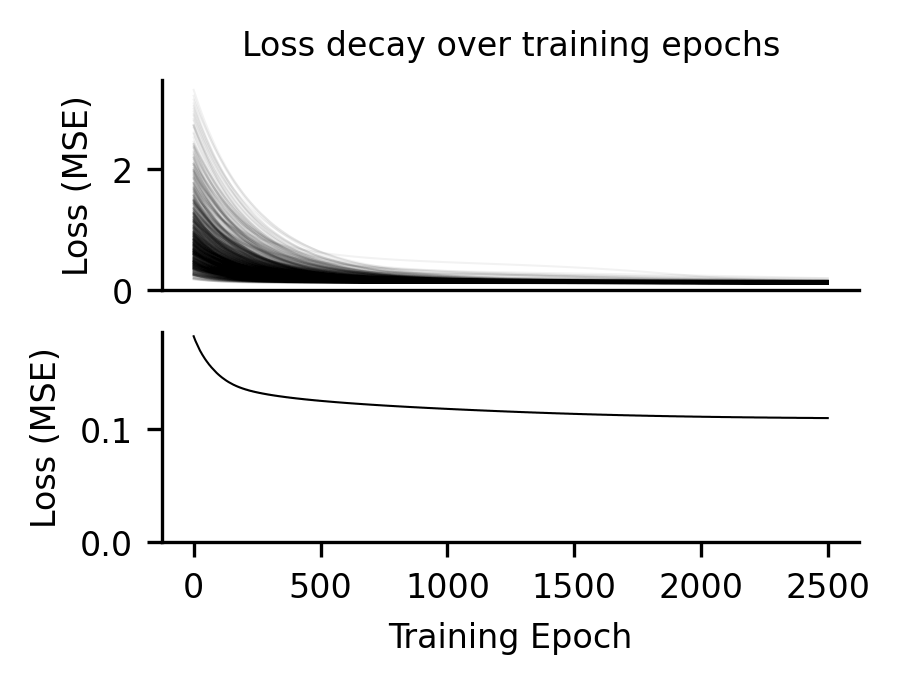

In [153]:
fig, ax = plt.subplots(2, figsize = (3,2))

for i, decay in enumerate(loss_decay.T):
    ax[0].plot(decay, alpha = 0.05, color = 'black', linewidth = linewidth)

ax[1].set_xlabel("Training Epoch", fontsize = fontsize)
ax[0].set_ylabel("Loss (MSE)", fontsize = fontsize)
ax[0].set_ylim(0,)
ax[0].set_xticks([])

ax[1].set_ylabel("Loss (MSE)", fontsize = fontsize)
ax[1].plot(loss_decay[:,best], alpha = 1, color = 'black', linewidth = linewidth)
ax[1].set_ylim(0.)
ax[0].set_title("Loss decay over training epochs", fontsize = fontsize)

for i in range(2):
    ax[i].tick_params(labelsize = fontsize)
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['right'].set_visible(False)

figname = '2d_model_loss_decay_first_round.svg'
savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
plt.savefig(savepath, transparent = False, facecolor = 'white',
           bbox_inches = 'tight', dpi = 300)

Text(0.5, 1.0, 'Loss distribution on final training epoch')

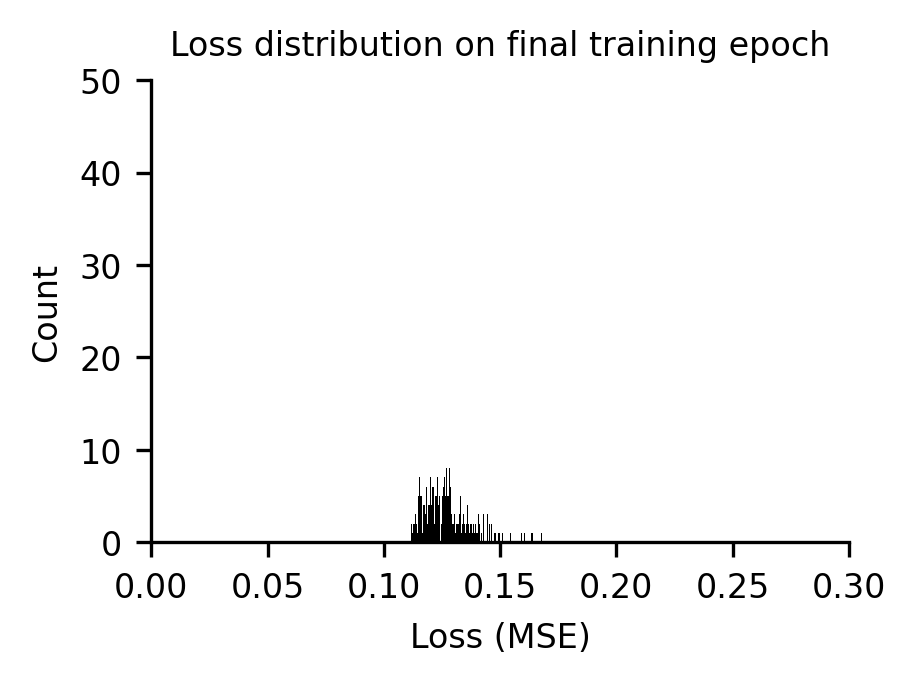

In [154]:
fig, ax = plt.subplots(figsize = (3,2))
ax.hist(loss_decay[-1], bins = 1000, color = 'black')
ax.tick_params(labelsize = fontsize)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_ylabel("Count", fontsize = fontsize)
ax.set_xlabel("Loss (MSE)", fontsize = fontsize)
ax.set_xticks(np.arange(0,0.35,0.05))
ax.set_ylim(0,50)
ax.set_title("Loss distribution on final training epoch", fontsize = fontsize)

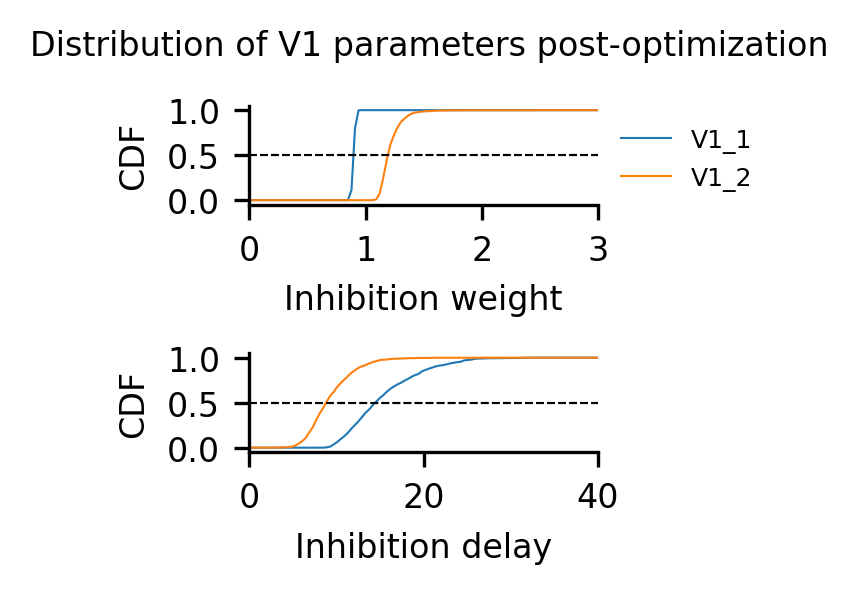

In [155]:
fig, ax = plt.subplots(2,1, figsize = (1.5, 1.5))

for i in range(2):
    i_ = np.abs(i-1)
    for u in range(2):
        x = np.linspace(
            list(plot_bounds.values())[-1-i][0],
            list(plot_bounds.values())[-1-i][1],
            100
        )
        data = param_history['V1_params'][:,-1,u,0,i_,0,0]
        kde = ecdf(data).cdf
        y = kde.evaluate(x)

        ax[i].plot(x,y, label = f'V1_{u+1}', linewidth = linewidth)
        ax[i].plot(x, np.full(len(x), 0.5), '--', color = 'black', linewidth = linewidth)
        ax[i].set_xlim(
            list(plot_bounds.values())[-1-i][0],
            list(plot_bounds.values())[-1-i][1]
        )
        ax[i].set_ylabel("CDF", fontsize = fontsize)
        ax[i].set_yticks(np.arange(0, 1.5, 0.5))
        ax[i].spines['top'].set_visible(False)
        ax[i].spines['right'].set_visible(False)
        ax[i].tick_params(labelsize = fontsize)

ax[0].set_xlabel('Inhibition weight', fontsize = fontsize)
ax[1].set_xlabel('Inhibition delay', fontsize = fontsize)
ax[0].legend(fontsize = 6, frameon = False, bbox_to_anchor = (1,1))
fig.subplots_adjust(hspace=1.5)
plt.suptitle("Distribution of V1 parameters post-optimization", fontsize = fontsize, x = 0.525, y = 1.05)

figname = '2d_model_v1_param_density_func_first_round.svg'
savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
plt.savefig(savepath, transparent = False, facecolor = 'white',
           bbox_inches = 'tight', dpi = 300)

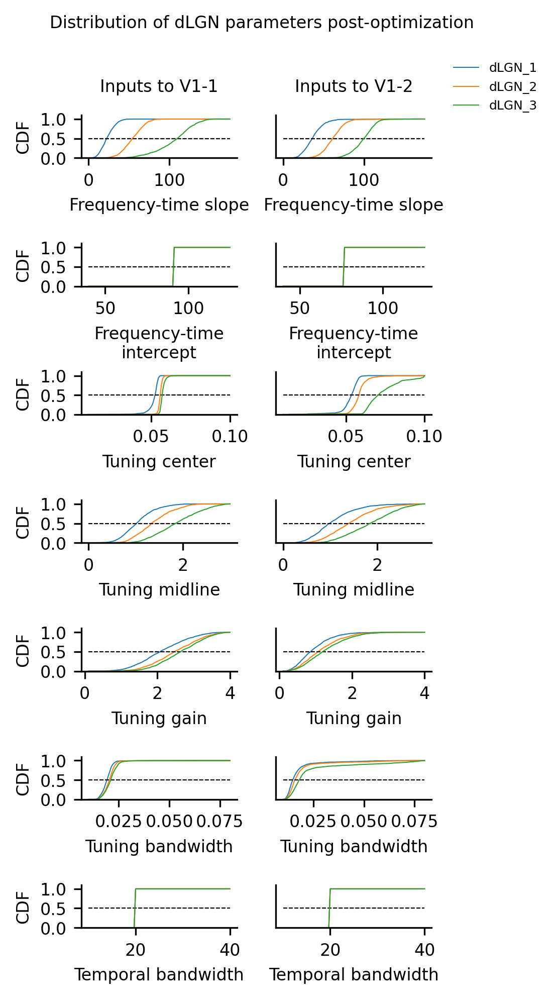

In [156]:
fig, ax = plt.subplots(7,2, figsize = (3,7))

param_labels = [
    'Frequency-time slope',
    'Frequency-time\nintercept',
    'Tuning center',
    'Tuning midline',
    'Tuning gain',
    'Tuning bandwidth',
    'Temporal bandwidth'
]

neuron_labels = [f'dLGN_{i+1}' for i in range(3)]


for row in range(7):
    ymax = []
    for i in range(3):
        for u in range(2):
            data = param_history['dLGN_params'][:,-1,u,i,row,0,0]
            x = np.linspace(
                list(plot_bounds.values())[:7][row][0],
                list(plot_bounds.values())[:7][row][1], 
                100
            )
            kde = ecdf(data).cdf
            y = kde.evaluate(x)

            ymax.append(y.max())

            ax[row, u].plot(x, np.full(len(x), 0.5), '--', color = 'black', linewidth = linewidth)
            ax[row, u].plot(x, y, label = neuron_labels[i], linewidth = linewidth)
            ax[row, u].set_xlabel(param_labels[row], fontsize = fontsize)
            ax[row, u].tick_params(labelsize = fontsize)

    ax[row, 0].set_ylabel("CDF", fontsize = fontsize)
    for u in range(2):
        ax[row, u].set_ylim(0, 1.1)
        ax[row, 1].set_yticks([])
        ax[row, 0].set_yticks(np.arange(0, 1.5, 0.5))
        ax[row, u].spines['top'].set_visible(False)
        ax[row, u].spines['right'].set_visible(False)

fig.subplots_adjust(hspace = 2, wspace=0.25)
plt.tick_params(labelsize = 8)
ax[0,1].legend(fontsize = 6, bbox_to_anchor = (1.75,2.5), frameon = False)
ax[0,0].set_title("Inputs to V1-1", fontsize = fontsize, y = 1.25)
ax[0,1].set_title("Inputs to V1-2", fontsize = fontsize, y = 1.25)
plt.suptitle("Distribution of dLGN parameters post-optimization", fontsize = fontsize, x = 0.525, y = 0.975)

figname = '2d_model_dlgn_param_density_func_first_round.svg'
savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
plt.savefig(savepath, transparent = False, facecolor = 'white',
           bbox_inches = 'tight', dpi = 300)

Text(0.5, 1.15, 'Convergence of V1 parameter values')

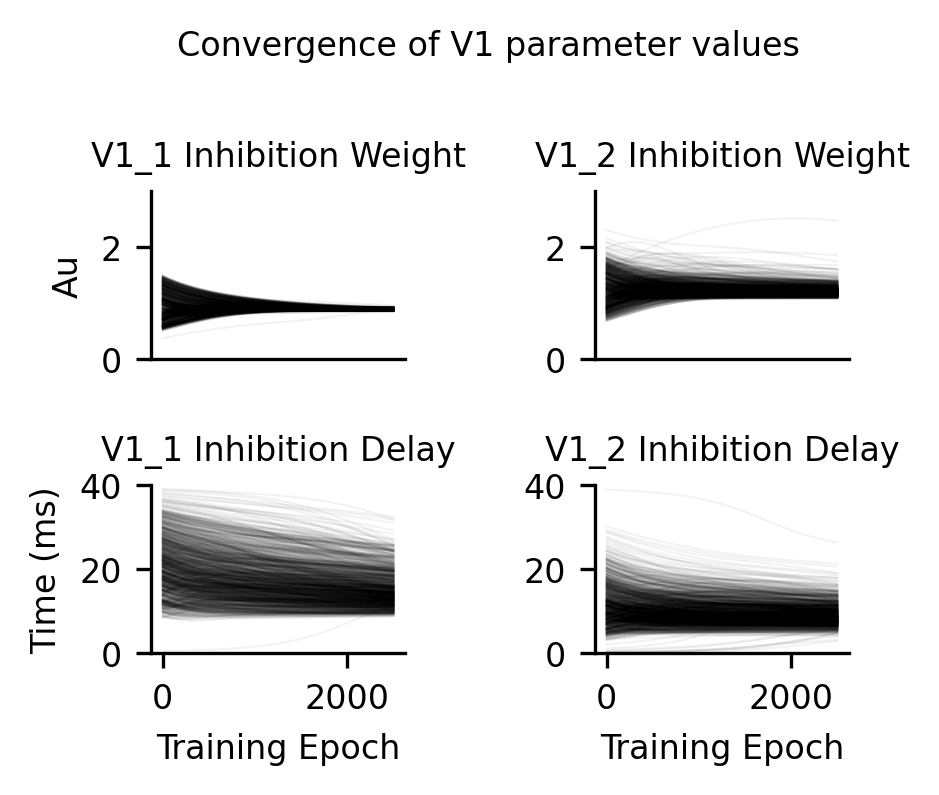

In [157]:
## inhibition weight::inhibition delay

fig, ax = plt.subplots(2,2, figsize = (3,2))

inh_w = 1
v1_n = 0 

for row in range(2):
    for col in range(2):
        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

ax[0,0].plot(
    param_history['V1_params'][:,:,v1_n,0,inh_w,0,0].T,
    linewidth=linewidth,
    alpha=0.05,
    color = 'black'
)

# 
v1_n = 1
ax[0,1].plot(
    param_history['V1_params'][:,:,v1_n,0,inh_w,0,0].T,
    linewidth=linewidth,
    alpha=0.05,
    color = 'black'
)

# a0
inh_d = 0
v1_n = 0
ax[1,0].plot(
    param_history['V1_params'][:,:,v1_n,0,inh_d,0,0].T,
    linewidth=linewidth,
    alpha=0.05,
    color = 'black'
)

# a1
v1_n = 1
ax[1,1].plot(
    param_history['V1_params'][:,:,v1_n,0,inh_d,0,0].T,
    linewidth=linewidth,
    alpha=0.05,
    color = 'black'
)

ax[0,0].set_ylim(plot_bounds['inh_w'][0], plot_bounds['inh_w'][1])
ax[0,0].set_title("V1_1 Inhibition Weight", fontsize = fontsize)
ax[0,0].set_xticks([])
ax[0,0].set_ylabel("Au", fontsize = fontsize)

ax[0,1].set_ylim(plot_bounds['inh_w'][0], plot_bounds['inh_w'][1])
ax[0,1].set_title("V1_2 Inhibition Weight", fontsize = fontsize)
ax[0,1].set_xticks([])

ax[1,0].set_ylim(plot_bounds['inh_d'][0], plot_bounds['inh_d'][1])
ax[1,0].set_title("V1_1 Inhibition Delay", fontsize = fontsize)
ax[1,0].set_ylabel("Time (ms)", fontsize = fontsize)
ax[1,0].set_xlabel("Training Epoch", fontsize = fontsize)

ax[1,1].set_ylim(plot_bounds['inh_d'][0], plot_bounds['inh_d'][1])
ax[1,1].set_title("V1_2 Inhibition Delay", fontsize = fontsize)
ax[1,1].set_xlabel("Training Epoch", fontsize = fontsize)
fig.subplots_adjust(wspace=0.75, hspace=0.75)
plt.suptitle("Convergence of V1 parameter values", fontsize = fontsize, y = 1.15)

# figname = '2d_model_v1_param_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

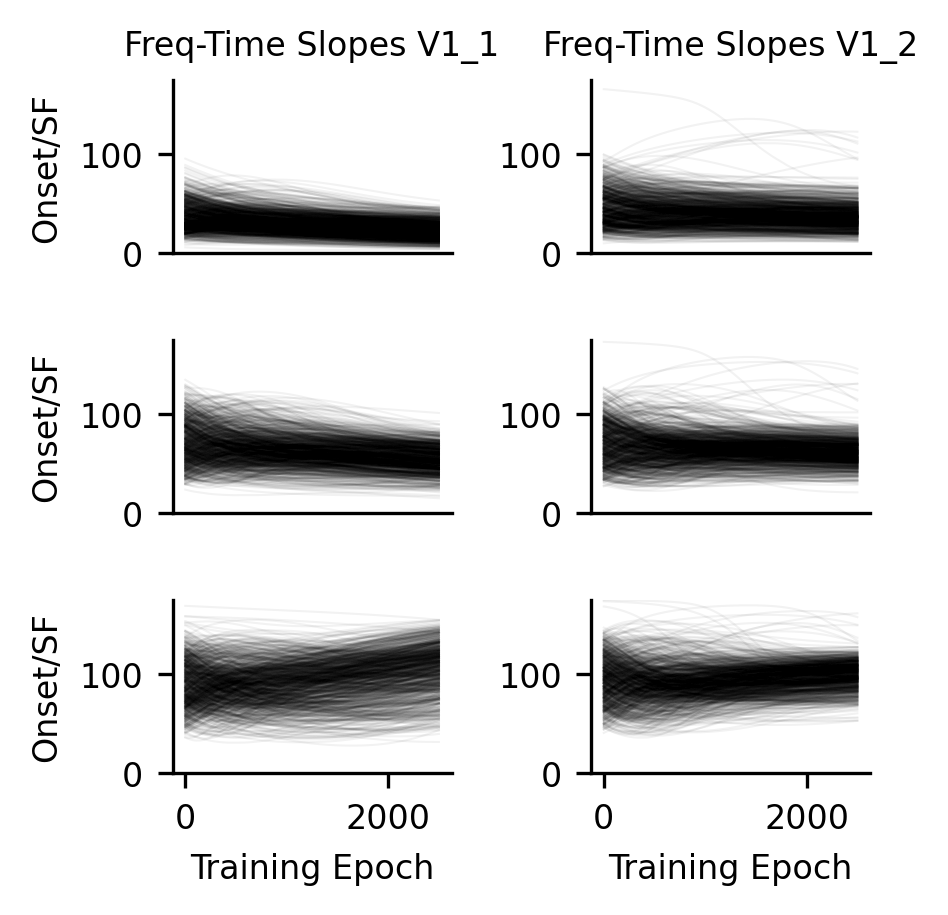

In [158]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 0

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Freq-Time Slopes V1_{i+1}", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Onset/SF", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['fts'][0], plot_bounds['fts'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_fts_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

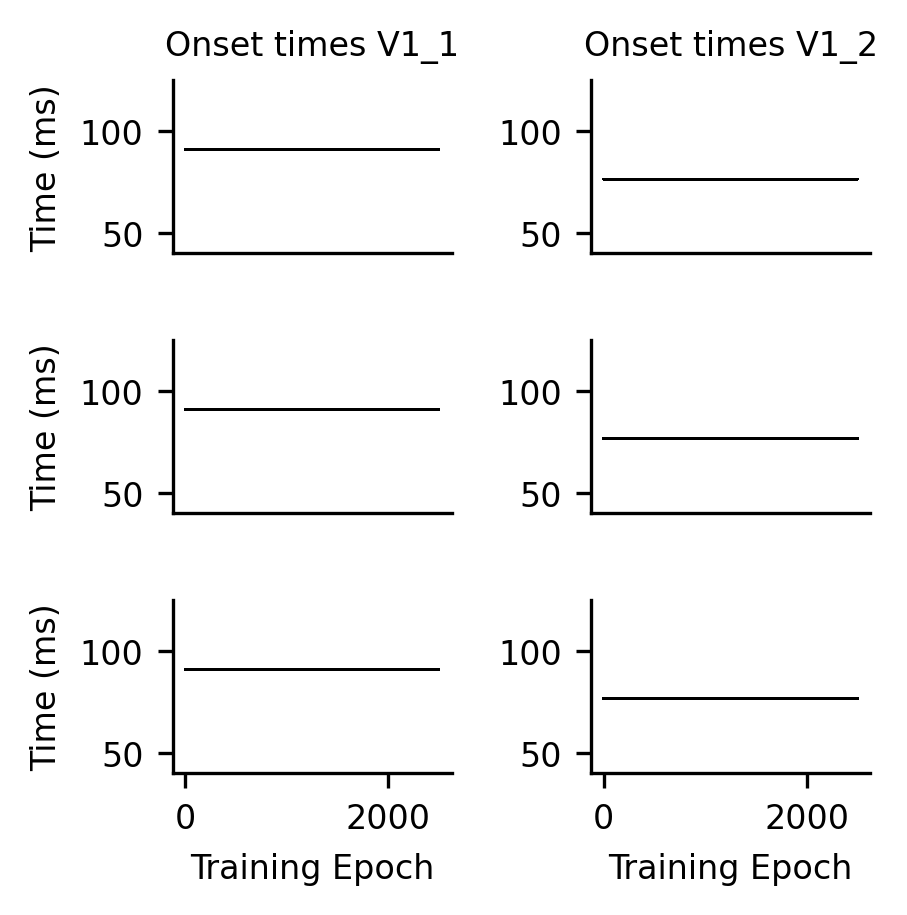

In [159]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 1

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Onset times V1_{i+1}", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Time (ms)", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['t'][0], plot_bounds['t'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_t_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

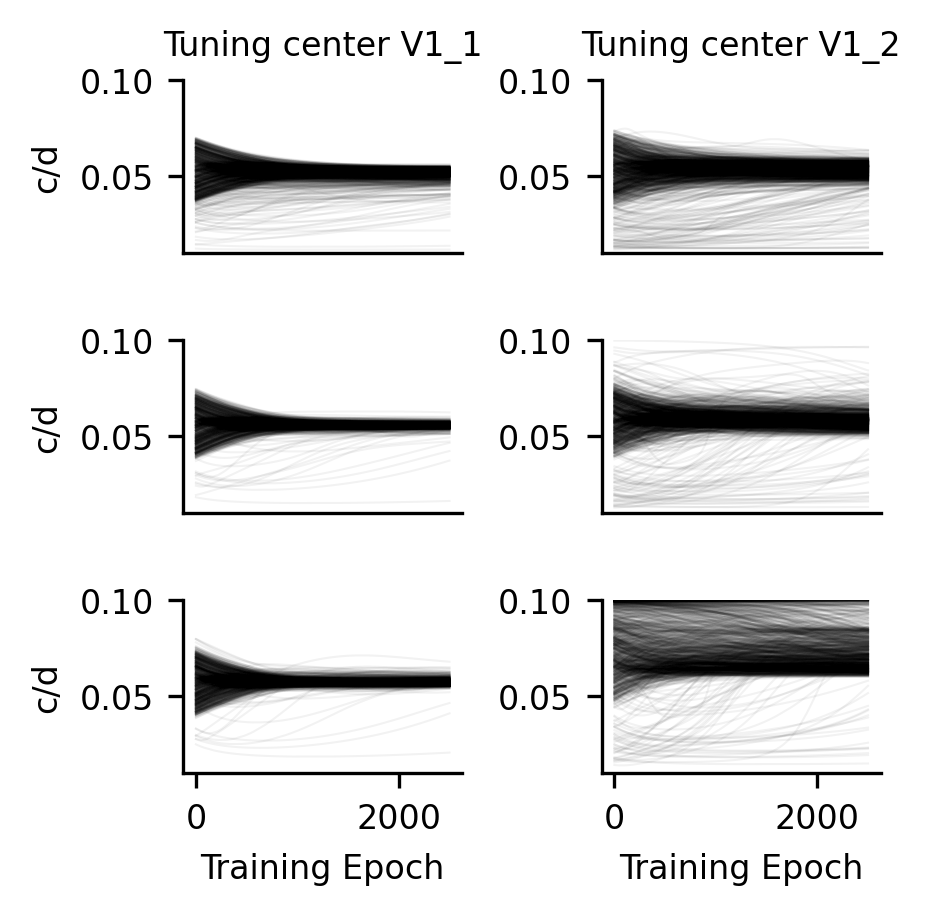

In [160]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 2

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Tuning center V1_{i+1}", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("c/d", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['ampc'][0], plot_bounds['ampc'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_ampc_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

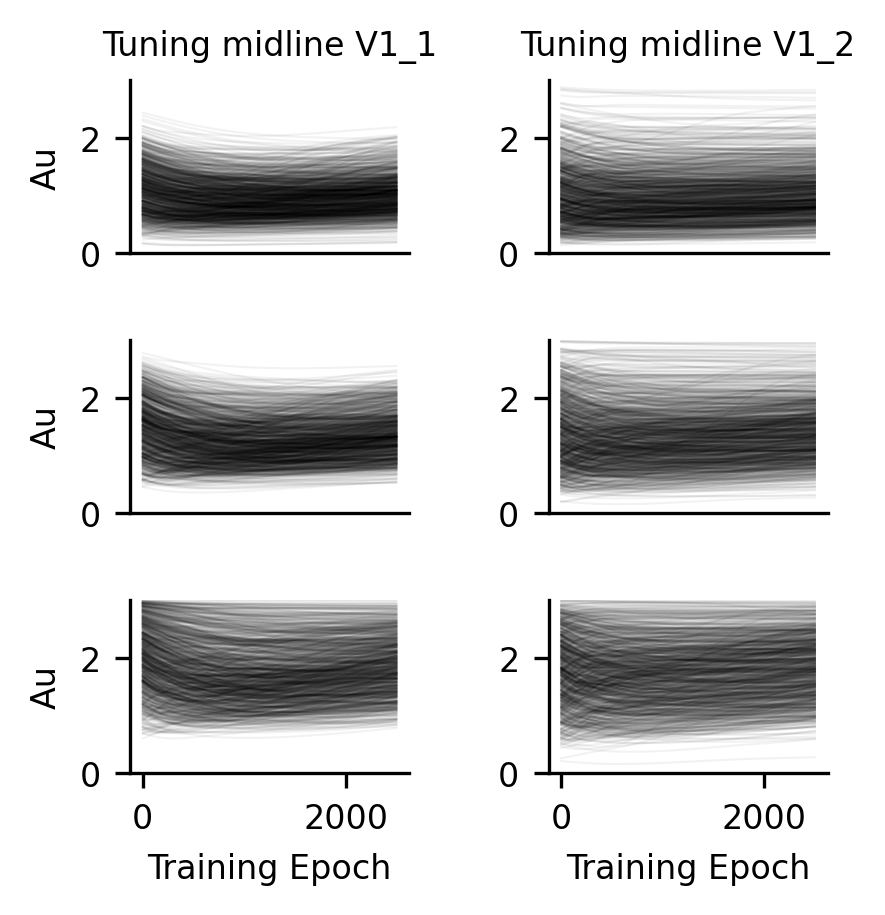

In [161]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 3

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Tuning midline V1_{i+1}", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Au", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['ampm'][0], plot_bounds['ampm'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_ampm_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

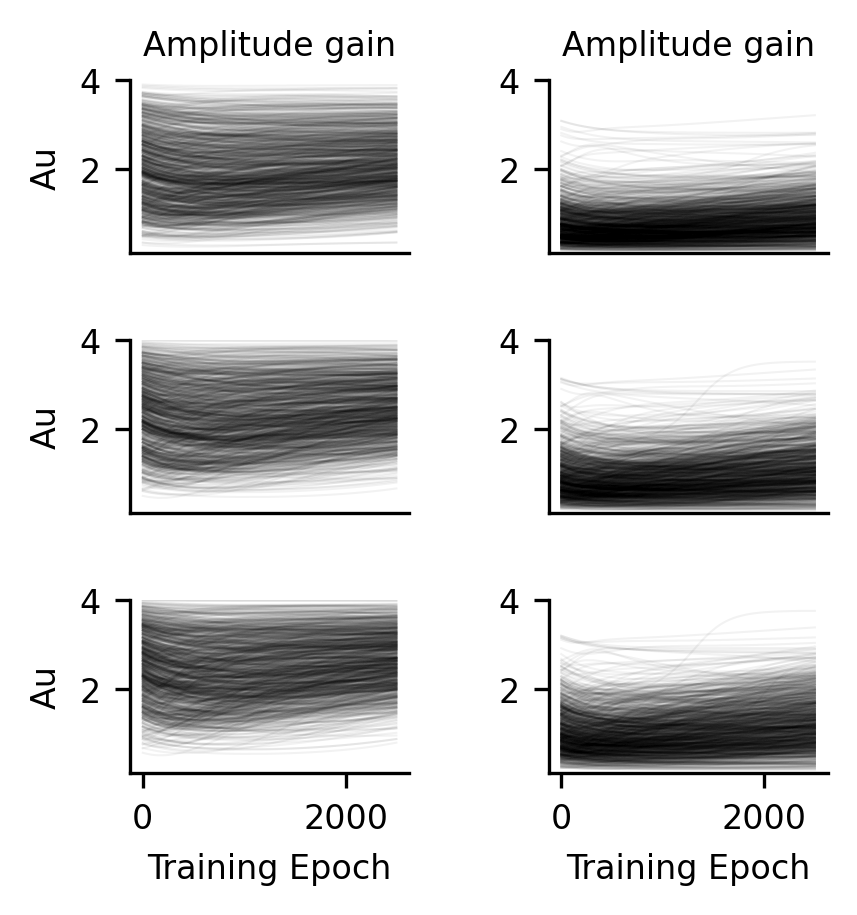

In [162]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 4

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Amplitude gain", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Au", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['ampg'][0], plot_bounds['ampg'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_ampg_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

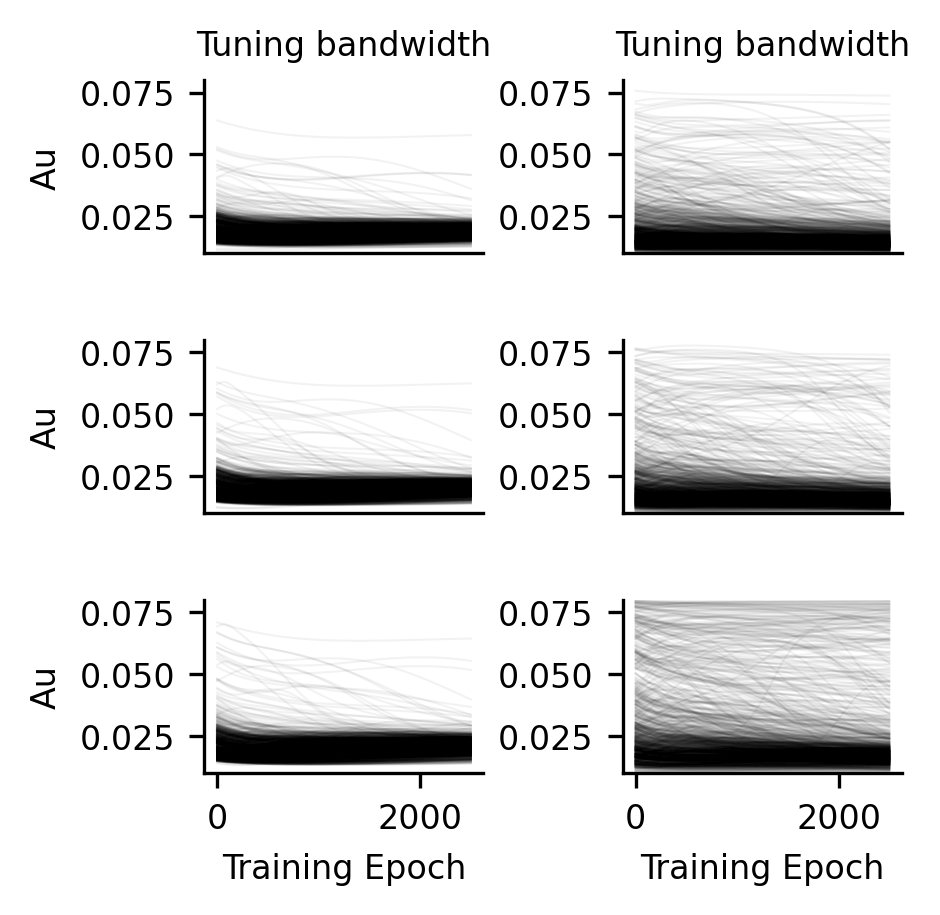

In [163]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 5

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Tuning bandwidth", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Au", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['ampw'][0], plot_bounds['ampw'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_ampw_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

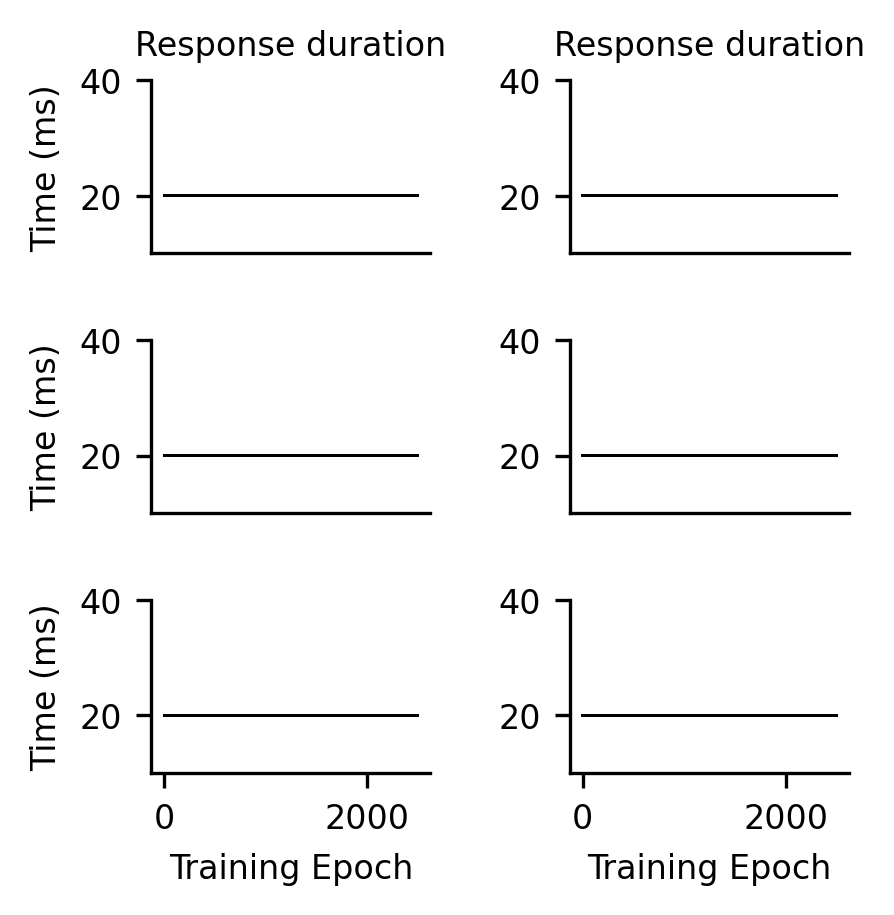

In [164]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 6

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Response duration", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Time (ms)", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['d'][0], plot_bounds['d'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_d_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

In [165]:
res = param_history['dLGN_params'].squeeze()
print(res.shape[2:])
n_samples, n_epochs = res.shape[:2]
n_params = np.prod(res.shape[2:])# + np.prod(r2.shape[2:])

res = res.reshape(res.shape[0] * res.shape[1], np.prod(res.shape[2:]))

(2, 3, 7)


In [166]:
pca = PCA() # all epochs included
res_transformed_pca = pca.fit_transform(res).reshape(n_samples, n_epochs, n_params)

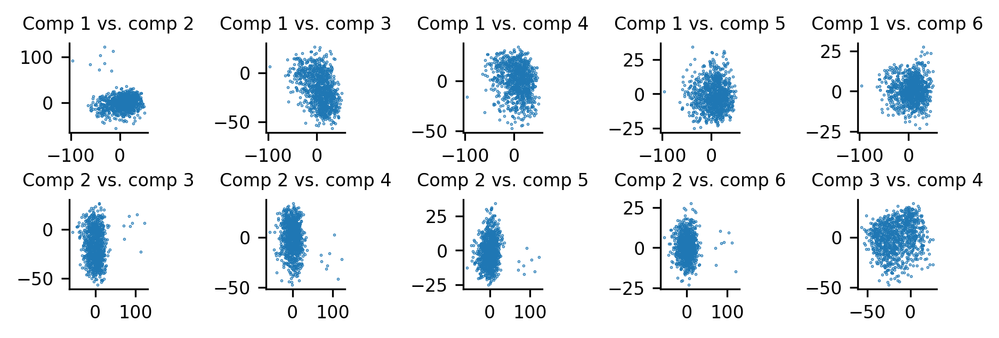

In [167]:
fig, ax = plt.subplots(2,5, figsize = (7,2))

comp_pairs = (list(combinations(np.arange(6), 2)))
i = 0
for row in range(2):
    for col in range(5):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        c0, c1 = comp_pairs[i]
        ax[row, col].scatter(res_transformed_pca[:,-1,c0], res_transformed_pca[:,-1,c1], s = 0.1) # last epoch
        ax[row, col].set_title(f"Comp {c0+1} vs. comp {c1+1}", fontsize = fontsize)
        i+=1

fig.subplots_adjust(hspace = 0.75, wspace = 1.5)
figname = '2d_model_pcaprojection_first_round.svg'
savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
plt.savefig(savepath, transparent = False, facecolor = 'white',
           bbox_inches = 'tight', dpi = 300)

In [168]:
lgn_params = [
    'Frequency-time slope',
    'Onset time',
    'Tuning center',
    'Tuning midline',
    'Tuning gain',
    'Tuning bandwidth',
    'Response duration'
]

v1_params = [
    'Inhibition delay',
    'Inhibition weight'
]

lgn_units = [
    'dLGN_1 into V1_1',
    'dLGN_2 into V1_1',
    'dLGN_3 into V1_1',
    'dLGN_1 into V1_2',
    'dLGN_2 into V1_2',
    'dLGN_3 into V1_2',
]

v1_units = [
    'V1_1',
    'V1_2'
]

full_lgn_params = []
for unit in lgn_units:
    for param in lgn_params:
        full_lgn_params.append(f"{param} ({unit})")

full_v1_params = []
for unit in v1_units:
    for param in v1_params:
        full_v1_params.append(f"{param} ({unit})")
        
param_names = full_lgn_params+full_v1_params

In [169]:
# for i in range(10):
#     fig, ax = plt.subplots(figsize = (8, 4))
#     ax.tick_params(labelsize = fontsize)
#     ax.spines['top'].set_visible(False)
#     ax.spines['right'].set_visible(False)
#     ax.bar(np.arange(len(full_lgn_params)), np.abs(pca.components_[i]))
#     ax.set_xticks(np.arange(len(full_lgn_params)))
#     ax.set_xticklabels(param_names[:len(full_lgn_params)], rotation = 90)
#     ax.set_ylabel("Loading scores", fontsize = fontsize)
#     ax.set_title(f"Component {i+1}", fontsize = fontsize)

#     figname = f'2d_model_pca_loadings_pc{i+1}_first_round.svg'
#     savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
#     plt.savefig(savepath, transparent = False, facecolor = 'white',
#             bbox_inches = 'tight', dpi = 300)

## Clipped fts, fti, and duration

In [170]:
param_bounds_1 = {
    "fts": [0, 0],
    "t": [tv1_1, tv1_1],
    "ampc": [0.01, 0.1],
    'ampm': [0,3],
    "ampg": [0.1, 4],
    "ampw": [0.01,0.08],
    "d": [20, 20],
    "inh_d": [0, 40],
    "inh_w": [0, 3],
}

param_bounds_2 = {
    "fts": [0, 0],
    "t": [tv1_2, tv1_2],
    "ampc": [0.01, 0.1],
    'ampm': [0,3],
    "ampg": [0.1, 4],
    "ampw": [0.01,0.08],
    "d": [20, 20],
    "inh_d": [0, 40],
    "inh_w": [0, 3],
}

bounds = [param_bounds_1, param_bounds_2]

In [171]:
model = SGCCircuit(bounds)

In [172]:
p = {x[0]:x[1] + tf.random.uniform(x[1].shape, -0.75, 0.75) 
    for x in optimized_model['final_epoch_params'].items()}

In [173]:
model.load_saved_parameters(p)

In [174]:
# initialize the optimizer
optimizer = Optimize(model, epochs=2500, loss_threshold=0)

# fit the model
optimizer.fit(X, Y_true)

Optimizer initialized with <keras.optimizers.optimizer_v2.adam.Adam object at 0x00000297F3E74340>
Training step = 0, N_exploration_samples = 1000,
min_loss = 0.24463525414466858
med_loss = 0.8759627938270569
max_loss = 4.8729095458984375

Training step = 100, N_exploration_samples = 1000,
min_loss = 0.22145065665245056
med_loss = 0.6102180480957031
max_loss = 3.5843453407287598

Training step = 200, N_exploration_samples = 1000,
min_loss = 0.20946592092514038
med_loss = 0.47119784355163574
max_loss = 2.6903176307678223

Training step = 300, N_exploration_samples = 1000,
min_loss = 0.20489241182804108
med_loss = 0.3845710754394531
max_loss = 2.0583832263946533

Training step = 400, N_exploration_samples = 1000,
min_loss = 0.20279298722743988
med_loss = 0.33215194940567017
max_loss = 1.6046130657196045

Training step = 500, N_exploration_samples = 1000,
min_loss = 0.20152030885219574
med_loss = 0.2973532974720001
max_loss = 1.2753421068191528

Training step = 600, N_exploration_samples =

<tf.Tensor: shape=(2500, 1000), dtype=float16, numpy=
array([[1.109 , 0.2764, 0.784 , ..., 1.94  , 1.891 , 1.346 ],
       [1.105 , 0.276 , 0.7817, ..., 1.935 , 1.883 , 1.341 ],
       [1.102 , 0.2751, 0.7793, ..., 1.929 , 1.876 , 1.336 ],
       ...,
       [0.2345, 0.1976, 0.205 , ..., 0.2173, 0.2291, 0.2317],
       [0.2345, 0.1975, 0.205 , ..., 0.2173, 0.2291, 0.2317],
       [0.2345, 0.1975, 0.205 , ..., 0.2173, 0.2291, 0.2317]],
      dtype=float16)>

In [175]:
optimizer.save_state('conditional_optimization_clipped_fts_fti_duration')

In [176]:
loss_decay = optimizer.outputs['loss_decay']

In [177]:
param_history = optimizer.outputs['param_history']

In [178]:
last_epoch = loss_decay[-1]
best = np.where(last_epoch == last_epoch.min())[0][0]
print(f"Index of best parameters: {best}, loss = {last_epoch[best]}")

Index of best parameters: 39, loss = 0.1966552734375


In [179]:
def minmax_norm(array, lower, upper):
    if (array.max() - array.min()) != 0:
        norm = (array - array.min()) / (array.max() - array.min())
        return lower + (norm * (upper-lower))
    else:
        return array

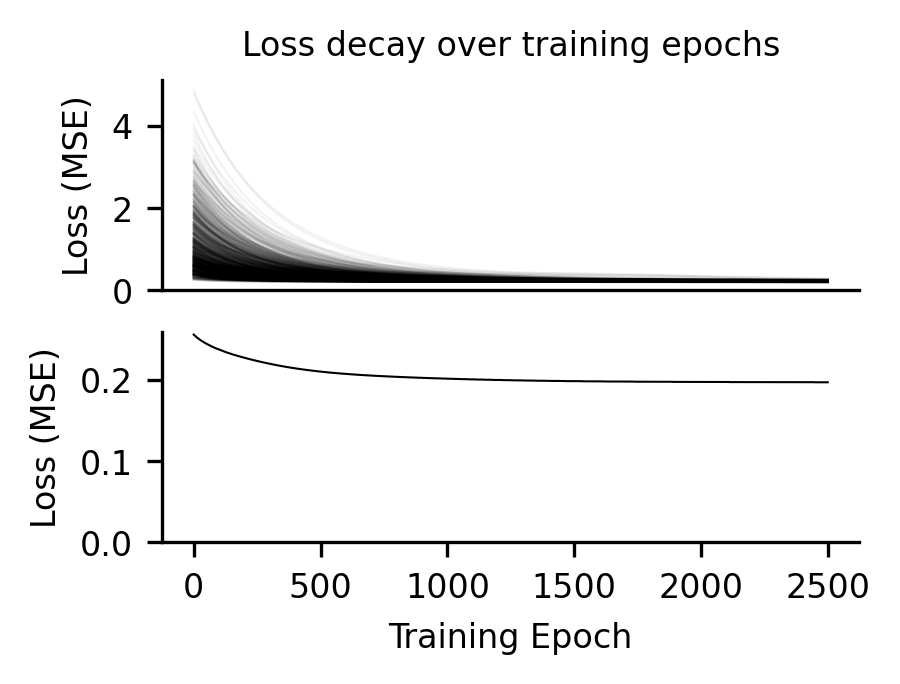

In [180]:
fig, ax = plt.subplots(2, figsize = (3,2))

for i, decay in enumerate(loss_decay.T):
    ax[0].plot(decay, alpha = 0.05, color = 'black', linewidth = linewidth)

ax[1].set_xlabel("Training Epoch", fontsize = fontsize)
ax[0].set_ylabel("Loss (MSE)", fontsize = fontsize)
ax[0].set_ylim(0,)
ax[0].set_xticks([])

ax[1].set_ylabel("Loss (MSE)", fontsize = fontsize)
ax[1].plot(loss_decay[:,best], alpha = 1, color = 'black', linewidth = linewidth)
ax[1].set_ylim(0.)
ax[0].set_title("Loss decay over training epochs", fontsize = fontsize)

for i in range(2):
    ax[i].tick_params(labelsize = fontsize)
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['right'].set_visible(False)

figname = '2d_model_loss_decay_first_round.svg'
savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
plt.savefig(savepath, transparent = False, facecolor = 'white',
           bbox_inches = 'tight', dpi = 300)

Text(0.5, 1.0, 'Loss distribution on final training epoch')

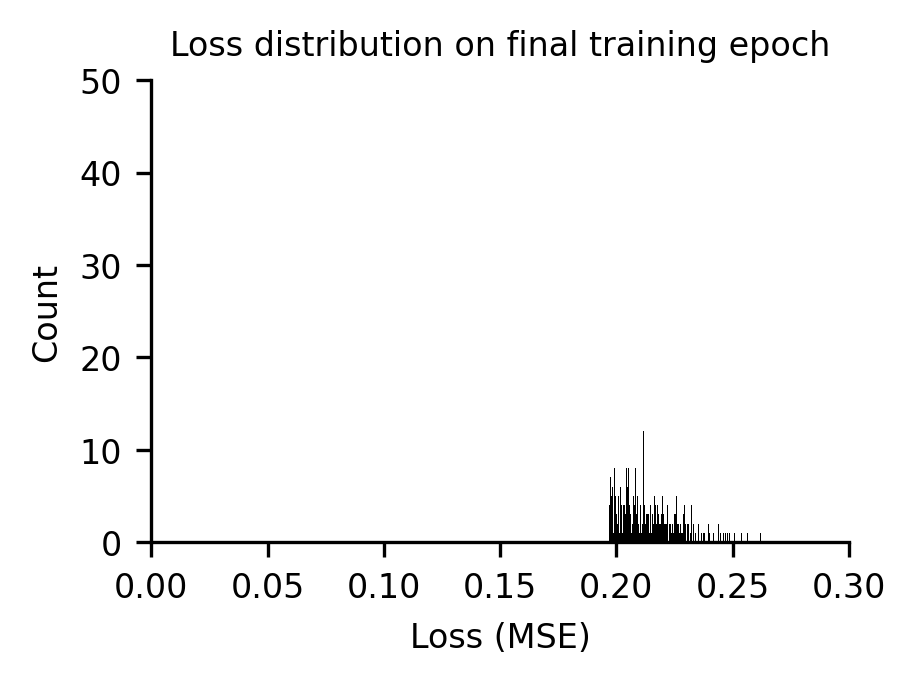

In [181]:
fig, ax = plt.subplots(figsize = (3,2))
ax.hist(loss_decay[-1], bins = 1000, color = 'black')
ax.tick_params(labelsize = fontsize)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_ylabel("Count", fontsize = fontsize)
ax.set_xlabel("Loss (MSE)", fontsize = fontsize)
ax.set_xticks(np.arange(0,0.35,0.05))
ax.set_ylim(0,50)
ax.set_title("Loss distribution on final training epoch", fontsize = fontsize)

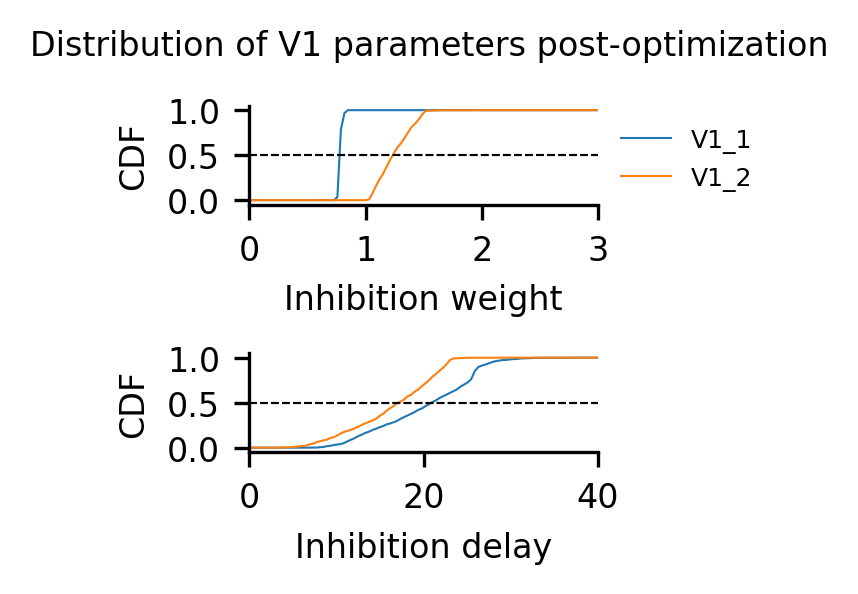

In [182]:
fig, ax = plt.subplots(2,1, figsize = (1.5, 1.5))

for i in range(2):
    i_ = np.abs(i-1)
    for u in range(2):
        x = np.linspace(
            list(plot_bounds.values())[-1-i][0],
            list(plot_bounds.values())[-1-i][1],
            100
        )
        data = param_history['V1_params'][:,-1,u,0,i_,0,0]
        kde = ecdf(data).cdf
        y = kde.evaluate(x)

        ax[i].plot(x,y, label = f'V1_{u+1}', linewidth = linewidth)
        ax[i].plot(x, np.full(len(x), 0.5), '--', color = 'black', linewidth = linewidth)
        ax[i].set_xlim(
            list(plot_bounds.values())[-1-i][0],
            list(plot_bounds.values())[-1-i][1]
        )
        ax[i].set_ylabel("CDF", fontsize = fontsize)
        ax[i].set_yticks(np.arange(0, 1.5, 0.5))
        ax[i].spines['top'].set_visible(False)
        ax[i].spines['right'].set_visible(False)
        ax[i].tick_params(labelsize = fontsize)

ax[0].set_xlabel('Inhibition weight', fontsize = fontsize)
ax[1].set_xlabel('Inhibition delay', fontsize = fontsize)
ax[0].legend(fontsize = 6, frameon = False, bbox_to_anchor = (1,1))
fig.subplots_adjust(hspace=1.5)
plt.suptitle("Distribution of V1 parameters post-optimization", fontsize = fontsize, x = 0.525, y = 1.05)

figname = '2d_model_v1_param_density_func_first_round.svg'
savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
plt.savefig(savepath, transparent = False, facecolor = 'white',
           bbox_inches = 'tight', dpi = 300)

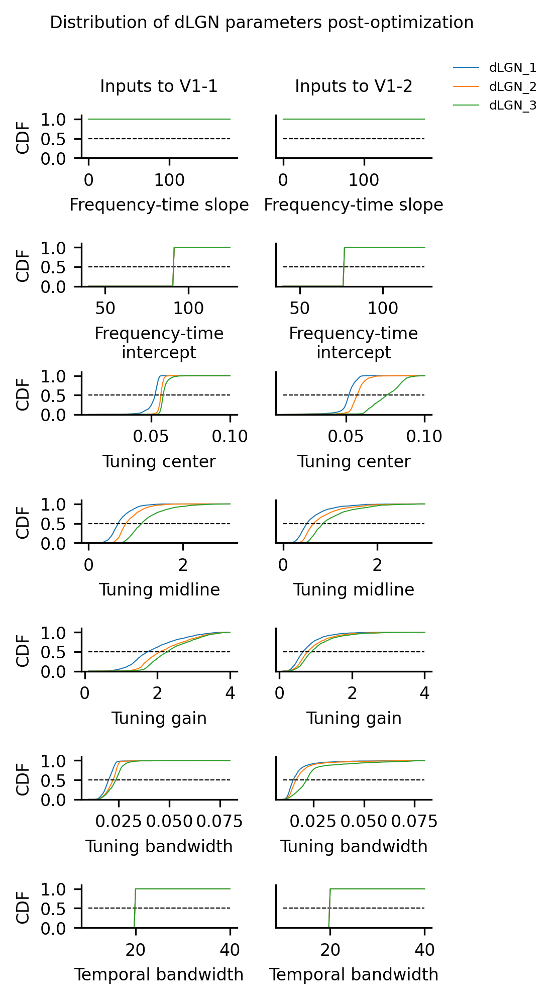

In [183]:
fig, ax = plt.subplots(7,2, figsize = (3,7))

param_labels = [
    'Frequency-time slope',
    'Frequency-time\nintercept',
    'Tuning center',
    'Tuning midline',
    'Tuning gain',
    'Tuning bandwidth',
    'Temporal bandwidth'
]

neuron_labels = [f'dLGN_{i+1}' for i in range(3)]


for row in range(7):
    ymax = []
    for i in range(3):
        for u in range(2):
            data = param_history['dLGN_params'][:,-1,u,i,row,0,0]
            x = np.linspace(
                list(plot_bounds.values())[:7][row][0],
                list(plot_bounds.values())[:7][row][1], 
                100
            )
            kde = ecdf(data).cdf
            y = kde.evaluate(x)

            ymax.append(y.max())

            ax[row, u].plot(x, np.full(len(x), 0.5), '--', color = 'black', linewidth = linewidth)
            ax[row, u].plot(x, y, label = neuron_labels[i], linewidth = linewidth)
            ax[row, u].set_xlabel(param_labels[row], fontsize = fontsize)
            ax[row, u].tick_params(labelsize = fontsize)

    ax[row, 0].set_ylabel("CDF", fontsize = fontsize)
    for u in range(2):
        ax[row, u].set_ylim(0, 1.1)
        ax[row, 1].set_yticks([])
        ax[row, 0].set_yticks(np.arange(0, 1.5, 0.5))
        ax[row, u].spines['top'].set_visible(False)
        ax[row, u].spines['right'].set_visible(False)

fig.subplots_adjust(hspace = 2, wspace=0.25)
plt.tick_params(labelsize = 8)
ax[0,1].legend(fontsize = 6, bbox_to_anchor = (1.75,2.5), frameon = False)
ax[0,0].set_title("Inputs to V1-1", fontsize = fontsize, y = 1.25)
ax[0,1].set_title("Inputs to V1-2", fontsize = fontsize, y = 1.25)
plt.suptitle("Distribution of dLGN parameters post-optimization", fontsize = fontsize, x = 0.525, y = 0.975)

figname = '2d_model_dlgn_param_density_func_first_round.svg'
savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
plt.savefig(savepath, transparent = False, facecolor = 'white',
           bbox_inches = 'tight', dpi = 300)

Text(0.5, 1.15, 'Convergence of V1 parameter values')

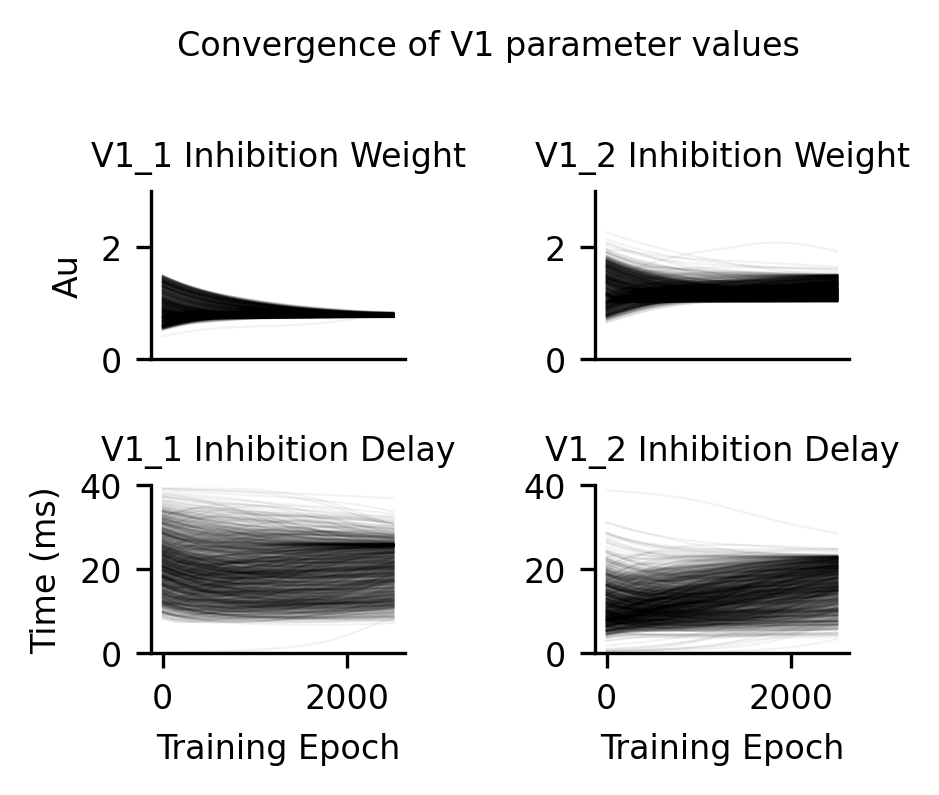

In [184]:
## inhibition weight::inhibition delay

fig, ax = plt.subplots(2,2, figsize = (3,2))

inh_w = 1
v1_n = 0 

for row in range(2):
    for col in range(2):
        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

ax[0,0].plot(
    param_history['V1_params'][:,:,v1_n,0,inh_w,0,0].T,
    linewidth=linewidth,
    alpha=0.05,
    color = 'black'
)

# 
v1_n = 1
ax[0,1].plot(
    param_history['V1_params'][:,:,v1_n,0,inh_w,0,0].T,
    linewidth=linewidth,
    alpha=0.05,
    color = 'black'
)

# a0
inh_d = 0
v1_n = 0
ax[1,0].plot(
    param_history['V1_params'][:,:,v1_n,0,inh_d,0,0].T,
    linewidth=linewidth,
    alpha=0.05,
    color = 'black'
)

# a1
v1_n = 1
ax[1,1].plot(
    param_history['V1_params'][:,:,v1_n,0,inh_d,0,0].T,
    linewidth=linewidth,
    alpha=0.05,
    color = 'black'
)

ax[0,0].set_ylim(plot_bounds['inh_w'][0], plot_bounds['inh_w'][1])
ax[0,0].set_title("V1_1 Inhibition Weight", fontsize = fontsize)
ax[0,0].set_xticks([])
ax[0,0].set_ylabel("Au", fontsize = fontsize)

ax[0,1].set_ylim(plot_bounds['inh_w'][0], plot_bounds['inh_w'][1])
ax[0,1].set_title("V1_2 Inhibition Weight", fontsize = fontsize)
ax[0,1].set_xticks([])

ax[1,0].set_ylim(plot_bounds['inh_d'][0], plot_bounds['inh_d'][1])
ax[1,0].set_title("V1_1 Inhibition Delay", fontsize = fontsize)
ax[1,0].set_ylabel("Time (ms)", fontsize = fontsize)
ax[1,0].set_xlabel("Training Epoch", fontsize = fontsize)

ax[1,1].set_ylim(plot_bounds['inh_d'][0], plot_bounds['inh_d'][1])
ax[1,1].set_title("V1_2 Inhibition Delay", fontsize = fontsize)
ax[1,1].set_xlabel("Training Epoch", fontsize = fontsize)
fig.subplots_adjust(wspace=0.75, hspace=0.75)
plt.suptitle("Convergence of V1 parameter values", fontsize = fontsize, y = 1.15)

# figname = '2d_model_v1_param_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

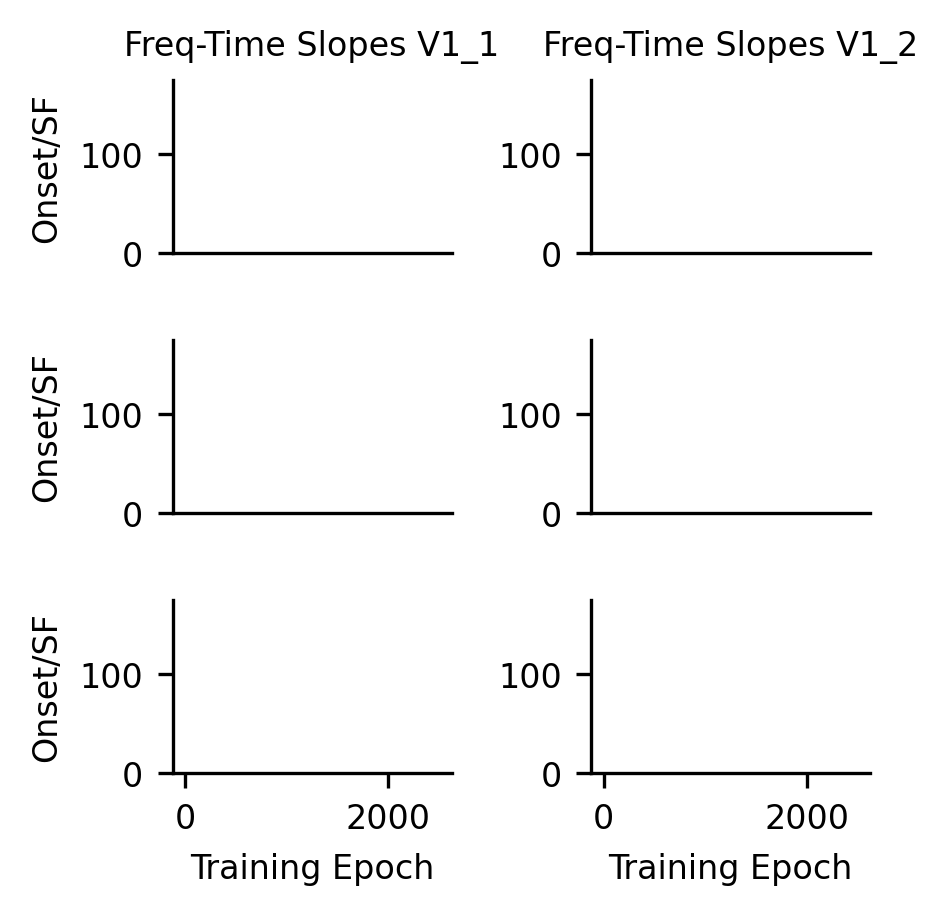

In [185]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 0

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Freq-Time Slopes V1_{i+1}", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Onset/SF", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['fts'][0], plot_bounds['fts'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_fts_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

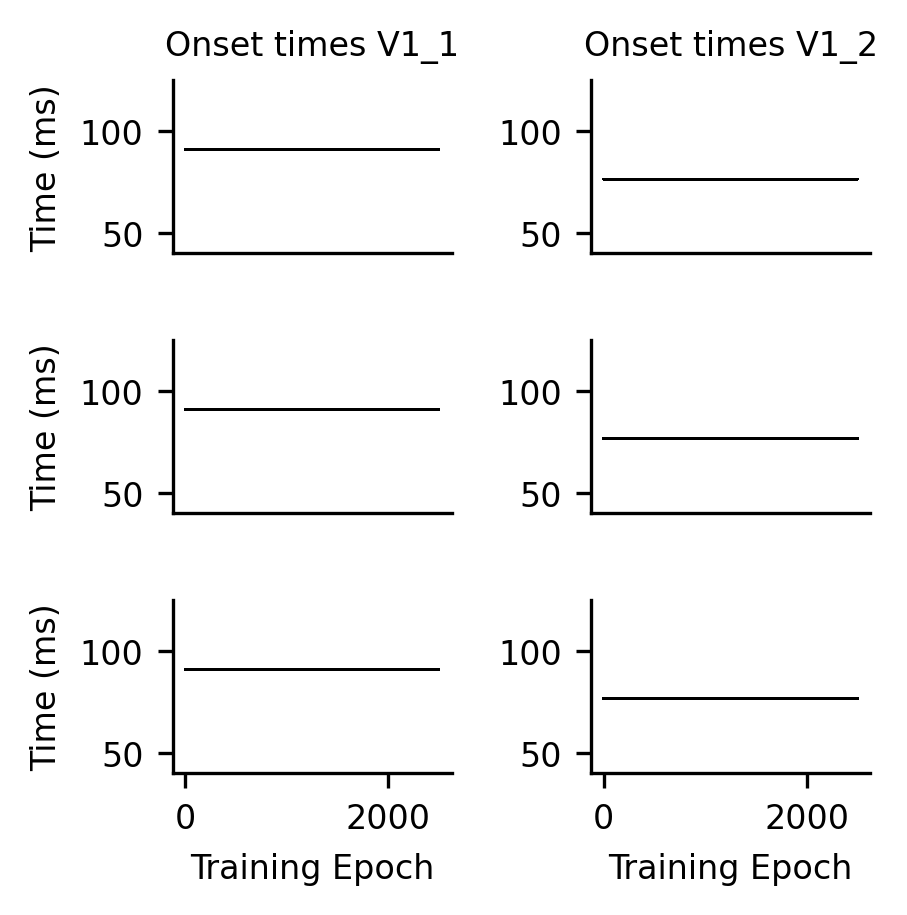

In [186]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 1

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Onset times V1_{i+1}", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Time (ms)", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['t'][0], plot_bounds['t'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_t_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

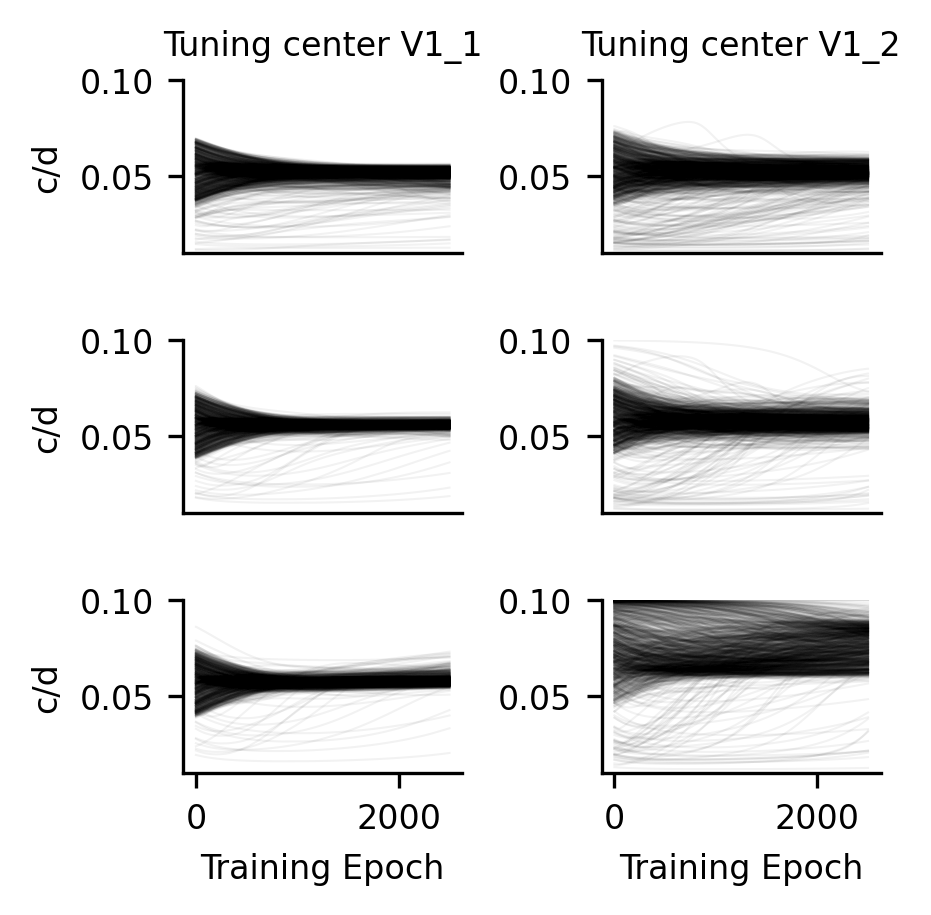

In [187]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 2

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Tuning center V1_{i+1}", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("c/d", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['ampc'][0], plot_bounds['ampc'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_ampc_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

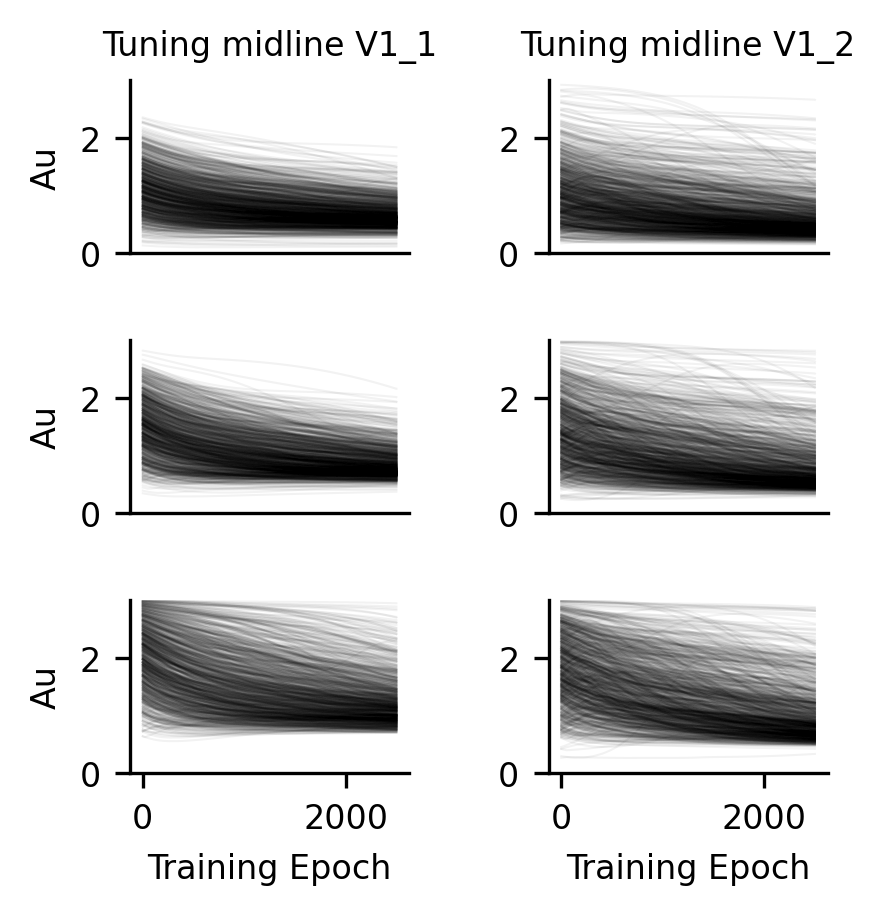

In [188]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 3

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Tuning midline V1_{i+1}", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Au", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['ampm'][0], plot_bounds['ampm'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_ampm_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

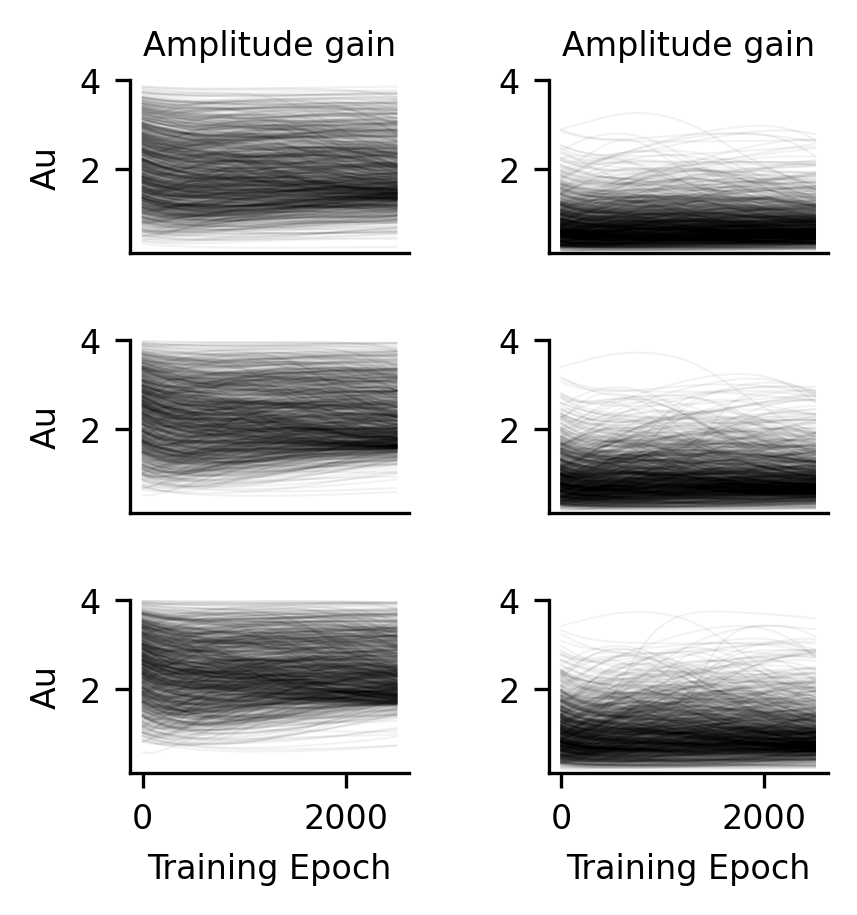

In [189]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 4

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Amplitude gain", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Au", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['ampg'][0], plot_bounds['ampg'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_ampg_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

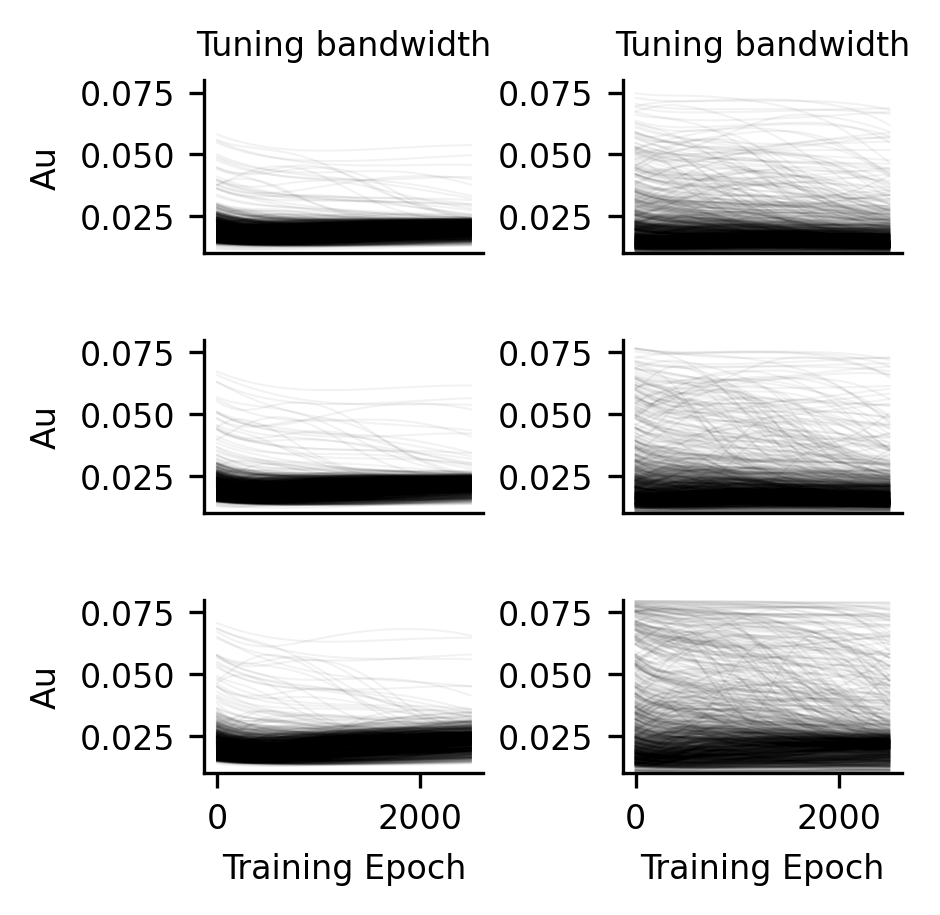

In [190]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 5

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Tuning bandwidth", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Au", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['ampw'][0], plot_bounds['ampw'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_ampw_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

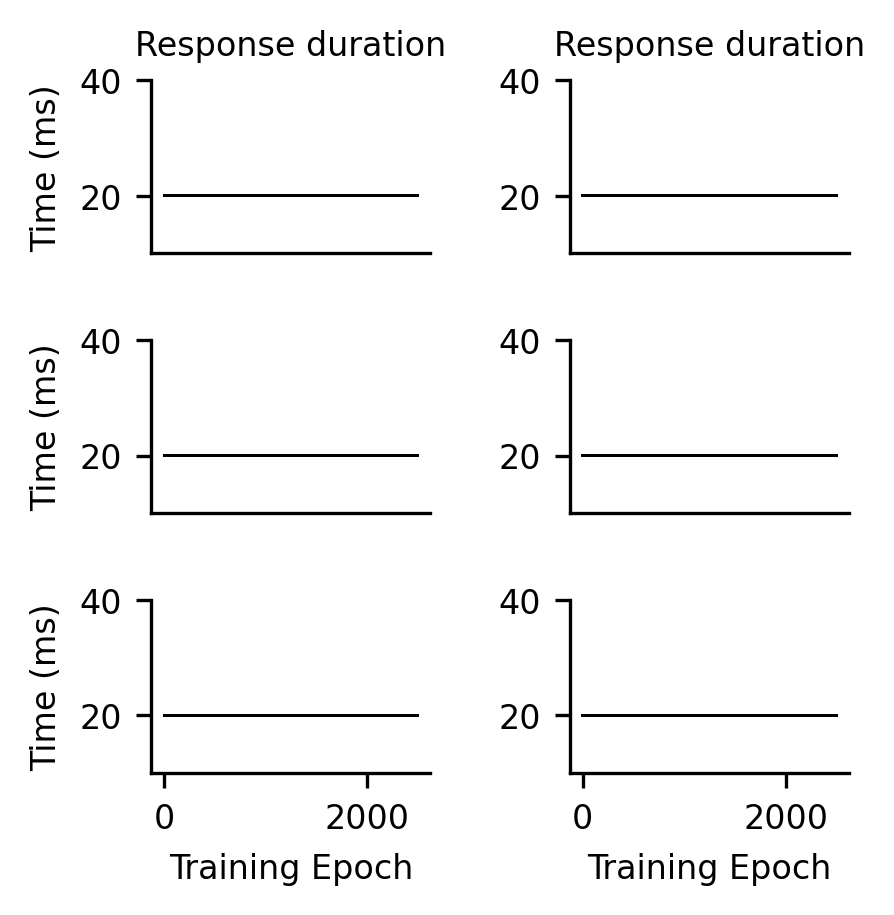

In [191]:
fig, ax = plt.subplots(3,2, figsize = (3,3))
norm = plt.Normalize(0, 1)

param = 6

for col in range(2):
    for row in range(3):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        data = param_history['dLGN_params'][:,:,col,row,param,0,0].T
        ax[row,col].plot(
        param_history['dLGN_params'][:,:,col,row,param,0,0].T,
            linewidth=linewidth,
            alpha=0.05,
            color='black'
        )

for i in range(2):
    ax[0,i].set_title(f"Response duration", fontsize = fontsize)
for i in range(3):
    ax[i,0].set_ylabel("Time (ms)", fontsize = fontsize)
for row in range(2):
    for col in range(2):
        ax[row,col].set_xticks([])
for row in range(3):
    for col in range(2):
        ax[row,col].set_ylim(plot_bounds['d'][0], plot_bounds['d'][1])
for i in range(2):
    ax[2,i].set_xlabel("Training Epoch", fontsize = fontsize)

fig.subplots_adjust(wspace=0.5, hspace=0.5)

# figname = '2d_model_d_convergence_first_round.svg'
# savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
# plt.savefig(savepath, transparent = False, facecolor = 'white',
#            bbox_inches = 'tight', dpi = 300)

In [192]:
res = param_history['dLGN_params'].squeeze()
print(res.shape[2:])
n_samples, n_epochs = res.shape[:2]
n_params = np.prod(res.shape[2:])# + np.prod(r2.shape[2:])

res = res.reshape(res.shape[0] * res.shape[1], np.prod(res.shape[2:]))

(2, 3, 7)


In [193]:
pca = PCA() # all epochs included
res_transformed_pca = pca.fit_transform(res).reshape(n_samples, n_epochs, n_params)

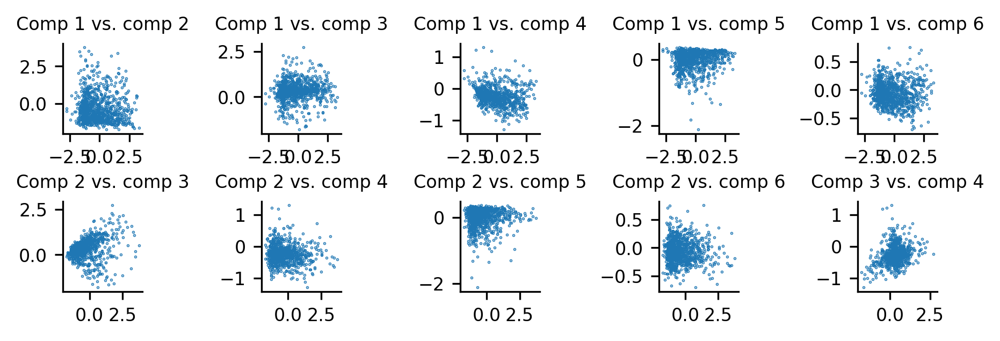

In [194]:
fig, ax = plt.subplots(2,5, figsize = (7,2))

comp_pairs = (list(combinations(np.arange(6), 2)))
i = 0
for row in range(2):
    for col in range(5):

        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].tick_params(labelsize = fontsize)

        c0, c1 = comp_pairs[i]
        ax[row, col].scatter(res_transformed_pca[:,-1,c0], res_transformed_pca[:,-1,c1], s = 0.1) # last epoch
        ax[row, col].set_title(f"Comp {c0+1} vs. comp {c1+1}", fontsize = fontsize)
        i+=1

fig.subplots_adjust(hspace = 0.75, wspace = 1.5)
figname = '2d_model_pcaprojection_first_round.svg'
savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
plt.savefig(savepath, transparent = False, facecolor = 'white',
           bbox_inches = 'tight', dpi = 300)

In [195]:
lgn_params = [
    'Frequency-time slope',
    'Onset time',
    'Tuning center',
    'Tuning midline',
    'Tuning gain',
    'Tuning bandwidth',
    'Response duration'
]

v1_params = [
    'Inhibition delay',
    'Inhibition weight'
]

lgn_units = [
    'dLGN_1 into V1_1',
    'dLGN_2 into V1_1',
    'dLGN_3 into V1_1',
    'dLGN_1 into V1_2',
    'dLGN_2 into V1_2',
    'dLGN_3 into V1_2',
]

v1_units = [
    'V1_1',
    'V1_2'
]

full_lgn_params = []
for unit in lgn_units:
    for param in lgn_params:
        full_lgn_params.append(f"{param} ({unit})")

full_v1_params = []
for unit in v1_units:
    for param in v1_params:
        full_v1_params.append(f"{param} ({unit})")
        
param_names = full_lgn_params+full_v1_params

In [196]:
# for i in range(10):
#     fig, ax = plt.subplots(figsize = (8, 4))
#     ax.tick_params(labelsize = fontsize)
#     ax.spines['top'].set_visible(False)
#     ax.spines['right'].set_visible(False)
#     ax.bar(np.arange(len(full_lgn_params)), np.abs(pca.components_[i]))
#     ax.set_xticks(np.arange(len(full_lgn_params)))
#     ax.set_xticklabels(param_names[:len(full_lgn_params)], rotation = 90)
#     ax.set_ylabel("Loading scores", fontsize = fontsize)
#     ax.set_title(f"Component {i+1}", fontsize = fontsize)

#     figname = f'2d_model_pca_loadings_pc{i+1}_first_round.svg'
#     savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
#     plt.savefig(savepath, transparent = False, facecolor = 'white',
#             bbox_inches = 'tight', dpi = 300)